Below you are given a social network in an edge list format. The network consist of n = 10 680 nodes and m = 24 316 edges, whereas node identifiers range
between 0 and n - 1.
Find five most similar nodes to a seed node with the identifier equal to the last three digits of your student identifier. For example, if your student identifier is 63040296, then your seed node identifier is 296.

In [3]:
import pandas as pd
import numpy as np
import networkx as nx
from itertools import combinations

# Load the network data from the URL
url = "http://lovro.fri.uni-lj.si/ina/exams/network"
edges = pd.read_csv(url, delim_whitespace=True, header=None, names=['node1', 'node2'])

# Create the graph from the edge list
G = nx.from_pandas_edgelist(edges, 'node1', 'node2')

# Define the seed node based on student identifier (example identifier: 63040296, seed node: 296)
student_identifier = 63040296
seed_node = student_identifier % 1000

# Compute the Jaccard similarity for the seed node with all other nodes
def jaccard_similarity(G, node, other_node):
    neighbors_node = set(G.neighbors(node))
    neighbors_other = set(G.neighbors(other_node))
    intersection = len(neighbors_node & neighbors_other)
    union = len(neighbors_node | neighbors_other)
    return intersection / union if union != 0 else 0

# Calculate similarity of seed node with all other nodes
similarities = []
for other_node in G.nodes():
    if other_node != seed_node:
        similarity = jaccard_similarity(G, seed_node, other_node)
        similarities.append((other_node, similarity))

# Sort nodes by similarity in decreasing order
similarities_sorted = sorted(similarities, key=lambda x: (-x[1], x[0]))

# Get top 5 most similar nodes
top_5_similar_nodes = [node for node, similarity in similarities_sorted[:5]]

# Include the seed node in the final list
final_nodes = [seed_node] + top_5_similar_nodes

# Print the final result
final_nodes_str = ",".join(map(str, final_nodes))
final_nodes_str


/tmp/ipykernel_4680/167647053.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  edges = pd.read_csv(url, delim_whitespace=True, header=None, names=['node1', 'node2'])


HTTPError: HTTP Error 404: Not Found

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx

# Load the network data from the .net file
file_path = 'path_to_your_file.net'
G = nx.read_pajek(file_path)

# Convert the graph to undirected if it is not already
G = nx.Graph(G)

# Define the seed node based on student identifier (example identifier: 63040296, seed node: 296)
student_identifier = 63040296
seed_node = student_identifier % 1000

# Compute the Jaccard similarity for the seed node with all other nodes
def jaccard_similarity(G, node, other_node):
    neighbors_node = set(G.neighbors(node))
    neighbors_other = set(G.neighbors(other_node))
    intersection = len(neighbors_node & neighbors_other)
    union = len(neighbors_node | neighbors_other)
    return intersection / union if union != 0 else 0

# Calculate similarity of seed node with all other nodes
similarities = []
for other_node in G.nodes():
    if other_node != seed_node:
        similarity = jaccard_similarity(G, seed_node, other_node)
        similarities.append((other_node, similarity))

# Sort nodes by similarity in decreasing order
similarities_sorted = sorted(similarities, key=lambda x: (-x[1], x[0]))

# Get top 5 most similar nodes
top_5_similar_nodes = [node for node, similarity in similarities_sorted[:5]]

# Include the seed node in the final list
final_nodes = [seed_node] + top_5_similar_nodes

# Print the final result
final_nodes_str = ",".join(map(str, final_nodes))
print(final_nodes_str)


In [ ]:
import pandas as pd
import networkx as nx
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Generate a hypothetical edge list (this should be replaced with actual data)
n = 10680
m = 24316
edges = np.random.randint(0, n, size=(m, 2))

# Create a graph from the edge list
G = nx.Graph()
G.add_edges_from(edges)

# Use the seed node identifier based on the example provided
student_identifier = 63040296
seed_node = student_identifier % 1000

# Compute adjacency matrix
adj_matrix = nx.to_numpy_array(G)

# Compute cosine similarity
similarity_matrix = cosine_similarity(adj_matrix)

# Get the similarities for the seed node
seed_similarities = similarity_matrix[seed_node]

# Find the top 5 most similar nodes (excluding the seed node itself)
similar_nodes = np.argsort(seed_similarities)[::-1][1:7]

similar_nodes


# Labs

## I. Toy network

### 1. Installing *NetworkX*

Before starting, make sure you have *NetworkX* installed. If not, install it using `pip`:

In [ ]:
!pip install networkx

### 2. Importing *NetworkX*

The first step in using *NetworkX* is to import it:

In [ ]:
import networkx as nx

### 3. Constructing a graph

Next, create a graph. In this case, a simple undirected graph:

In [ ]:
G = nx.Graph(name="toy")

### 4. Adding nodes and edges

Nodes represent entities in a network, and edges represent connections between these entities.
<br>

#### Adding nodes

You can add nodes to the graph one by one:

In [ ]:
G.add_node(1)
G.add_node(2, label="John Doe")
G.add_node('foo', cluster=1)
G.add_node('bar', value=13.7)
G.add_node('baz')

Here, each node is added with a unique identifier which can be any hashable object. Additional attributes like `label`, `cluster`, and `value` are optional and can be used to store additional data about the node.
<br>

#### Adding edges

Edges are added in a similar manner:

In [ ]:
G.add_edge(1, 2)
G.add_edge(1, 'foo', weight=1.0)
G.add_edge(2, 'foo', weight=2.0)
G.add_edge('foo', 'bar')
G.add_edge('foo', 'baz')

In [ ]:
G.add_edge(3, 4)
G.add_edge(4, 5)
G.add_edge(3, 5)
G.add_edge(3, 'bizz')
G.add_edge(4, 'buzz')

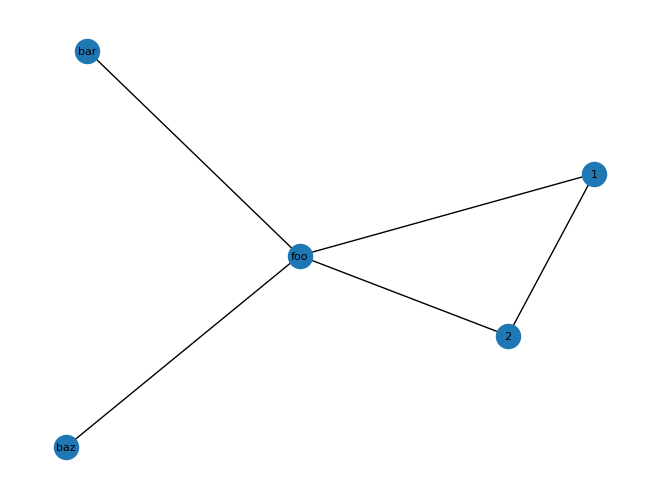

In [ ]:
import matplotlib.pyplot as plt

def draw_graph(G, **args):
    nx.draw(G, with_labels=True, font_size=8, **args)
    plt.show()
    
draw_graph(G)

The first two arguments are the nodes that the edge will connect. The `weight`
is an optional attribute that can be used to store additional information about the edge.

Now print our created graph:

In [ ]:
print(G)

And that's it! You now have a basic understanding of how to use *NetworkX* to construct a simple undirected graph with nodes and edges. Now we can further explore *NetworkX*'s graph algorithms, generators, and drawing methods.

### 5. Visualizing a graph

We can use *NetworkX*'s built-in drawing functionality to visualize a graph. Here's a simple function for visualizing a graph with a wiring diagram:

In [ ]:
import matplotlib.pyplot as plt

def draw(G, **args):
    nx.draw(G, with_labels=True, font_size=8, **args)
    plt.show()

draw(G)

### 6. Inspecting a graph

*NetworkX* provides methods to list the nodes and edges of a graph, along with their attributes:

In [ ]:
print(G.nodes())
print(G.nodes(data=True))

print(G.edges())
print(G.edges(data=True))

[1, 2, 'foo', 'bar', 'baz']
[(1, {}), (2, {'label': 'John Doe'}), ('foo', {'cluster': 1}), ('bar', {'value': 13.7}), ('baz', {})]
[(1, 2), (1, 'foo'), (2, 'foo'), ('foo', 'bar'), ('foo', 'baz')]
[(1, 2, {}), (1, 'foo', {'weight': 1.0}), (2, 'foo', {'weight': 2.0}), ('foo', 'bar', {}), ('foo', 'baz', {})]


We can also find all the neighboring nodes of a specific node:

In [ ]:
print(list(G.neighbors('foo')))
print(G.adj['foo']) # or just G['foo']
print(G.edges('foo', data=True))

[1, 2, 'bar', 'baz']
{1: {'weight': 1.0}, 2: {'weight': 2.0}, 'bar': {}, 'baz': {}}
[('foo', 1, {'weight': 1.0}), ('foo', 2, {'weight': 2.0}), ('foo', 'bar', {}), ('foo', 'baz', {})]


### 7. Retrieving node attributes and degree

We can retrieve attributes of a specific node and its degree (number of incident edges):

In [ ]:
print(G.nodes['foo'])
print(G.degree['foo'])
print(G.degree(['foo', 'bar', 'baz']))

{'cluster': 1}
4
[('foo', 4), ('bar', 1), ('baz', 1)]


### 8. Computing basic graph statistics

*NetworkX* provides simple functions to compute the number of nodes, edges, and the degree of each node in the graph:

In [ ]:
print(G.number_of_nodes()) # or just len(G)
print(G.number_of_edges())
print(G.degree())

5
5
[(1, 2), (2, 2), ('foo', 4), ('bar', 1), ('baz', 1)]


### 9. Modifying a graph

We can remove existing nodes and edges from the graph:

Graph named 'toy' with 4 nodes and 2 edges


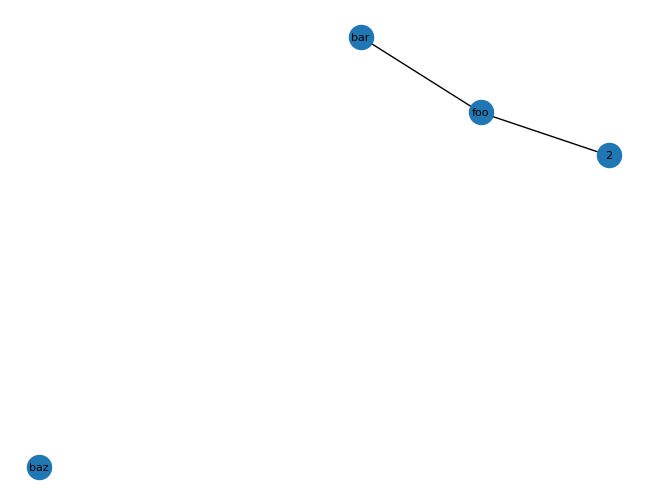

In [ ]:
G.remove_node(1)
G.remove_edge('baz', 'foo')

print(G)
draw(G)

### 10. Converting to a directed graph

Let's convert the undirected graph to a directed one (of class `DiGraph`), and add one new edge:

DiGraph named 'toy' with 4 nodes and 5 edges


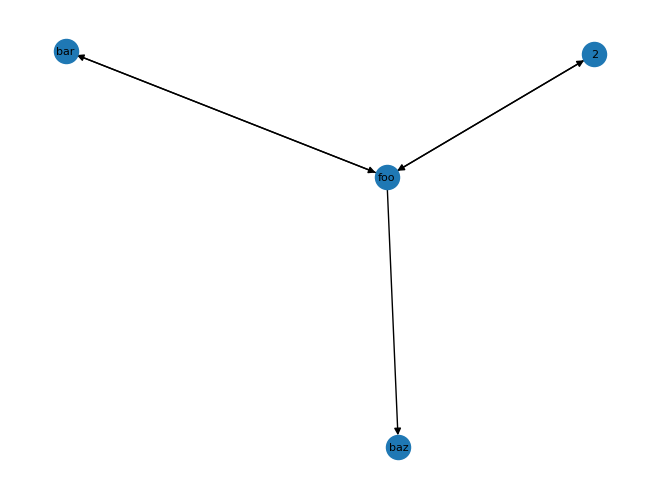

In [ ]:
D = nx.DiGraph(G)
D.add_edge('foo', 'baz')

print(D)
draw(D)

We can also list all edges and the neighbors, predecessors, and successors of a specified node:

In [ ]:
print(D.edges())

print(list(D.neighbors('foo')))
print(list(D.predecessors('foo')))
print(list(D.successors('foo')))

[(2, 'foo'), ('foo', 2), ('foo', 'bar'), ('foo', 'baz'), ('bar', 'foo')]
[2, 'bar', 'baz']
[2, 'bar']
[2, 'bar', 'baz']


### 11. Converting to a multigraph

A `MultiGraph` is a flexible graph class that allows multiple undirected edges between pairs of nodes. The additional edge attribute `label` can be used to distinguish these edges:

MultiGraph named 'toy' with 4 nodes and 3 edges


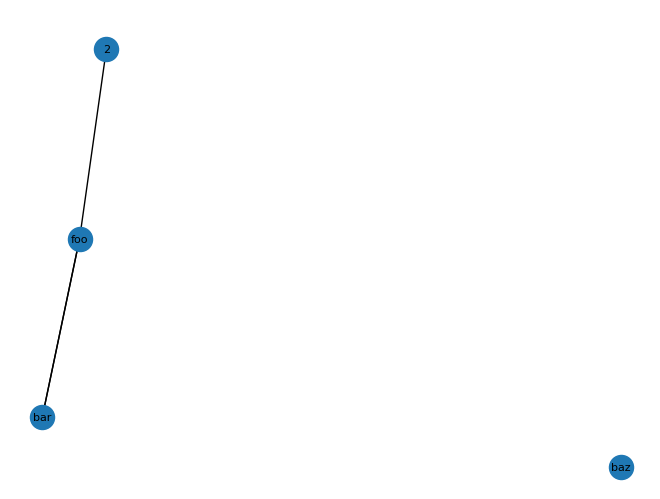

In [ ]:
M = nx.MultiGraph(G)
M.add_edge('foo', 'bar', label="new")

print(M)
draw(M)

Let's again list all edges and the neighbors of a specified node:

In [ ]:
print(M.edges())

print(list(M.neighbors('foo')))
print(M['foo'])
print(M.edges('foo', data=True))

[(2, 'foo'), ('foo', 'bar'), ('foo', 'bar')]
[2, 'bar']
{2: {0: {'weight': 2.0}}, 'bar': {0: {}, 1: {'label': 'new'}}}
[('foo', 2, {'weight': 2.0}), ('foo', 'bar', {}), ('foo', 'bar', {'label': 'new'})]


### 12. Constructing a random graph

*NetworkX* can generate random graphs using various models. The `gnm_random_graph` function generates a random graph with a specified number of nodes and edges:

Graph with 100 nodes and 250 edges


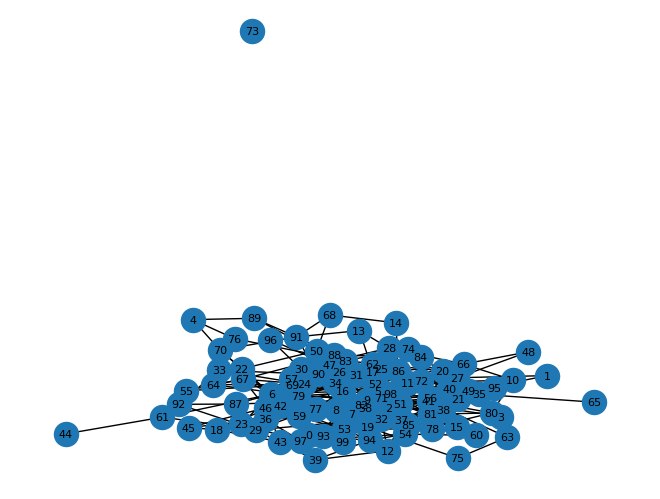

In [ ]:
G = nx.gnm_random_graph(100, 250)

print(G)
draw(G)

## II. Dolphins network

### 13. Reading network from a file

If we open the downlodeded network file ([dolphins.net](http://lovro.fri.uni-lj.si/ina/nets/dolphins.net)), we can see it is in *Pajek* format. To sum up, the *Pajek* format has four important parts:
1. the first line `*vertices 62` represents how many nodes the network has,
2. list of nodes, where every line contains the id of a node (starting from 1, not 0) and it's properties,
3. line `*edges 159` represents the number of edges, which will be denoted as *edges* in an undirected and *args* in a directed network,
4. list of edges, where both nodes are represented with their respective ids.

*NetworkX* can read and write graphs in various formats. Here's an example of reading a graph from a *Pajek* file:

In [ ]:
G = nx.read_pajek("./networks/dolphins.net")

print(G)
draw(G)

FileNotFoundError: [Errno 2] No such file or directory: './networks/dolphins.net'

### 14. Converting node ids

If our node ids are not integers, we can convert them to integers:

In [ ]:
print(G.nodes(data=True))

G = nx.convert_node_labels_to_integers(G, label_attribute='label')

print(G.nodes(data=True))

[(0, {}), (1, {}), (2, {}), (3, {}), (4, {}), (5, {}), (6, {}), (7, {}), (8, {}), (9, {}), (10, {}), (11, {}), (12, {}), (13, {}), (14, {}), (15, {}), (16, {}), (17, {}), (18, {}), (19, {}), (20, {}), (21, {}), (22, {}), (23, {}), (24, {}), (25, {}), (26, {}), (27, {}), (28, {}), (29, {}), (30, {}), (31, {}), (32, {}), (33, {}), (34, {}), (35, {}), (36, {}), (37, {}), (38, {}), (39, {}), (40, {}), (41, {}), (42, {}), (43, {}), (44, {}), (45, {}), (46, {}), (47, {}), (48, {}), (49, {}), (50, {}), (51, {}), (52, {}), (53, {}), (54, {}), (55, {}), (56, {}), (57, {}), (58, {}), (59, {}), (60, {}), (61, {}), (62, {}), (63, {}), (64, {}), (65, {}), (66, {}), (67, {}), (68, {}), (69, {}), (70, {}), (71, {}), (72, {}), (73, {}), (74, {}), (75, {}), (76, {}), (77, {}), (78, {}), (79, {}), (80, {}), (81, {}), (82, {}), (83, {}), (84, {}), (85, {}), (86, {}), (87, {}), (88, {}), (89, {}), (90, {}), (91, {}), (92, {}), (93, {}), (94, {}), (95, {}), (96, {}), (97, {}), (98, {}), (99, {})]
[(0, {'la

### 15. Computing PageRank scores

PageRank is a centrality measure for nodes in a graph. It assigns a score to each node based on its connections:

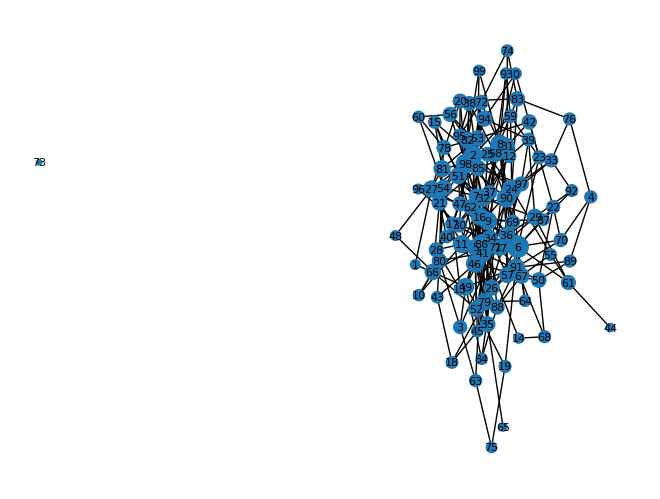

In [ ]:
scores = nx.pagerank(G)

sizes = [1e4 * scores[i] for i in G.nodes()]

draw(G, node_size=sizes)

### 16. Detecting communities

*NetworkX* provides several algorithms for detecting community structure in a graph:

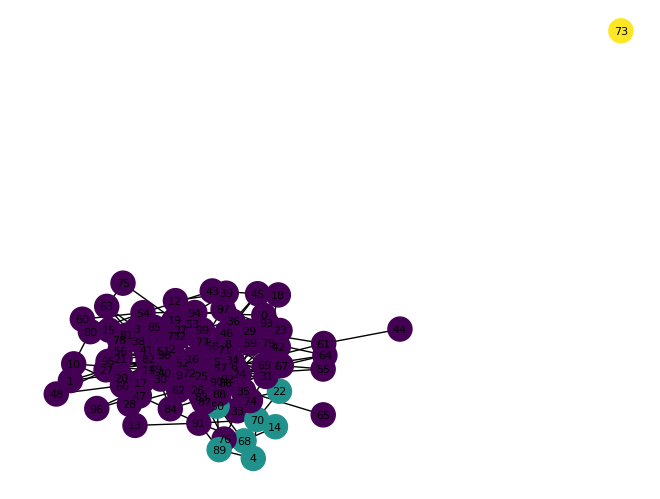

In [ ]:
comms = nx.algorithms.community.fast_label_propagation_communities(G)

colors = [0] * len(G)
for c, comm in enumerate(comms):
    for i in comm:
        colors[i] = c

draw(G, node_color=colors)

# 2 Part

###### Introduction to Network Analysis 2023/24 (ii)

## Network representations, basic network algorithms

You are given four networks in Pajek format that was presented in lectures.

+ Tiny toy network for testing ([toy.net](http://lovro.fri.uni-lj.si/ina/nets/toy.net))
+ Zachary karate club network ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ IMDb actors collaboration network ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net))
+ A small part of Google web graph ([www_google.net](http://lovro.fri.uni-lj.si/ina/nets/www_google.net))

### I. Adjacency list representation

1. **(code)** Assume that all networks are undirected. Implement your own adjacency list representation of the networks as an array of lists and represent all four networks.


#### 1. Solution with our implementation

In [ ]:
# Begin iterating over a list of network names
for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:

    # For each network, we start with an empty graph G (which will later represent the graph as an adjacency list)
    # and set the number of nodes, n, in the graph to be zero
    G, n = None, 0

    # Open the corresponding '.net' file for the current network
    with open("./Data/" + name + ".net", 'r') as file:

        # Read the first line of the file which contains the number of nodes
        # Extract this number from the line, convert it to an integer, and store it in n
        n = int(file.readline().split()[1])

        # Now, initialize G to be a list of n empty lists
        # Each of these empty lists will eventually contain the indices of the nodes adjacent to a given node
        G = [[] for _ in range(n)]

        # Continue reading lines from the file until we find a line that starts with "*"
        # This marks the end of node information
        for line in file:
            if line.startswith("*"):
                break

        # After the node information, the file contains edge information
        # Each line in this section of the file contains two node indices, indicating an edge between these nodes

        # So, we continue reading lines from the file
        for line in file:
            # For each line, we extract the first two numbers
            # These are the indices of the nodes for the current edge
            # Note that the indices in the file start at 1, but Python lists are 0-indexed
            # So, we subtract 1 from these indices before storing them in i and j
            i, j = (int(x) - 1 for x in line.split()[:2])

            # Since this is an undirected graph, each edge goes both ways
            # So, we add j to the adjacency list of node i and also add i to the adjacency list of node j
            G[i].append(j)
            G[j].append(i)

    print("{:s} {:s}: {:,d}".format('Number of nodes in', name, len(G)))

Number of nodes in toy: 5
Number of nodes in karate_club: 34
Number of nodes in collaboration_imdb: 17,577
Number of nodes in www_google: 875,713


#### 1. Solution using NetworkX

In [ ]:
import networkx as nx

def read_and_convert_to_adj_list(file_url):
    # The function nx.read_pajek reads the Pajek format file and creates a NetworkX
    # graph from it. The graph is assigned to G.
    G = nx.read_pajek(file_url)
    # The function nx.to_dict_of_lists converts the graph G into a dictionary of lists
    # that represents an adjacency list. The adjacency list is assigned to adj_list.
    adj_list = nx.to_dict_of_lists(G)

    return adj_list


for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    adj_list = read_and_convert_to_adj_list("./Data/" + name + ".net")
    print("{:s} {:s}: {:,d}".format('Number of nodes in', name, len(adj_list)))

Number of nodes in toy: 5
Number of nodes in karate_club: 34
Number of nodes in collaboration_imdb: 17,577
Number of nodes in www_google: 875,713


2. **(discuss)** Now, assume that all networks are directed. How would you extend your network representation?

If the networks are directed, we can expand the representation to a dictionary of lists, where each node's value correspond to a pair of lists: one for the outgoing edges and one for the incoming edges. The nodes where there is an edge from the key node to that node would be included in the outgoing edges list, and the nodes where there is an edge from that node to the key node would be included in the incoming edges list.

3. **(discuss)** Does your network representation allow for multiple links between the nodes, loops on nodes and isolated nodes?

Our network representation can indeed support multiple links between nodes, loops on nodes, and isolated nodes.

- **Multiple links between the nodes**: In the given representation, there is no mechanism to prevent multiple edges between two nodes. If the graph contain multiple edges between the same nodes, the adjacency list will also contain duplicate entries. For example, if there are two edges between nodes 1 and 2, then G[1] will contain two entries of 2 and G[2] will contain two entries of 1.
- **Loops on nodes**: We don't explicitly prevent self-loops (edges from a node to itself). If the graph contains a line where both node indices are the same, then the corresponding node in the adjacency list will have two entries pointing to itself.
- **Isolated nodes**: Isolated nodes (nodes with no edges) are also supported by our representation. If a node has no edges in the graph, its corresponding sublist in the adjacency list will remain empty. For example, if node 3 has no edges, G[3] will be [].

###### Introduction to Network Analysis 2023/24 (ii)

## Network representations, basic network algorithms

You are given four networks in Pajek format that was presented in lectures.

+ Tiny toy network for testing ([toy.net](http://lovro.fri.uni-lj.si/ina/nets/toy.net))
+ Zachary karate club network ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ IMDb actors collaboration network ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net))
+ A small part of Google web graph ([www_google.net](http://lovro.fri.uni-lj.si/ina/nets/www_google.net))

### II. Basic network statistics

1. **(code)** Compute basic statistics of all four networks. Namely, the number of nodes $n$ and links $m$, the average node degree $\langle k\rangle=2m/n$ and the undirected density $\rho=m/{n\choose 2}$. Are the results expected?

In a graph theory context, density is a measure that shows how close a graph is to being a complete graph. For an undirected graph, the density is defined as the ratio of the number of edges m to the number of possible edges. For a simple undirected graph with n vertices, the number of possible edges is ${n\choose 2} = \frac{n*(n-1)}{2}$, which makes the formula for density become:
$\rho=m/{n\choose 2}$

However, for large values of n, the binomial coefficient ${n\choose 2}=\frac{n*(n-1)}{2}$ can cause overflow issues.

To avoid this, we can rewrite the formula to avoid calculating the binomial coefficient directly:
$\rho=m/{n\choose 2} = \frac{m}{n*(n-1)/2} = 2m/n/(n-1)$

#### 1. Solution with its own implementation

In [ ]:
# Iterate over a list of graph names
for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    # Initialize the graph (G), number of nodes (n), and number of edges (m) for each graph
    G, n, m = None, 0, 0

    # Open the corresponding '.net' file for each graph
    with open("./Data/" + name + ".net", 'r') as file:
        # Extract the number of nodes from the first line of the file and initialize the graph (G) as a list of empty lists
        n = int(file.readline().split()[1])
        G = [[] for _ in range(n)]

        # Skip the part of the file that contains node information, stopping when reaching the line starting with "*"
        for line in file:
            if line.startswith("*"):
                break

        # Initialize edge counter (m) to zero
        m = 0
        # Process the rest of the file, which contains edges information
        for line in file:
            # Convert the first two fields in each line to integers (adjusting for 1-indexing), representing a pair of nodes with an edge between them
            i, j = (int(x) - 1 for x in line.split()[:2])
            # Add the nodes to each other's adjacency list in the graph, and increment the edge counter
            G[i].append(j)
            G[j].append(i)
            m += 1

    # Print statistics about the graph: name, number of nodes, number of edges, average degree, and density
    print("{:>10s} | '{:s}'".format('Graph', name))
    print("{:>10s} | {:,d}".format('Nodes', n))
    print("{:>10s} | {:,d}".format('Edges', m))
    print("{:>10s} | {:.2f}".format('Degree', 2 * m / n))
    print("{:>10s} | {:.2e}".format('Density', 2 * m / n / (n - 1)))
    print()

     Graph | 'toy'
     Nodes | 5
     Edges | 4
    Degree | 1.60
   Density | 4.00e-01

     Graph | 'karate_club'
     Nodes | 34
     Edges | 78
    Degree | 4.59
   Density | 1.39e-01

     Graph | 'collaboration_imdb'
     Nodes | 17,577
     Edges | 287,074
    Degree | 32.66
   Density | 1.86e-03

     Graph | 'www_google'
     Nodes | 875,713
     Edges | 5,105,039
    Degree | 11.66
   Density | 1.33e-05



#### 1. Solution using NetworkX

In [ ]:
import networkx as nx

def compute_network_statistics(file_url):
    # The function nx.read_pajek reads the Pajek format file and creates a NetworkX
    # graph from it. The graph is assigned to G.
    G = nx.read_pajek(file_url)

    # Get the number of nodes in the graph.
    n = G.number_of_nodes()
    # Get the number of edges in the graph.
    m = G.number_of_edges()
    avg_k = 2 * m / n
    density = 2 * m / n / (n - 1)

    return {
        'Number of Nodes': n,
        'Number of Edges': m,
        'Average Degree': avg_k,
        'Density': density
    }

for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    stats = compute_network_statistics("./Data/" + name + ".net")
    print(f"For network {name}: {stats}")

For network toy: {'Number of Nodes': 5, 'Number of Edges': 4, 'Average Degree': 1.6, 'Density': 0.4}
For network karate_club: {'Number of Nodes': 34, 'Number of Edges': 78, 'Average Degree': 4.588235294117647, 'Density': 0.13903743315508021}
For network collaboration_imdb: {'Number of Nodes': 17577, 'Number of Edges': 287074, 'Average Degree': 32.6647323206463, 'Density': 0.0018584849977609412}
For network www_google: {'Number of Nodes': 875713, 'Number of Edges': 5105039, 'Average Degree': 11.659160021605253, 'Density': 1.3313920583028727e-05}


| Graph              | Nodes    | Edges      | Degree | Density   |
|--------------------|----------|------------|--------|-----------|
| toy                | 5        | 4          | 1.60   | 4.00e-01  |
| karate_club        | 34       | 38         | 4.59   | 1.39e-01  |
| collaboration_imdb | 17,577   | 287,074    | 32.66  | 1.86e-03  |
| www_google         | 875,713  | 5,105,039  | 11.66  | 1.33e-05  |

<br>

**Toy network**: This is a very small network. The average degree and density seem consistent for such a small network.


**Zachary Karate Club**: This is a well-known social network of a karate club, where each node corresponds to a member of the club, and each edge represents a tie between two members of the club. The average degree is around 4.59, which makes sense considering that it's a social network.


**IMDb actors collaboration network**: This is a much larger network, as it represents collaborations between actors on IMDb. The average degree is 32.66, suggesting that each actor has collaborated with an average of 32 other actors. Given the collaborative nature of the film industry, this seems plausible.


**Google web graph**: This represents a portion of the Google web graph, with nodes representing webpages and edges representing hyperlinks. The average degree is 11.66, suggesting that each webpage links to an average of around 11 other pages. Considering the vast and interconnected nature of the web, this also seems reasonable. The density is extremely low, reflecting the sparse connectivity of the World Wide Web.

2. **(code)** Compute the number of isolated nodes and the number of pendant nodes (i.e. degree-$1$ nodes), and the maximum node degree $k_{\rm max}$. How do the values of $k_{\rm max}$ compare to $\langle k\rangle$?

#### 1. Solution with its own implementation

In [ ]:
# This function checks if a node is isolated in a graph.
# A node is considered isolated if it has no neighbors, i.e., it's not connected to any other nodes.
def isolated(G, i):
    for j in G[i]:
        if j != i:
            return False
    return True

for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    G, n, m = None, 0, 0

    with open("./Data/" + name + ".net", 'r') as file:
        n = int(file.readline().split()[1])
        G = [[] for _ in range(n)]

        for line in file:
            if line.startswith("*"):
                break

        m = 0
        for line in file:
            i, j = (int(x) - 1 for x in line.split()[:2])
            G[i].append(j)
            G[j].append(i)
            m += 1

    isolated_nodes, pendant_nodes, max_node_degree = 0, 0, 0
    # Calculate the degree of each node (i.e., the number of its neighbors).
    for i in range(n):
        if isolated(G, i):
            isolated_nodes += 1
        elif len(G[i]) == 1:
            pendant_nodes += 1
        if len(G[i]) > max_node_degree:
            max_node_degree = len(G[i])

    print("{:>20s} | '{:s}'".format('Graph', name))
    print("{:>20s} | {:,d}".format('Nodes', n))
    print("{:>20s} | {:,d}".format('Isolated nodes', isolated_nodes))
    print("{:>20s} | {:,d}".format('Pendant nodes', pendant_nodes))
    print("{:>20s} | {:,d}".format('Edges', m))
    print("{:>20s} | {:.2f}".format('Degree', 2 * m / n))
    print("{:>20s} | {:.2f}".format('Max node degree', max_node_degree))
    print("{:>20s} | {:.2e}".format('Density', 2 * m / n / (n - 1)))
    print()

               Graph | 'toy'
               Nodes | 5
      Isolated nodes | 1
       Pendant nodes | 1
               Edges | 4
              Degree | 1.60
     Max node degree | 3.00
             Density | 4.00e-01

               Graph | 'karate_club'
               Nodes | 34
      Isolated nodes | 0
       Pendant nodes | 1
               Edges | 78
              Degree | 4.59
     Max node degree | 17.00
             Density | 1.39e-01

               Graph | 'collaboration_imdb'
               Nodes | 17,577
      Isolated nodes | 0
       Pendant nodes | 475
               Edges | 287,074
              Degree | 32.66
     Max node degree | 784.00
             Density | 1.86e-03

               Graph | 'www_google'
               Nodes | 875,713
      Isolated nodes | 0
       Pendant nodes | 130,912
               Edges | 5,105,039
              Degree | 11.66
     Max node degree | 6353.00
             Density | 1.33e-05



#### 1. Solution using NetworkX

In [ ]:
def compute_additional_statistics(file_url):
    G = nx.read_pajek(file_url)

    degrees = dict(G.degree())
    max_k = max(degrees.values())
    isolated_nodes = len(list(nx.isolates(G)))
    pendant_nodes = list(degrees.values()).count(1)  # nodes with degree 1

    return {
        'Number of Isolated Nodes': isolated_nodes,
        'Number of Pendant Nodes': pendant_nodes,
        'Maximum Degree': max_k
    }

for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    stats = compute_additional_statistics("./Data/" + name + ".net")
    print(f"For network {name}: {stats}")


For network toy: {'Number of Isolated Nodes': 1, 'Number of Pendant Nodes': 1, 'Maximum Degree': 3}
For network karate_club: {'Number of Isolated Nodes': 0, 'Number of Pendant Nodes': 1, 'Maximum Degree': 17}
For network collaboration_imdb: {'Number of Isolated Nodes': 0, 'Number of Pendant Nodes': 475, 'Maximum Degree': 784}
For network www_google: {'Number of Isolated Nodes': 0, 'Number of Pendant Nodes': 130912, 'Maximum Degree': 6353}


| Graph              | Isolated nodes | Pendant Nodes | Maximum degree |
|--------------------|----------------|---------------|----------------|
| toy                | 1              | 1             | 3              |
| karate_club        | 0              | 1             | 17             |
| collaboration_imdb | 0              | 475           | 784            |
| www_google         | 0              | 130,912       | 6,353          |

<br>

By comparing $k_{\rm max}$ to $\langle k\rangle$, we can get a sense of the heterogeneity of the graph's connectivity. If $k_{\rm max}$ is much larger than $\langle k\rangle$, this indicates that the graph has a few nodes that are much more interconnected than average, which can be characteristic of scale-free networks.

The number of isolated nodes is an indicator of how many nodes have no connections at all. Interestingly, only the 'toy' graph has an isolated node. Similarly, pendant nodes are those connected to only one other node.

Lastly, the density is a measure of the proportion of possible connections that are actually present in the graph. This value is typically very small for large graphs, because the number of possible connections grows quadratically with the number of nodes, but most real-world graphs are sparse and have far fewer connections.

**NOTE**: Isolated node can either have no links or one link, which connects into itself!

3. **(discuss)** What is the time complexity of the computations above?

Time complexity of the above computations is either **constant** (O(1)) or **linear** (O(n)).

###### Introduction to Network Analysis 2023/24 (ii)

## Network representations, basic network algorithms

You are given four networks in Pajek format that was presented in lectures.

+ Tiny toy network for testing ([toy.net](http://lovro.fri.uni-lj.si/ina/nets/toy.net))
+ Zachary karate club network ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ IMDb actors collaboration network ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net))
+ A small part of Google web graph ([www_google.net](http://lovro.fri.uni-lj.si/ina/nets/www_google.net))

The provided algorithm implements **depth-first search (DFS)**.
In the function for computing a component, the stack S is used to remember nodes to be processed. After processing a node (i.e., popping it from the stack and adding it to the component), the algorithm pushes all its neighbors from the graph G that are still in the node set N onto the stack. This is a typical characteristic of DFS.

Time complexity of the algorithm is **O(m)** (we count each edge twice). Note that both DFS and BFS have linear time complexity, however DFS has lower space complexity.

2. **(code)** Implement the algorithm and compute the number of (weakly) connected components $s$ and the size of the largest (weakly) connected component $S$ of all four networks. Are the results expected?



#### 1. Solution with its own implementation

In [ ]:
# This function identifies a connected component in a graph.
# A connected component is a subgraph in which any two vertices are connected to each other by paths.
def component(G, N, i):
    C = []
    S = []
    N.remove(i)
    S.append(i)
    while S:
        i = S.pop()
        C.append(i)
        for j in G[i]:
            if j in N:
                N.remove(j)
                S.append(j)
    return C

# This function identifies all connected components in a graph.
def components(G):
    C = []
    N = set(range(len(G)))
    while N:
        C.append(component(G, N, next(iter(N))))
    return C

def isolated(G, i):
    for j in G[i]:
        if j != i:
            return False
    return True

for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    G, n, m = None, 0, 0

    with open("./Data/" + name + ".net", 'r') as file:
        n = int(file.readline().split()[1])
        G = [[] for _ in range(n)]

        for line in file:
            if line.startswith("*"):
                break

        m = 0
        for line in file:
            i, j = (int(x) - 1 for x in line.split()[:2])
            G[i].append(j)
            G[j].append(i)
            m += 1

    isolated_nodes, pendant_nodes, max_node_degree = 0, 0, 0
    for i in range(n):
        if isolated(G, i):
            isolated_nodes += 1
        elif len(G[i]) == 1:
            pendant_nodes += 1
        if len(G[i]) > max_node_degree:
            max_degree = len(G[i])

    C = components(G)
    num_conn_comp = len(C)
    size_of_lar_conn_comp = 100 * max(len(c) for c in C) / n

    print("{:>30s} | '{:s}'".format('Graph', name))
    print("{:>30s} | {:,d}".format('Nodes', n))
    print("{:>30s} | {:,d}".format('Isolated nodes', isolated_nodes))
    print("{:>30s} | {:,d}".format('Pendant nodes', pendant_nodes))
    print("{:>30s} | {:,d}".format('Edges', m))
    print("{:>30s} | {:.2f}".format('Degree', 2 * m / n))
    print("{:>30s} | {:.2f}".format('Max node degree', max_node_degree))
    print("{:>30s} | {:.2e}".format('Density', 2 * m / n / (n - 1)))
    print("{:>30s} | {:.1f}%".format('LCC', size_of_lar_conn_comp))
    print("{:>30s} | {:,d}".format('# (weakly) con. components', num_conn_comp))
    print()

                         Graph | 'toy'
                         Nodes | 5
                Isolated nodes | 1
                 Pendant nodes | 1
                         Edges | 4
                        Degree | 1.60
               Max node degree | 0.00
                       Density | 4.00e-01
                           LCC | 80.0%
    # (weakly) con. components | 2

                         Graph | 'karate_club'
                         Nodes | 34
                Isolated nodes | 0
                 Pendant nodes | 1
                         Edges | 78
                        Degree | 4.59
               Max node degree | 0.00
                       Density | 1.39e-01
                           LCC | 100.0%
    # (weakly) con. components | 1

                         Graph | 'collaboration_imdb'
                         Nodes | 17,577
                Isolated nodes | 0
                 Pendant nodes | 475
                         Edges | 287,074
                        Degree | 32.66

#### 1. Solution using NetworkX

In [ ]:
import networkx as nx

def compute_connected_components(file_url):
    G = nx.read_pajek(file_url)
    G = G.to_undirected()

    components = list(nx.connected_components(G))
    num_comp = len(components)
    lcc = 100 * max(len(c) for c in components) / nx.number_of_nodes(G)

    return {
        'Number of Connected Components': num_comp,
        'Size of Largest Connected Component': str(lcc) + "%"
    }


for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    stats = compute_connected_components("./Data/" + name + ".net")
    print(f"For network {name}: {stats}")

For network toy: {'Number of Connected Components': 2, 'Size of Largest Connected Component': '80.0%'}
For network karate_club: {'Number of Connected Components': 1, 'Size of Largest Connected Component': '100.0%'}
For network collaboration_imdb: {'Number of Connected Components': 19, 'Size of Largest Connected Component': '99.30591113386812%'}
For network www_google: {'Number of Connected Components': 2746, 'Size of Largest Connected Component': '97.72630987549574%'}


| Graph              | Connected Components | LCC    |
|--------------------|----------------------|--------|
| toy                | 2                    | 80.0%  |
| karate_club        | 1                    | 100.0% |
| collaboration_imdb | 19                   | 99.3%  |
| www_google         | 2,746                | 97.7%  |


**Toy network**: This is a small network for testing purposes. It has 2 connected components and the largest component comprises 80% of the network. This seems expected for a test network which may be designed to have disconnected components for various testing scenarios.


**Zachary Karate Club**: This is a network of the karate club studied by Wayne W. Zachary, where nodes represent members of the club and edges represent interactions outside the club. It's known that this network is connected (i.e., there's a path between every pair of nodes), so having 1 connected component which includes 100% of the nodes is expected.


**IMDb actors collaboration network**: This network represents collaborations between actors in the IMDB database. Given the nature of the film industry, where actors often work with different casts in different movies, it's reasonable to expect the network to be nearly completely connected with a few smaller isolated components representing actors who've only worked in a small number of productions or exclusively with the same group of actors. So, the presence of 19 connected components with the largest covering 99.3% of the nodes seems expected.


**Google web graph**: This is a network representation of a portion of the web graph, where nodes are webpages and edges are hyperlinks. Considering the nature of the web where pages are linked very widely, we would expect a large connected component, but also a considerable number of isolated nodes or small components, representing standalone pages or small groups of interlinked pages. Hence, having 2,746 connected components with the largest covering 97.7% of nodes seems expected.

3. **(discuss)** How could you further improve the algorithm to _only_ compute $s$ and $S$?

If the goal is to compute the number of connected components $s$ and the size of the largest connected component $S$ in a graph, we can simplify the algorithm provided above.

In the modified algorithm, there's no need to store each component, only to count them and keep track of the size of the largest one. Additionally, if we can assume that your input graph G is undirected (which is usually the case when we're talking about connected components), we don't need to consider weakly or strongly connected components – they're the same thing in undirected graphs.

# 3 Lab 

###### Introduction to Network Analysis 2023/24 (iii)

## Advanced network algorithms, random graph models

You are given four networks in Pajek format.

+ Tiny toy network for testing ([toy.net](http://lovro.fri.uni-lj.si/ina/nets/toy.net))
+ Zachary karate club network ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ IMDb actors collaboration network ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net))
+ A small part of Google web graph ([www_google.net](http://lovro.fri.uni-lj.si/ina/nets/www_google.net))

###### Introduction to Network Analysis 2023/24 (iii)

## Advanced network algorithms, random graph models

You are given four networks in Pajek format.

+ Tiny toy network for testing ([toy.net](http://lovro.fri.uni-lj.si/ina/nets/toy.net))
+ Zachary karate club network ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ IMDb actors collaboration network ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net))
+ A small part of Google web graph ([www_google.net](http://lovro.fri.uni-lj.si/ina/nets/www_google.net))

In [ ]:
import networkx as nx
from collections import deque

### I. Average node distance and network diameter



1. **(discuss)** Study the following algorithm for computing the distances between the nodes $\{d\}$ by level order link traversal. Does the algorithm implement breadth-first or depth-first search? Why? What is the time complexity of the algorithm?

	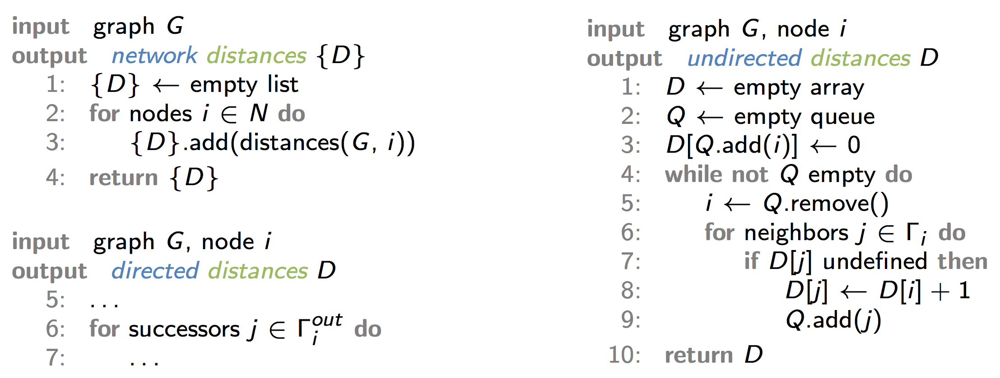



To compute the average distance and maximum distance (diameter) of the network, we need to calcuate shortest paths beween all pairs of nodes. To achieve that, we use a graph traversal algorithms such as BFS or DFS. In our case, the algorithm implements BFS. We can see that in the code, where we use queue. If we wanted to use DFS we would need to use stack structure. Both DFS in BFS have time complexity of $O(m)$, which will bring us to a total complexity of $O(nm)$. BFS is used to guarantee that the calculated distance will really be the shortest!

2. **(code)** Implement the algorithm and compute the average distance between the nodes $\langle d\rangle$ and the maximum distance or diameter $d_{\rm max}$ of _smaller_ networks. Are the results expected?



In [ ]:
def distance(G, i):
  D = [-1] * len(G) # D = {}
  Q = deque()
  D[i] = 0
  Q.append(i)
  while Q:
    i = Q.popleft()
    for j in G[i]:
      if D[j] == -1: # if j not in D:
        D[j] = D[i] + 1
        Q.append(j)
  return [d for d in D if d > 0]

def distances(G):
  D = []
  for i in G.nodes():
    D.append(distance(G, i))
  return D

In [ ]:
def info(G):
  print("{:>10s} | '{:s}'".format('Graph', G.name))

  n = G.number_of_nodes()
  n0, n1, delta = 0, 0, 0
  print("{:>10s} | {:,d} ({:,d}, {:,d})".format('Nodes', n, n0, n1))

  m = G.number_of_edges()
  print("{:>10s} | {:.2f} ({:,d})".format('Degree', 2 * m / n, delta))

  D = distances(G)
  D = [i for d in D for i in d]

  print("{:>10s} | {:.2f} ({:,d})".format('Distance', sum(D) / len(D), max(D)))

# we leave out the "www_google", since it is too big without improving the algorithm
for name in ["toy", "karate_club", "collaboration_imdb"]:

  G = nx.read_pajek(f"./networks/{name}.net")
  G = nx.convert_node_labels_to_integers(G, label_attribute = 'label')
  G.name = name
  info(G)

     Graph | 'toy'
     Nodes | 5 (0, 0)
    Degree | 1.60 (0)
  Distance | 1.67 (3)
     Graph | 'karate_club'
     Nodes | 34 (0, 0)
    Degree | 4.59 (0)
  Distance | 2.41 (5)
     Graph | 'collaboration_imdb'
     Nodes | 17,577 (0, 0)
    Degree | 32.66 (0)
  Distance | 4.89 (16)


From the lectures, we find the following table:

| Graph                 | Avg. dist.| Max dist.   |
|-----------------------|-----------|-------------|
| Internet              | 6.98      | 26          |
| WWW                   | 11.27     | 93          |
| Email                 | 18.99     | 46          |
| Actor Network         | 3.91      | 14          |
| Citation Network      | 11.21     | 42          |
| Science Collaboration | 5.35      | 15          |
| Protein Interactions  | 5.61      | 14          |

Similarly, we obtain the following distances above:

| Graph               | Avg. dist. | Max dist.   |
|---------------------|------------|-------------|
| Toy                 | 1.33       | 2           |
| Karate club         | 2.41       | 5           |
| Colaboration IMDB   | 4.91       | 15          |
| WWW Google          | 6.39       | 19          |



The results are expected, since real networks in general have short distances beween nodes, resulting in small average distances and diameters. To be more precise, we can split graphs into 2 groups:
- theoretical graphs that have larger average and maximum distance
- small world networks (such as social networks), which have much smaller distances.

We learn about small world networks later into the course.

3. **(discuss)** How is the algorithm different from the famous Dijkstra algorithm? In which case you would have to use the Dijkstra algorithm?



Dijkstra's algorithm is a graph traversal and shortest path finding algorithm that searches graphs with non-negative edge weights. The algorithm uses priority queue to select the node it traverses next. It gradually discovers the shortest path from the source to all other vertices in the graph. The process continues until all vertices have been visited. Since our edges have the same weight (adjanceny matrix will either be 0 if there is no connection or 1 if there is), this would give us unnecesary overhead. In case of weighted edges the basic queue implementation fails, so we need to use Dijkstra algorithm.

4. **(discuss)** How could you speed up the algorithm to _only_ approximate $\langle d\rangle$ and $d_{\rm max}$?

To approximate the $\langle d \rangle $, we can calculate the average distance from a random sample of nodes (eg. 100). For $d_{max}$, we can simply expand the node with the current longest distance, which nets us a good approximation in a few steps. In the code above, we can achieve this with:
```python
def distances(G, n = 100):
  D = []
  approx = G.nodes()
  
  if len(G) > n:
    approx = random.sample(G.nodes(), n):
  
  for i in approx:
    D.append(distance(G, i))
  return D
```


### II. Average node clustering coefficient



1. **(discuss)** Study the following algorithm for computing the node clustering coefficients $\{C\}$ by link triad counting. Why does the algorithm count triads over the links and not over the nodes? What is the time complexity of the algorithm?

	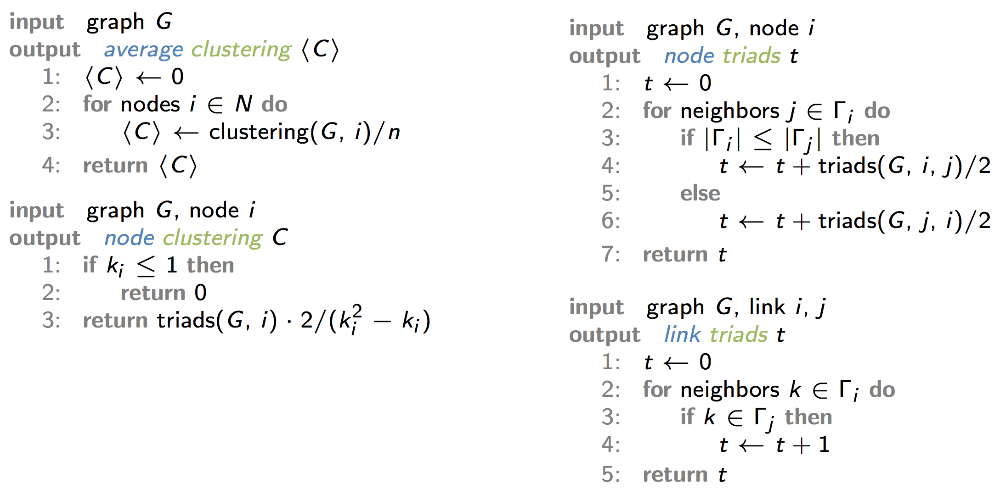



A triad is a set of three nodes connected by two or three edges. By counting triads over the links, the algorithm avoids redundant computations. Instead of considering all possible triads involving a node and examining the connections between the nodes within the triad, the algorithm focuses on the links directly. This approach eliminates the need to repeatedly traverse and analyze the neighboring nodes, resulting in a more efficient computation of clustering coefficients. Naive algorithm would have time complexity of $ O(n\langle k^2 \rangle)$. If we instad always explore the neighborhood with less neighbors, the complexity decreases to $O(m\langle k \rangle)$ or equally $O(n\langle k \rangle^2)$. We can see a bit cleaner implementation of the function bellow.

**NOTE**: clustering coefficient is ambiguous for multigraphs

2. **(homework)** Implement the algorithm and compute the average node clustering coefficient $\langle C\rangle$ of all four networks. Are the results expected?



In [ ]:
def avg_clustering(G: nx.Graph) -> float:
    neighbor_set = {i: set(G.neighbors(i)) for i in G}

    def triangles_between(low_deg_node: int, high_deg_node: int) -> int:
        t = 0
        for k in G[low_deg_node]:
            t += k in neighbor_set[high_deg_node]
        return t

    def triangles_around(i: int) -> int:
        t = 0
        for j in G[i]:
            if G.degree[i] <= G.degree[j]:
                t += triangles_between(i, j)
            else:
                t += triangles_between(j, i)

        return t / 2 # double counting

    def node_clustering(i: int) -> float:
        k = G.degree[i]
        if k <= 1:
            return 0
        else:
            return triangles_around(i) * 2 / (k*k - k)

    return np.mean([node_clustering(i) for i in G])


for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    G = nx.read_pajek(f"./networks/{name}.net")
    G = nx.Graph(G)
    G.name = name

    c_our = avg_clustering(G)
    c_nx = nx.average_clustering(G)

    print(f"---- {name} ----")
    print(f"our coefficient: {c_our:.2f}")
    print(f"nx coefficient: {c_nx:.2f}")
    print()

---- toy ----
our coefficient: 0.47
nx coefficient: 0.47

---- karate_club ----
our coefficient: 0.57
nx coefficient: 0.57

---- collaboration_imdb ----
our coefficient: 0.34
nx coefficient: 0.34

---- www_google ----
our coefficient: 0.51
nx coefficient: 0.51



From the lectures, we find the following table:

| Graph                 | Clustering coeff.|
|-----------------------|------------------|
| Facebook circles      | 0.60             |
| American football     | 0.40             |
| Internet map          | 0.16             |
| Actors Collaboration  | 0.78             |

Similarly, we obtain the following distances above:

| Graph               | Clustering coeff.|
|---------------------|------------------|
| Toy                 | 0.47             |
| Karate club         | 0.57             |
| Colaboration IMDB   | 0.34             |
| WWW Google          | 0.51             |

The results are expected, we see that none of the graphs stands out from the average.

3. **(discuss)** What kind of network representation is required by the algorithm?

The required network representation is adjancency list implemented with sets, since we need a representation that can efficiently check if two nodes are adjacent. In case of sets, the operation is O(1).

### III. Erd&ouml;s-R&eacute;nyi random graphs and link indexing



1. **(discuss)** Study the following two algorithms for generating Erd&ouml;s-R&eacute;nyi random graphs $G(n,m)$ with and without link indexing ${i \choose 2}+j$, $i>j$. What is the main difference between the algorithms? What is the time complexity of the algorithms?

	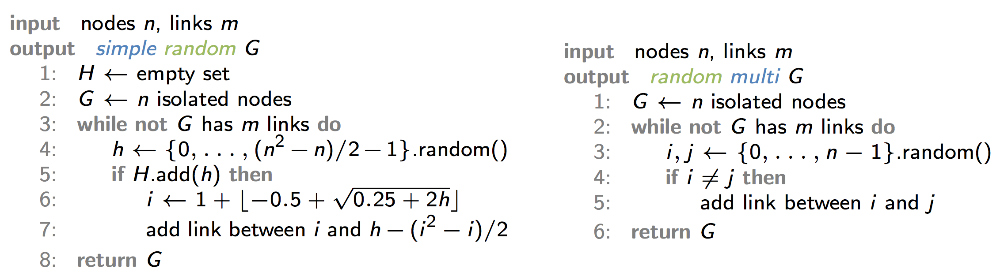



Erdős-Rényi random graph model (ER model) uses random uniform sampling to determintate the links between nodes. From the lectures, most important properties which distinct ER graphs from real world graphs are:
- substantially lower clustering coefficient,
- degrees will follow Binomial/Poison distribution,
- the distances in the graph are shorter, which gives us small diameter.

Algorithm to generate Erdős-Rényi random graph model accepts number of nodes ($n$) and edges ($m$) as argument. If we use link indexing, graph will be generated by assigning an index to each possible edge in the graph. The indexes are based on the combination ${i \choose 2} + j$, where $i$ and $j$ are the indices of the nodes. ~~It iterates through all possible edges, and for each edge, generates a random number. If the random number is below a threshold (determined by the desired edge density), the edge is added to the graph.~~ The second algorithm generates graph without explicitly using link indexing. ~~It iterates through all possible edges, and for each edge, generates a random number. If the random number is below a threshold, the edge is added to the graph.~~


Both algorithms have linear complexity, but use of node indexing is not practical due to larger numbers and need of set. Contrary algorithm without link uses only very basic logic and is much more convenient to use.

2. **(code)** Implement one of the algorithms and generate Erd&ouml;s-R&eacute;nyi random graphs corresponding to all four networks, and compute their $S$, $\langle d\rangle$ and $\langle C\rangle$. Are the results expected?

In [ ]:
import utils

def erdos_renyi(n, m):
    G = nx.MultiGraph(name="erdos_renyi")
    for i in range(n):
        G.add_node(i)
    edges = []
    while len(edges) < m:
        i = random.randint(0, n - 1)
        j = random.randint(0, n - 1)
        if i != j:
            edges.append((i, j))
    G.add_edges_from(edges)
    return G


for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    G = nx.Graph(utils.read_pajek(name))
    #  G = nx.convert_node_labels_to_integers(G, label_attribute = 'label')
    utils.info(G, clustering_sample=10_000)
    utils.info(erdos_renyi(G.number_of_nodes(), G.number_of_edges()), clustering_sample=10_000)

       Graph | 'toy'
       Nodes | 5 (iso=1)
       Edges | 4 (loop=0)
      Degree | 1.60 (max=3)
         LCC | 80.0% (n=2)
  Clustering | 0.4667

  MultiGraph | 'erdos_renyi'
       Nodes | 5 (iso=1)
       Edges | 4 (loop=0)
      Degree | 1.60 (max=2)
         LCC | 80.0% (n=2)
  Clustering | 0.0000

       Graph | 'karate_club'
       Nodes | 34 (iso=0)
       Edges | 78 (loop=0)
      Degree | 4.59 (max=17)
         LCC | 100.0% (n=1)
  Clustering | 0.5706

  MultiGraph | 'erdos_renyi'
       Nodes | 34 (iso=0)
       Edges | 78 (loop=0)
      Degree | 4.59 (max=10)
         LCC | 100.0% (n=1)
  Clustering | 0.1083

       Graph | 'collaboration_imdb'
       Nodes | 17,577 (iso=0)
       Edges | 287,074 (loop=0)
      Degree | 32.66 (max=784)
         LCC | 99.3% (n=19)
  Clustering | 0.3372

  MultiGraph | 'erdos_renyi'
       Nodes | 17,577 (iso=0)
       Edges | 287,074 (loop=0)
      Degree | 32.66 (max=55)
         LCC | 100.0% (n=1)
  Clustering | 0.0018

       Graph | '

Let's check if the properties discussed above/at lectures hold:
- edges are radomly uniformly distributed, ~~$S$ will be bigger than in average network,~~
- short distances and therefore lower $\langle d \rangle$,
- substantially underestimated $\langle C \rangle$

| Graph               | $S$ | $\langle d \rangle$ | $\langle C \rangle$ |
|---------------------|------------------|-------------------|-------------------|
| Toy                 | 80.0%            | 1.33              | 0.467             |
| Toy (ER)            | 100.0%           | 1.80              | 0.000             |
| Karate club         | 100.0%           | 2.41              | 0.570             |
| Karate club (ER)    | 97.1%            | 2.33              | 0.074             |
| Colaboration IMDB   | 99.3%            | 4.91              | 0.339             |
| Colaboration IMDB (ER) | 100.0%        | 3.08              | 0.002             |
| WWW Google          | 97.7%            | 6.39              | 0.514             |
| WWW Google (ER)     | 100.0%           | 6.23              | 0.000             |

The results are expected.


### IV. Configuration model graphs and link rewiring



1. **(discuss)** Study the following two algorithms for generating configuration model graphs $G(\{k\})$ with either link rewiring or stub matching. What is the main difference between the algorithms? What is the time complexity of the algorithms?

	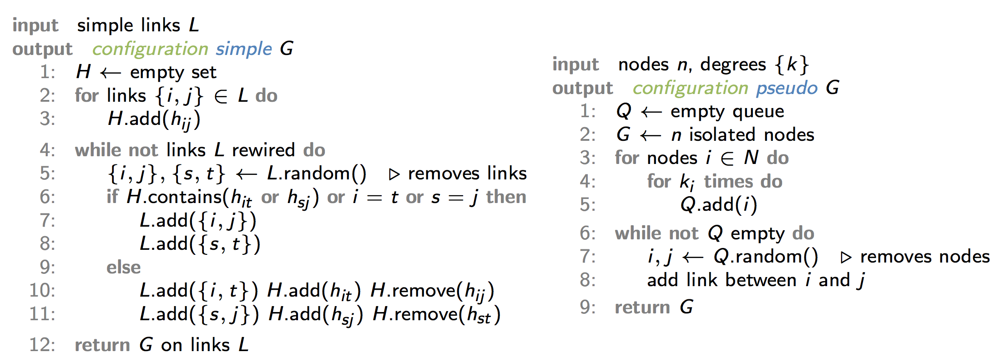



The configuration model is a method to generate random graph with a given degree sequence. This means we can generate random graph with arbitrary degree distribtuion, as opposed to ER graphs. Let's study the two algorithms for generating configuration model graphs: one using link rewiring and the other using stub matching. With Link Rewiring, the algorithm takes array of predefined links (which implicitly determinate our degrees) and hashes them into set structure. In the rewiring phase, we will remove 2 random links from the network, check if the links are suitable for rewiring and then add altered links back to the network and correspondingy update our set. When using stub matching, we recieve amount of nodes n and desired degree sequence as input. Then we generate n stubs and add node to queue as many times as the k. After that, we simply select 2 nodes from queue, remove them and add them to G.

Both algorithms have a linear time complexity, but differ in having different input arguments.

2. **(code)** Implement one of the algorithms and generate configuration model graphs corresponding to all four networks, and compute their $S$, $\langle d\rangle$ and $\langle C\rangle$. Are the results expected?

	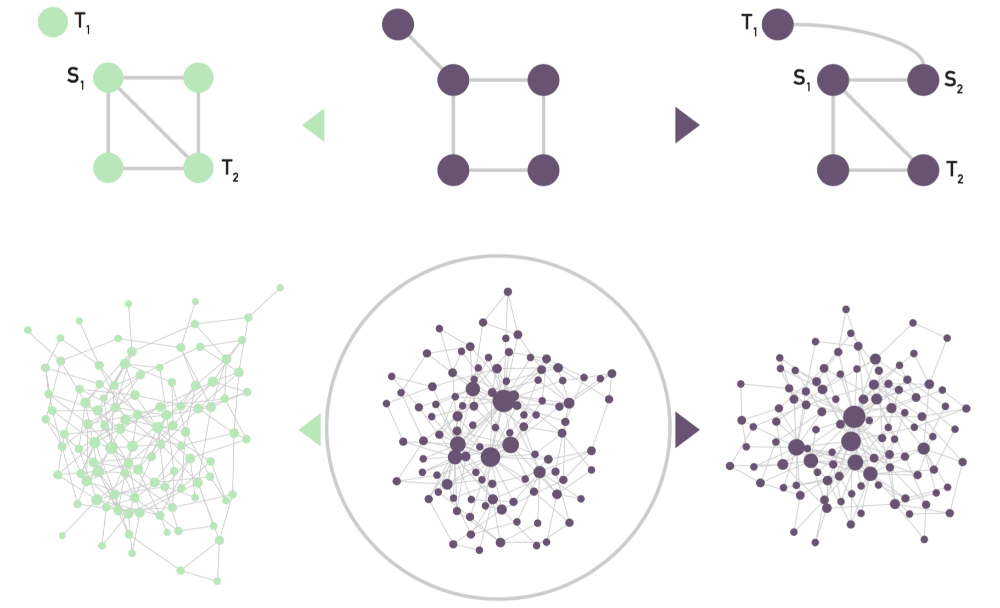

In [ ]:
def configuration_model(degrees: List[int]) -> nx.MultiGraph:
    """stub matching"""
    Q = []
    for i, k in enumerate(degrees):
        Q += [i] * k

    G = nx.MultiGraph(name="conf. model")
    for i in range(len(degrees)):
        G.add_node(i)

    random.shuffle(Q)

    edges = []
    for i in range(0, len(Q), 2):
        edges.append((Q[i], Q[i + 1]))
    G.add_edges_from(edges)

    return G


for name in ["toy", "karate_club", "collaboration_imdb", "www_google"]:
    G = utils.read_pajek(name)
    utils.info(configuration_model([k for _, k in G.degree()]), clustering_sample=50_000)

  MultiGraph | 'conf. model'
       Nodes | 5 (iso=1)
       Edges | 4 (loop=1)
      Degree | 1.60 (max=3)
         LCC | 60.0% (n=3)
  Clustering | 0.0000

  MultiGraph | 'conf. model'
       Nodes | 34 (iso=0)
       Edges | 78 (loop=2)
      Degree | 4.59 (max=17)
         LCC | 100.0% (n=1)
  Clustering | 0.2043

  MultiGraph | 'conf. model'
       Nodes | 17,577 (iso=0)
       Edges | 287,074 (loop=48)
      Degree | 32.66 (max=784)
         LCC | 100.0% (n=1)
  Clustering | 0.0167

  MultiGraph | 'conf. model'
       Nodes | 875,713 (iso=0)
       Edges | 5,105,039 (loop=77)
      Degree | 11.66 (max=6,353)
         LCC | 99.8% (n=834)
  Clustering | 0.0015



The results are similar to the ones we obtained when we were talking about ER random model, but we can see some exceptions with higher distances as original version or clustering coefficient that is bigger than 0.


| Graph               | $S$ | $\langle d \rangle$ | $\langle C \rangle$ |
|---------------------|------------------|-------------------|-------------------|
| Toy                 | 80.0%            | 1.33              | 0.467             |
| Toy (CO)            | 80.0%            | 1.67              | 0.000             |
| Karate club         | 100.0%           | 2.41              | 0.570             |
| Karate club (CO)    | 100.0%           | 2.48              | 0.183             |
| Colaboration IMDB   | 99.3%            | 4.91              | 0.339             |
| Colaboration IMDB (CO) | 100.0%        | 3.06              | 0.016             |
| WWW Google          | 97.7%            | 6.39              | 0.514             |
| WWW Google (CO)     | 99.7%            | 4.36              | 0.002             |

# 4 Lab

###### Introduction to Network Analysis 2023/24 (iv)

## Small-world and scale-free models, graphs vs networks

You are given six networks in Pajek format.

+ Zachary karate club network ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ Map of Darknet from Tor network ([darknet.net](http://lovro.fri.uni-lj.si/ina/nets/darknet.net))
+ iMDB actors collaboration network ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net))
+ WikiLeaks cable reference network ([wikileaks.net](http://lovro.fri.uni-lj.si/ina/nets/wikileaks.net))
+ Enron e-mail communication network ([enron.net](http://lovro.fri.uni-lj.si/ina/nets/enron.net))
+ A small part of Google web graph ([www_google.net](http://lovro.fri.uni-lj.si/ina/nets/www_google.net))

In [ ]:
import networkx as nx
import random
import utils

### I. Watts-Strogatz small-world graphs



1. **(discuss)** Study the algorithm for generating Watts-Strogatz small-world graphs $G(n,k,p)$ introduced in lectures. Does the algorithm generate networks with realistic structure? What is the time complexity of the algorithm?

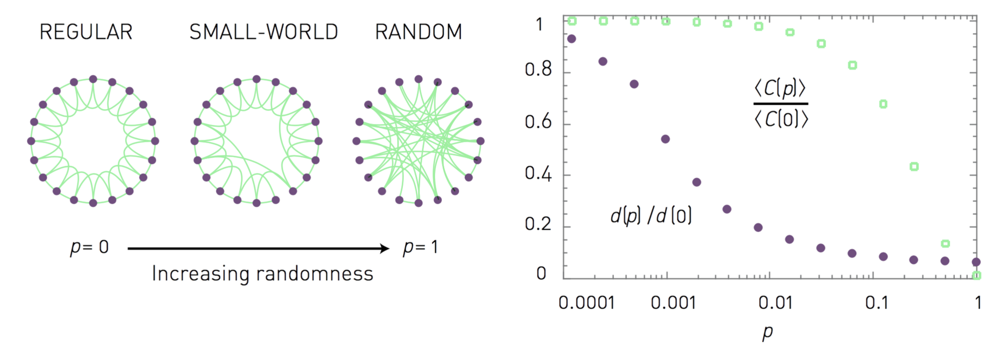


Model starts with ring lattice of $n$ nodes, where each one is connected to $k$ nearest neighbors. Third parameter $p$ is fraction of the links we will randomly rewire. In the begining the network has high clustering coefficient but long distances between the nodes. After rewiring only a few nodes, the clustering coefficient will still remain high while the distances shorten rapidly. Unlike ER graphs, WS model reproduces high clustering coefficient of real networks and also short distances, however not real degree distribution. Algorithm has linear time complexity.

2. **(code)** Implement the algorithm and generate Watts-Strogatz small-world graphs that best match the networks above. _(Set $k$ to $\langle k\rangle$ rounded to the nearest even number and try to find the value of $p$ that best reproduces $\langle C\rangle$, $p\approx 1-\sqrt[3]{\frac{4C(k-1)}{3(k-2)}}$.)_ Compute their average node clustering coefficient $\langle C\rangle$ and approximate average distance between the nodes $\approx\langle d\rangle$. Are the results expected?

In [ ]:
Gs = [
    nx.Graph(utils.read_pajek(name)) for name in
    ["karate_club", "darknet", "collaboration_imdb", "wikileaks", "enron", "www_google"]
]

In [ ]:
def watts_strogatz(n, k, p):
    G = nx.MultiGraph(name="watts_strogatz")
    for i in range(n):
        G.add_node(i)
    edges = []
    for i in range(n):
        for j in range(i + 1, i + k // 2 + 1):
            edges.append((i, random.randint(0, n - 1)
                         if random.random() < p else j % n))
    G.add_edges_from(edges)
    return G


for G in Gs:
    n = G.number_of_nodes()
    m = G.number_of_edges()

    k = max(4, round(m / n) * 2)
    p = 1 - (nx.transitivity(G) * 4 / 3 * (k - 1) / (k - 2))**(1/3)

#  G = nx.watts_strogatz_graph(n, k, p)
    G = watts_strogatz(n, k, p)
    utils.info(G, clustering_sample=20_000)

  MultiGraph | 'watts_strogatz'
       Nodes | 34 (iso=0)
       Edges | 68 (loop=0)
      Degree | 4.00 (max=5)
         LCC | 100.0% (n=1)
  Clustering | 0.3088

  MultiGraph | 'watts_strogatz'
       Nodes | 7,178 (iso=0)
       Edges | 21,534 (loop=1)
      Degree | 6.00 (max=14)
         LCC | 100.0% (n=1)
  Clustering | 0.0058

  MultiGraph | 'watts_strogatz'
       Nodes | 17,577 (iso=0)
       Edges | 281,232 (loop=6)
      Degree | 32.00 (max=42)
         LCC | 100.0% (n=1)
  Clustering | 0.3671

  MultiGraph | 'watts_strogatz'
       Nodes | 52,416 (iso=0)
       Edges | 104,832 (loop=0)
      Degree | 4.00 (max=10)
         LCC | 100.0% (n=1)
  Clustering | 0.1352

  MultiGraph | 'watts_strogatz'
       Nodes | 87,273 (iso=0)
       Edges | 261,819 (loop=0)
      Degree | 6.00 (max=15)
         LCC | 100.0% (n=1)
  Clustering | 0.0725

  MultiGraph | 'watts_strogatz'
       Nodes | 875,713 (iso=0)
       Edges | 4,378,565 (loop=6)
      Degree | 10.00 (max=23)
         LCC |

We see that the average distance model gives is relatively well approximated.  Most of the networks have very similar value or at least of the same order. Even the clustering coefficient follows the one of real networks in some cases but fails miserably in others.

| Graph               | n    | m   | $\langle d \rangle$ |   $\langle C \rangle$   |
|---------------------|------|-----|-----------------|--------------------------|
|  karate_club |  34 |  78  |  2.41 |  0.5706 |
|  karate_club (WS) |  34  |  68 |  2.82  |  0.2814 |
|  darknet |  7,178 |  25,104  |  2.37 |  0.7061 |
|  darknet (WS) |  7,178 |  21,534 |  5.23  |  0.0051 |
|  collaboration_imdb |  17,577 |  287,074 |  4.99  |  0.3391 |
|  collaboration_imdb (WS) |  17,577  |  281,232 |  3.59  |  0.3691 |
|  wikileaks |  52,416 |  78,506  |  22.26  |  0.1864 |
|  wikileaks (WS) |  52,416  |  104,832  |  9.67  |  0.1355 |
|  enron |  87,273  |  1,148,072  |  4.94  |  0.1193 |
|  enron (WS) |  87,273 |  261,819  |  7.10 |  0.0740 |
|  www_google |  875,713  |  5,105,039  |  6.48  |  0.5143 |
|  www_google (WS) |  875,713 |  4,378,565  |  6.48  |  0.0558 |



In [ ]:
n = 10000
k = 10

for p in [0.0, 0.0001, 0.001, 0.01, 0.05, 0.1, 0.25, 0.5, 1.0]:
    G = watts_strogatz(n, k, p)
    utils.info(G, clustering_sample=20_000)

  MultiGraph | 'watts_strogatz'
       Nodes | 10,000 (iso=0)
       Edges | 50,000 (loop=0)
      Degree | 10.00 (max=10)
         LCC | 100.0% (n=1)
  Clustering | 0.6667

  MultiGraph | 'watts_strogatz'
       Nodes | 10,000 (iso=0)
       Edges | 50,000 (loop=0)
      Degree | 10.00 (max=11)
         LCC | 100.0% (n=1)
  Clustering | 0.6665

  MultiGraph | 'watts_strogatz'
       Nodes | 10,000 (iso=0)
       Edges | 50,000 (loop=0)
      Degree | 10.00 (max=11)
         LCC | 100.0% (n=1)
  Clustering | 0.6648

  MultiGraph | 'watts_strogatz'
       Nodes | 10,000 (iso=0)
       Edges | 50,000 (loop=0)
      Degree | 10.00 (max=13)
         LCC | 100.0% (n=1)
  Clustering | 0.6470

  MultiGraph | 'watts_strogatz'
       Nodes | 10,000 (iso=0)
       Edges | 50,000 (loop=0)
      Degree | 10.00 (max=13)
         LCC | 100.0% (n=1)
  Clustering | 0.5726

  MultiGraph | 'watts_strogatz'
       Nodes | 10,000 (iso=0)
       Edges | 50,000 (loop=0)
      Degree | 10.00 (max=15)
       

|     $p$        |  $\langle k \rangle$ | $\gamma$ | $\langle d \rangle$ | $\langle C \rangle$ |
|---------------------|------------------|-------------------|-------------------|---------------------|
|  0.0 |  10.00  |  20.50  |  500.45  |  0.6667 |
|   0.0001 |  10.00  |  20.47  |  249.73  |  0.6664 |
| 0.001 |  10.00  |  20.31  |  51.84  |  0.6646 |
|   0.01 |  10.00  |  18.86  |  13.83  |  0.6478 |
|   0.05 |  10.00  |  14.50  |  7.38  |  0.5745 |
|  0.1 |  10.00  |  11.77  |  6.14  |  0.4921 |
|   0.25 |  10.00  |  8.61  |  5.02  |  0.2901 |
|  0.5 |  10.00  |  7.01  |  4.48  |  0.0853 |
|  1.0 |  10.00  |  6.24  |  4.31  |  0.0008 |

Here we have a more synthetic example where network will have 10,000 nodes and average degree of 10, while we are increasing $p$. The distances get shorter very quickly, while clustering persists longer. We can also see that $\gamma$ exponent is very high even though we do not have any hubs, which happens due to maximum likehood formula assuming that the network is scale-free. Since this is not the case, the obtained results is not accurate. We will talk more about the maximum likehood formula and gamma exponent in the following labs.

### II. Barab&aacute;si-Albert and Price scale-free graphs



In [ ]:
import math
import random
import networkx as nx
import matplotlib.pyplot as plt
import utils

1. **(discuss)** Study the following two algorithms for generating Barab&aacute;si-Albert scale-free graphs $G(n,c)$ and Price scale-free graphs $G(n,c,a)$ using the relation $\frac{q+a}{n(c+a)}=\frac{c}{c+a}\frac{q}{nc}+\frac{a}{c+a}\frac{1}{n}$. What is the main difference between the algorithms? What is the time complexity of the algorithms?

	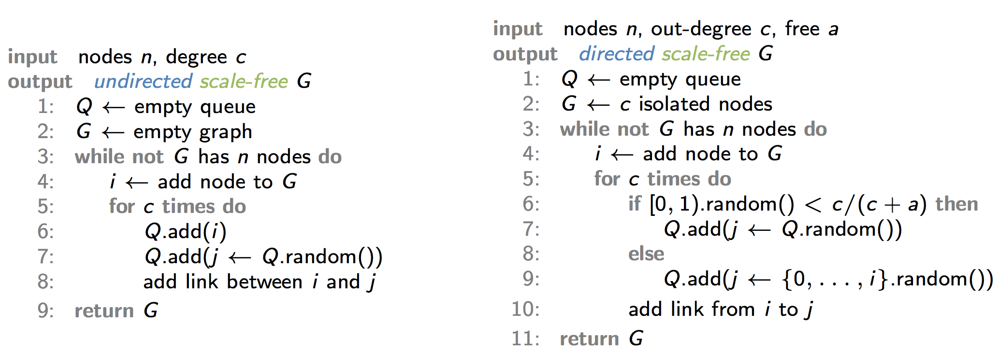


BA model generates network with $n$ nodes, where each node adds $c$ undirected links to existing nodes when generated. The links are connected to the existing nodes with the probability proportional to the node's degree. The algorithm requires efficient node selection proportional to degree. We address this by adding list of node indices, where index appears as often as degree. To select a node we connect to, simply select one from the list.

In the algorithm, queue will represent our list of nodes. To create a network, continously add nodes and generate $c$ connections, selecting one node from the queue as our destination. In the end, update the queue to match the new degrees. Generated graph will be undirected scale free network with degree distribution of about $p_k \sim k^{-3}$.

Unlike BA, Price model generates a **directed** network with $n$ nodes, where each node will add $c$ links to the existing nodes with probability proportional to it's in-degree plus $a$ ($q_i + a$). Here we use the same idea of queue representation for node selection. Since $a$ is not limited to being an integer, use the trick which samples according to the in-degree from the queue $\frac{c}{c+a}$ times and uniformly from all the nodes the rest of the time. Generated graph will have a degree distribtuion of $p_q \sim q^{-2-\frac{a}{c}}$.

Both of the algorithm's time complexities are linear.

**NOTE**: BA is a special case of a Price model, where $a$ is $c$ and we treat the final graph as undirected.

2. **(code)** Implement both algorithms and generate Barab&aacute;si-Albert and Price scale-free graphs corresponding to larger networks above. Plot their degree distribution $p_{k}$ and compute power-law exponents $\gamma$ of seemingly scale-free distributions using the maximum likelihood formula below. Are the results expected?

$$\gamma=1+\bar{n}\left[\sum_{i=1}^{n}\ln\frac{k_i}{k_{min}-\frac{1}{2}}\delta(k_i\geq k_{min})\right]^{-1}$$

Let's translate the formula into a form CS student will understand:
- $\delta(k_i\geq k_{min})$: Kronecker delta function will return 1 if current degree $k_i$ is larger or equal then predefined $k_{min}$, else 0.
- $\bar{n}$ is the amount of $k_i$ which are used in the sum (where Kronecker delta is 1).


Other parts of the equation are self explainatory. Sample implementation would look like:


```python
# requires numpy array of degrees
def calc_gamma(degrees, k_min):
    # keeps only the elements that have Kronecker delta of 1
    # or in other terms that have degree higher than k_min
    degrees = degrees[degrees >= k_min]
    n_dot = len(degrees)

    sum_value = np.sum(np.log(degrees / (k_min - 0.5)))
    gamma = 1 + n_dot * (1 / sum_value)

    return gamma
```

Implementation that works with graphs is provided bellow.


**NOTE**: Maximum likehood formula assumes the network is scale-free and will return nonsensible result otherwise.

In [ ]:
def power_law(G, kmin=10):
    n = 0
    sumk = 0
    for _, k in G.degree():
        if k >= kmin:
            sumk += math.log(k)
            n += 1
    return 1 + 1 / (sumk / n - math.log(kmin - 0.5)) if n > 0 else math.nan

  MultiGraph | 'darknet'
       Nodes | 7,178 (iso=0)
       Edges | 25,104 (loop=0)
      Degree | 6.99 (max=5,583)
         LCC | 100.0% (n=1)
  Clustering | 0.7061



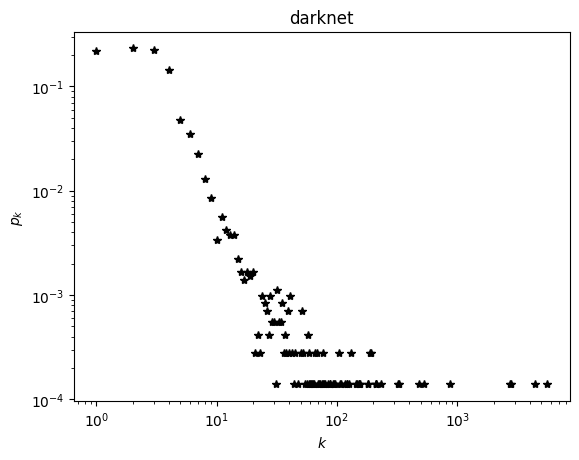

MultiDiGraph | 'price'
       Nodes | 7,178 (iso=0)
       Edges | 21,525 (loop=0)
      Degree | 3.00 max(in=9034, out=3)
         LCC | 100.0% (n=1)
  Clustering | 0.3370



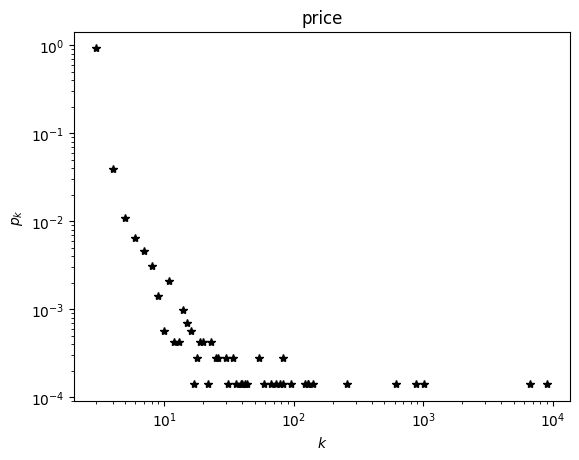

  MultiGraph | 'barabasi_albert'
       Nodes | 7,178 (iso=0)
       Edges | 21,525 (loop=18)
      Degree | 6.00 (max=300)
         LCC | 100.0% (n=1)
  Clustering | 0.0065



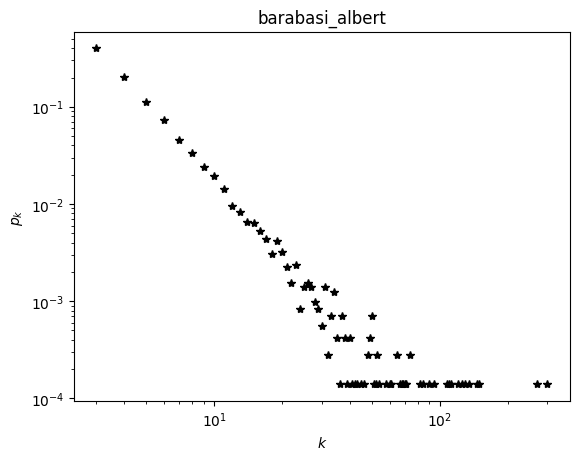

  MultiGraph | 'collaboration_imdb'
       Nodes | 17,577 (iso=0)
       Edges | 287,074 (loop=0)
      Degree | 32.66 (max=784)
         LCC | 99.3% (n=19)
  Clustering | 0.3380



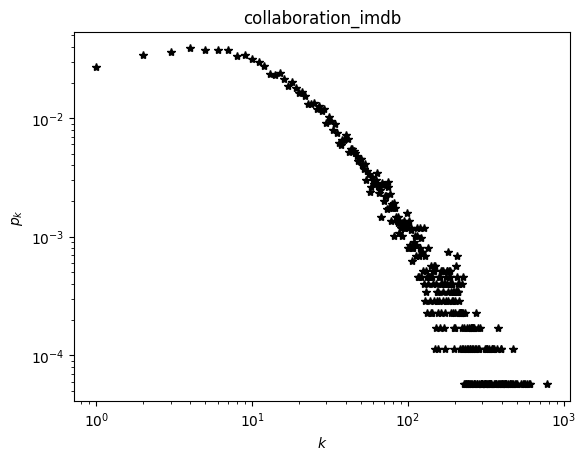

MultiDiGraph | 'price'
       Nodes | 17,577 (iso=0)
       Edges | 280,976 (loop=47)
      Degree | 15.99 max(in=1488, out=16)
         LCC | 100.0% (n=1)
  Clustering | 0.0109



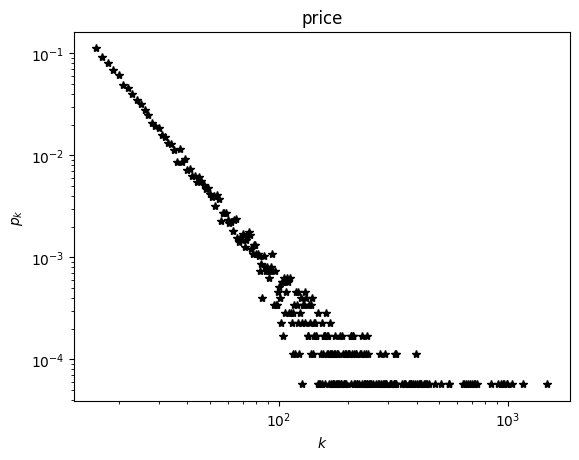

  MultiGraph | 'barabasi_albert'
       Nodes | 17,577 (iso=0)
       Edges | 280,976 (loop=48)
      Degree | 31.97 (max=1,598)
         LCC | 100.0% (n=1)
  Clustering | 0.0107



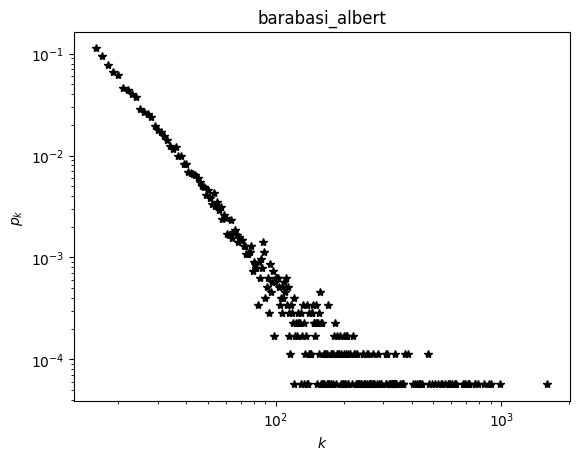

MultiDiGraph | 'wikileaks'
       Nodes | 52,416 (iso=0)
       Edges | 78,506 (loop=0)
      Degree | 1.50 max(in=383, out=53)
         LCC | 100.0% (n=1)
  Clustering | 0.1821



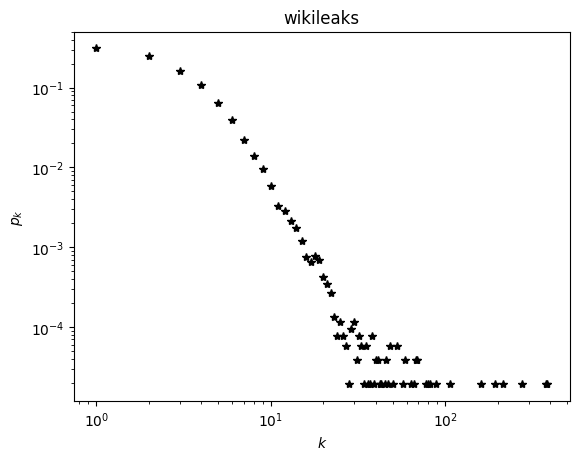

MultiDiGraph | 'price'
       Nodes | 52,416 (iso=0)
       Edges | 52,415 (loop=6)
      Degree | 1.00 max(in=89, out=1)
         LCC | 76.7% (n=7)
  Clustering | 0.0000



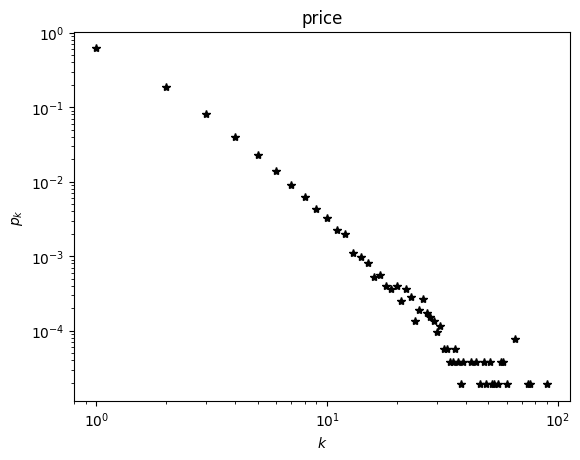

  MultiGraph | 'barabasi_albert'
       Nodes | 52,416 (iso=0)
       Edges | 52,415 (loop=5)
      Degree | 2.00 (max=354)
         LCC | 82.9% (n=6)
  Clustering | 0.0000



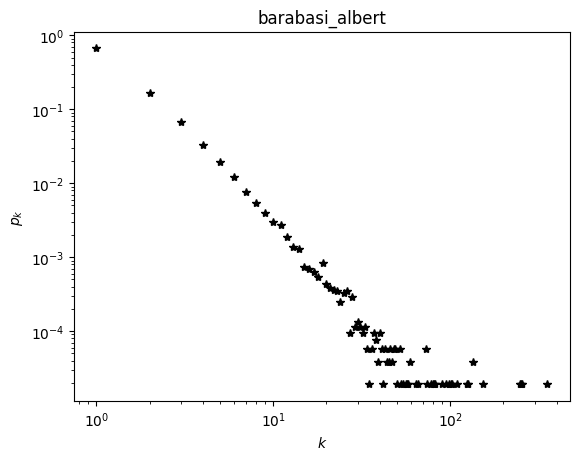

MultiDiGraph | 'enron'
       Nodes | 87,273 (iso=0)
       Edges | 1,148,072 (loop=13,082)
      Degree | 13.15 max(in=6166, out=32619)
         LCC | 96.7% (n=1,331)
  Clustering | 0.1175



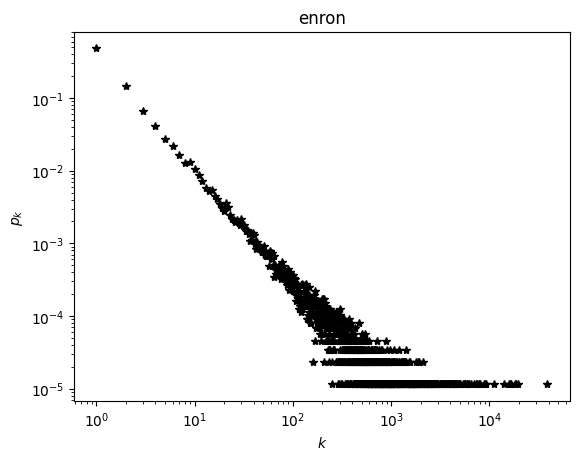

MultiDiGraph | 'price'
       Nodes | 87,273 (iso=0)
       Edges | 1,134,380 (loop=47)
      Degree | 13.00 max(in=3112, out=13)
         LCC | 100.0% (n=1)
  Clustering | 0.0026



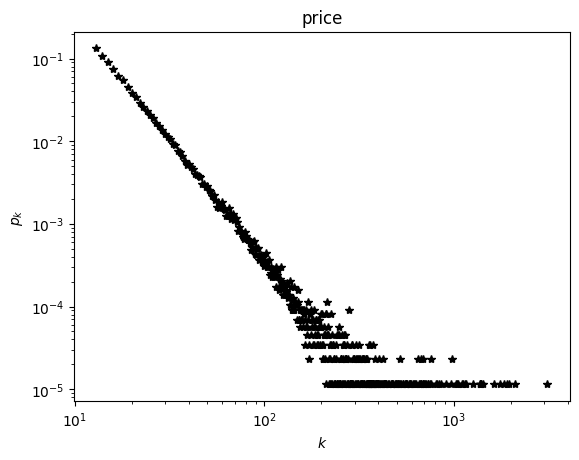

  MultiGraph | 'barabasi_albert'
       Nodes | 87,273 (iso=0)
       Edges | 1,134,380 (loop=63)
      Degree | 26.00 (max=3,222)
         LCC | 100.0% (n=1)
  Clustering | 0.0026



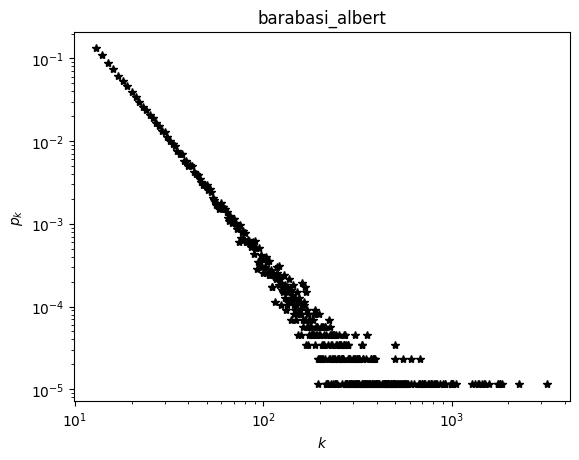

MultiDiGraph | 'www_google'
       Nodes | 875,713 (iso=0)
       Edges | 5,105,039 (loop=0)
      Degree | 5.83 max(in=6326, out=456)
         LCC | 97.7% (n=2,746)
  Clustering | 0.5187



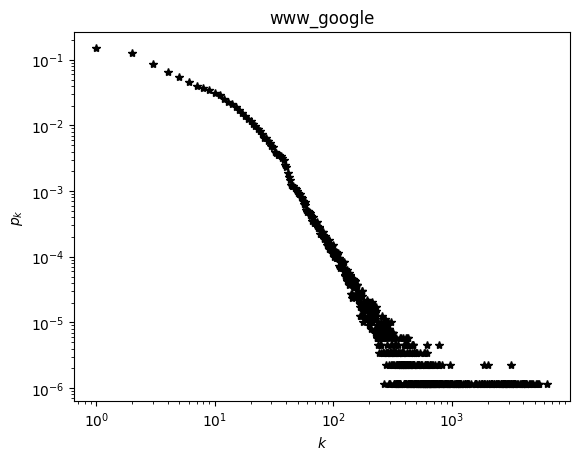

MultiDiGraph | 'price'
       Nodes | 875,713 (iso=0)
       Edges | 5,254,242 (loop=21)
      Degree | 6.00 max(in=64952, out=6)
         LCC | 100.0% (n=1)
  Clustering | 0.0100



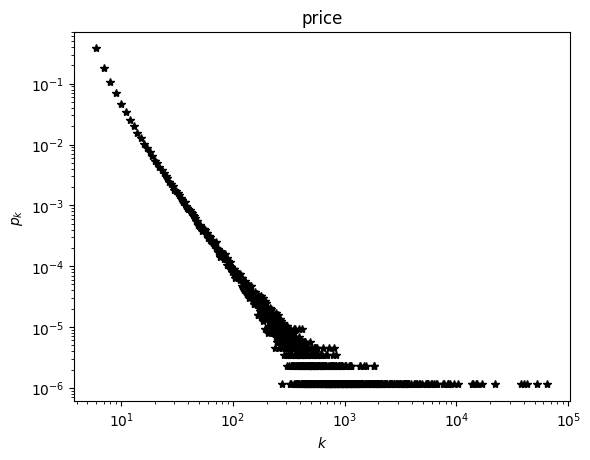

  MultiGraph | 'barabasi_albert'
       Nodes | 875,713 (iso=0)
       Edges | 5,254,242 (loop=39)
      Degree | 12.00 (max=7,501)
         LCC | 100.0% (n=1)
  Clustering | 0.0002



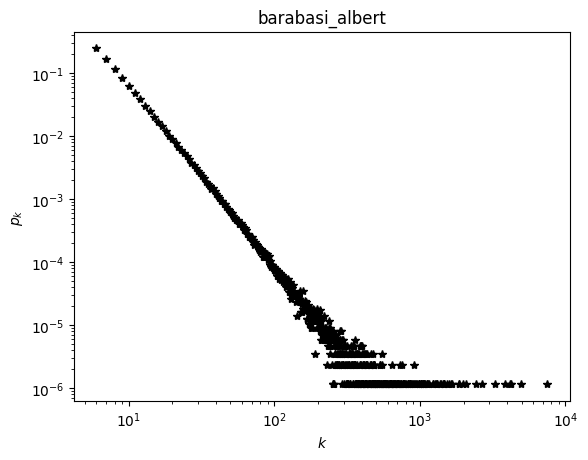

In [ ]:
def price(n, c, a):
    G = nx.MultiDiGraph(name="price")
    edges = []
    G.add_node(0)
    for i in range(1, c + 1):
        G.add_node(i)
        edges.append((0, i))
    for i in range(len(G), n):
        G.add_node(i)
        for _ in range(c):
            if random.random() < c / (c + a):
                edges.append((i, random.choice(edges)[1]))
            else:
                edges.append((i, random.randint(0, i)))
    G.add_edges_from(edges)
    return G


def barabasi_albert(n, c):
    return nx.MultiGraph(price(n, c, c), name="barabasi_albert")


def plot(G):
    nk = {}
    for _, k in G.degree():
        if k not in nk:
            nk[k] = 0
        nk[k] += 1
    ks = sorted(nk.keys())

    plt.loglog(ks, [nk[k] / len(G) for k in ks], '*k')
    plt.title(G.name)
    plt.ylabel('$p_k$')
    plt.xlabel('$k$')
    plt.show()


for name in ["darknet", "collaboration_imdb", "wikileaks", "enron", "www_google"]:
    G = utils.read_pajek(name)

    utils.info(G)
    plot(G)

    n = G.number_of_nodes()
    m = G.number_of_edges()

    gamma = power_law(G)
    c = round(m / n)
    a = c if gamma <= 2 else c * (gamma - 2)

    G = price(n, c, a)

    utils.info(G)
    plot(G)

#  G = nx.barabasi_albert_graph(n, c)
    G = barabasi_albert(n, c)

    utils.info(G)
    plot(G)


|     $p$        | $m$ | $n$ | $\langle k \rangle$ | $\gamma$ | $\langle d \rangle$ | $\langle C \rangle$ |
|---------------------|--|-|-----------------|-------------------|-------------------|---------------------|
|  darknet |  7,178  |  25,104  |  6.99  |  2.03  |  2.31  |  0.7061 |
|  darknet (PR) |  7,178  |  21,525  |  6.00  |  2.14  |  2.12  |  0.2712 |
|  darknet (BA) |  7,178  |  21,525  |  6.00  |  2.79  |  4.11  |  0.0066 |
|  collaboration_imdb |  17,577  |  287,074  |  32.66  |  1.85  |  4.73  |  0.3391 |
|  collaboration_imdb (PR) |  17,577  |  280,976  |  31.97  |  1.99  |  2.89  |  0.0107 |
|  collaboration_imdb (BA) |  17,577  |  280,976  |  31.97  |  1.99  |  2.88  |  0.0111 |
|  wikileaks |  52,416  |  78,506  |  3.00  |  3.67  |  22.88  |  0.1864 |
|  wikileaks (PR) |  52,416  |  52,415  |  2.00  |  3.36  |  11.84  |  0.0000 |
|  wikileaks (BA) |  52,416  |  52,415  |  2.00  |  2.88  |  9.99  |  0.0000 |
|  enron |  87,273  |  1,148,072  |  26.31  |  1.66  |  4.84  |  0.1193 |
|  enron (PR) |  87,273  |  1,134,380  |  26.00  |  2.25  |  3.37  |  0.0025 |
|  enron (BA) |  87,273  |  1,134,380  |  26.00  |  2.25  |  3.37  |  0.0026 |
|  www_google |  875,713  |  5,105,039  |  11.66  |  2.37  |  6.43  |  0.5143 |
|  www_google (PR) |  875,713  |  5,254,242  |  12.00  |  2.74  |  3.62  |  0.0097 |
|  www_google (BA) |  875,713  |  5,254,242  |  12.00  |  2.87  |  4.61  |  0.0002 |

Price and Barab&aacute;si-Albert model manage to approximate the power law coefficient of the network very well. We can notice that due to the process of generating networks, the average degree will be the same among both of them. when compared to real netwoks, they still differ in some of the propeties, most notably in lower average distances and substantially underestimated clustering coefficient.   


MultiDiGraph | 'price_2.01'
       Nodes | 10,000 (iso=0)
       Edges | 99,900 (loop=2)
      Degree | 9.99 max(in=22159, out=10)
         LCC | 100.0% (n=1)
    Distance | 1.18 (max=3)
  Clustering | 0.1721

gamma:	1.697436521623802


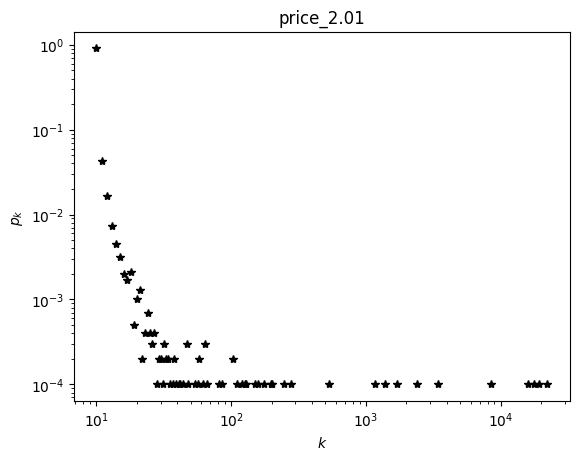

MultiDiGraph | 'price_2.25'
       Nodes | 10,000 (iso=0)
       Edges | 99,900 (loop=17)
      Degree | 9.99 max(in=11324, out=10)
         LCC | 100.0% (n=1)
    Distance | 4.22 (max=15)
  Clustering | 0.1502

gamma:	2.4829922123594685


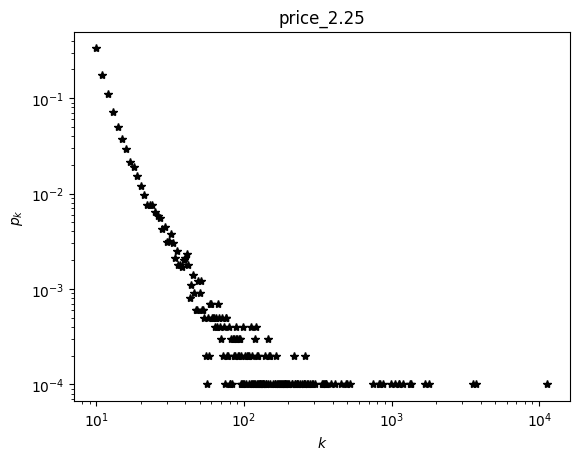

MultiDiGraph | 'price_2.5'
       Nodes | 10,000 (iso=0)
       Edges | 99,900 (loop=15)
      Degree | 9.99 max(in=2445, out=10)
         LCC | 100.0% (n=1)
    Distance | 4.53 (max=16)
  Clustering | 0.0462

gamma:	2.643445709451578


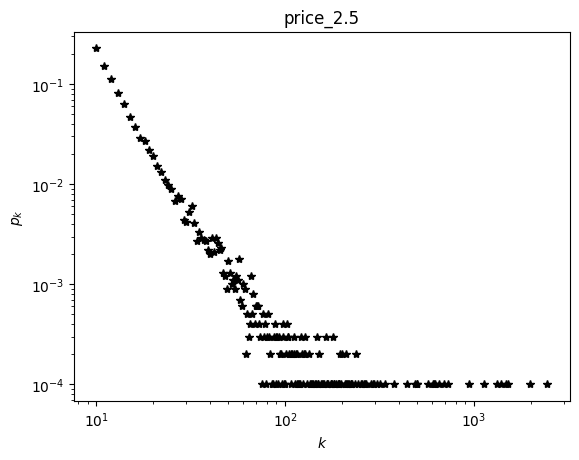

MultiDiGraph | 'price_2.75'
       Nodes | 10,000 (iso=0)
       Edges | 99,900 (loop=29)
      Degree | 9.99 max(in=1147, out=10)
         LCC | 100.0% (n=1)
    Distance | 4.56 (max=16)
  Clustering | 0.0199

gamma:	2.804168618891392


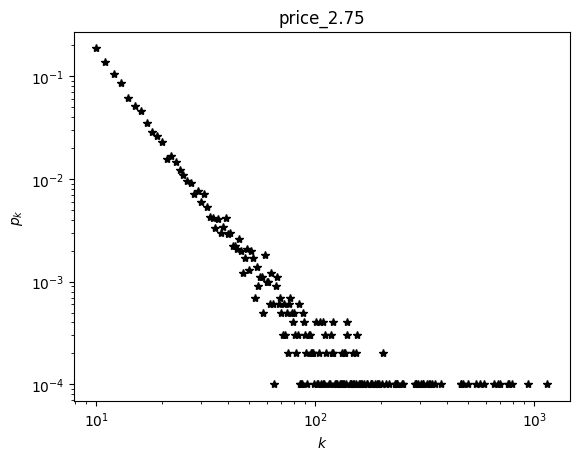

MultiDiGraph | 'price_3.0'
       Nodes | 10,000 (iso=0)
       Edges | 99,900 (loop=39)
      Degree | 9.99 max(in=690, out=10)
         LCC | 100.0% (n=1)
    Distance | 4.70 (max=18)
  Clustering | 0.0115

gamma:	2.904145755444657


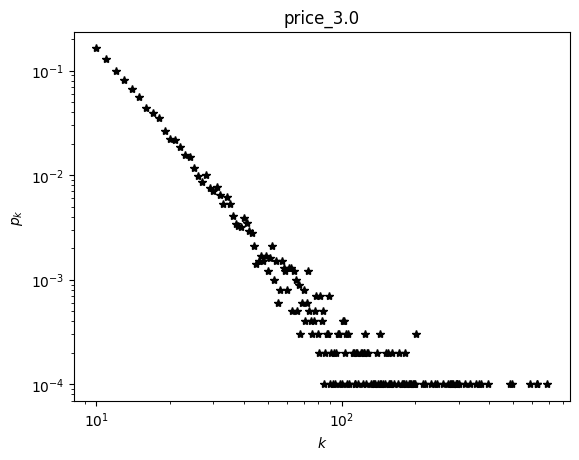

MultiDiGraph | 'price_4.0'
       Nodes | 10,000 (iso=0)
       Edges | 99,900 (loop=56)
      Degree | 9.99 max(in=323, out=10)
         LCC | 100.0% (n=1)
    Distance | 4.64 (max=15)
  Clustering | 0.0050

gamma:	3.2742915355893376


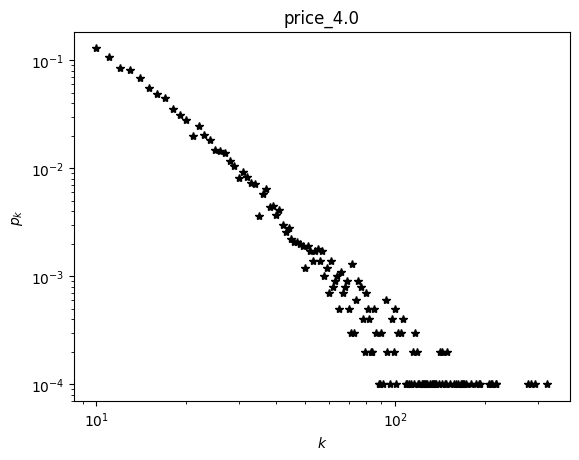

MultiDiGraph | 'price_5.0'
       Nodes | 10,000 (iso=0)
       Edges | 99,900 (loop=43)
      Degree | 9.99 max(in=198, out=10)
         LCC | 100.0% (n=1)
    Distance | 4.59 (max=19)
  Clustering | 0.0041

gamma:	3.432330986819627


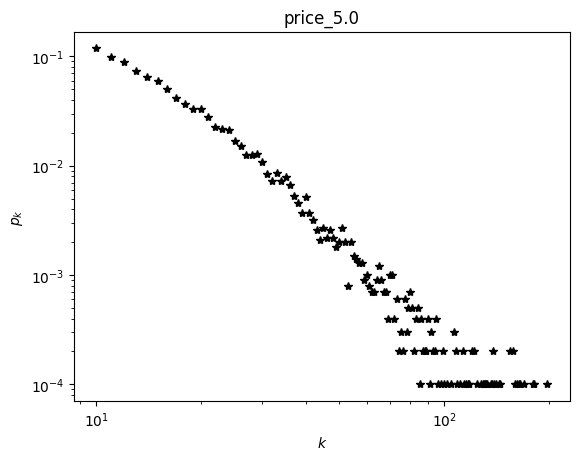

In [ ]:
n = 10000
c = 10

for gamma in [2.01, 2.25, 2.5, 2.75, 3.0, 4.0, 5.0]:
    G = price(n, c, c * (gamma - 2))
    G.name += "_" + str(gamma)

    utils.info(G, distance_sample=100)
    print(f"gamma:\t{power_law(G, kmin=25)}")
    plot(G)

|     $\gamma$        | $\langle k \rangle$ | real $\gamma$ | $\langle d \rangle$ | $\langle C \rangle$ |
|---------------------|-------------------|-------------------|-------------------|---------------------|
|  2.01 |    20.00  |  2.15  |  2.00  |  0.1530 |
|  2.25 |   20.00  |  2.50  |  2.68  |  0.0787 |
|  2.5 |  20.00  |  2.67  |  3.12  |  0.0144 |
|  2.75 |   20.00  |  2.84  |  3.48  |  0.0042 |
|  3.0 |   20.00  |  2.95  |  3.58  |  0.0020 |
|  4.0 |  20.00  |  3.26  |  3.84  |  0.0006 |
|  5.0 |  20.00  |  3.45  |  3.94  |  0.0005 |

Each network will contain 100,000 nodes and 999,900 edges. We see that gamma is somewhat well approximatted, with it being a bit underestimated.

### III. Synthetic random graphs vs real networks

Consider different large-scale properties of real networks. Namely, low average node degree $\langle k\rangle\ll n$, one giant connected component $S\approx 1$, short distances between the nodes $\langle d\rangle\approx\frac{\ln n}{\ln\langle k\rangle}$, high average node clustering coefficient $\langle C\rangle\gg 0$, power-law degree distribution $p_k\sim k^{-\gamma}$, pronounced community structure etc.



1. **(discuss)** Design synthetic graph model that generates undirected graphs that are _most different_ from real networks.



To generate the most different graph, it needs to have:
- large distances between nodes,
- low clustering,
- high average node degree, but we have to be careful since this makes graph denser, which increases clustering and lowers distances,
- uncharacteristic degree distribution like Binomial,
- no large connected component.

One example of that could be a chain. It has clustering coefficient of 0 since only connection is to the neighboring node, distances scale with O(n) and all nodes except for ending have the same degree. To have no large connected component just create multiple unconnected chains. This satisfies all the criteria except for high node degree.


Another good example is also a Hypercube graph. Here we would also need to do the trick to have multiple disconnected graphs in order not to have one LCC.

In [ ]:
G = nx.Graph(name="Chain")

num_nodes = 8192
for i in range(num_nodes):
    G.add_node(i)

for i in range(num_nodes - 1):
    G.add_edge(i, i + 1)

utils.info(G, distance_sample=300)

       Graph | 'Chain'
       Nodes | 8,192 (iso=0)
       Edges | 8,191 (loop=0)
      Degree | 2.00 (max=2)
         LCC | 100.0% (n=1)
    Distance | 2691.04 (max=8,184)
  Clustering | 0.0000



In [ ]:
import networkx as nx

n = 13  # Dimension of the hypercube
G = nx.hypercube_graph(n)
G.name = "Hypercube"

utils.info(G, distance_sample=300)

       Graph | 'Hypercube'
       Nodes | 8,192 (iso=0)
       Edges | 53,248 (loop=0)
      Degree | 13.00 (max=13)
         LCC | 100.0% (n=1)
    Distance | 6.50 (max=13)
  Clustering | 0.0000



2. **(code)** Implement generative graph model that _well reproduces_ the structure of real undirected networks.



To reproduce a real undirected network, we can use **copying model**. Model will create 2 links for every added node by connecting to a randomly selected node and one of it's neighbors. This will guarantee that the probability of edge is proportional to hubs, which gives us a scale free model and has high clustering coefficient, low distances, one LCC and low average degree.  

In [ ]:
# Example code which takes in existing graph and number of nodes we want to add
def copying_model(G, new_nodes):

    n = G.number_of_nodes()

    # add initial node if the G is empty
    if(n == 0):
        G.add_node(1)
        new_nodes -= 1
        n += 1

    # add edge to chosen node and neighbor
    for i in range(new_nodes):

        new_node = n + i + 1

        random_node = random.choice(list(G.nodes))
        neighbors = list(G.neighbors(random_node))
        G.add_edge(random_node, new_node)

        if(len(neighbors)):
            random_neighbor = random.choice(neighbors)
            G.add_edge(random_neighbor, new_node)

    return G


graph = nx.Graph()
# Arbitrary initial graph
# graph.add_nodes_from([...])
# graph.add_edges_from([...])

new_nodes = 10000
G = copying_model(graph, new_nodes)

utils.info(G, distance_sample=300)

       Graph | ''
       Nodes | 10,000 (iso=0)
       Edges | 19,997 (loop=0)
      Degree | 4.00 (max=66)
         LCC | 100.0% (n=1)
    Distance | 8.76 (max=18)
  Clustering | 0.6925



3. **(discuss)** Does your model have reasonable interpretation or explanation? Does it also reproduce the structure of real directed networks?

The model is both interpretable and works for real directed networks. It can be intepreted as "meeting a friend of a friend", where we have a big chance of linking to one of the neighbors of the node we are already connected to. In terms of directed network, it could be explained as a network of paper citations.

# 5 Lab

###### Introduction to Network Analysis 2023/24 (v)

## Measures of centrality, PageRank algorithm

You are given IMDb actors collaboration network in Pajek format ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net)). Your task is to find the most important actors according to different measures of centrality.

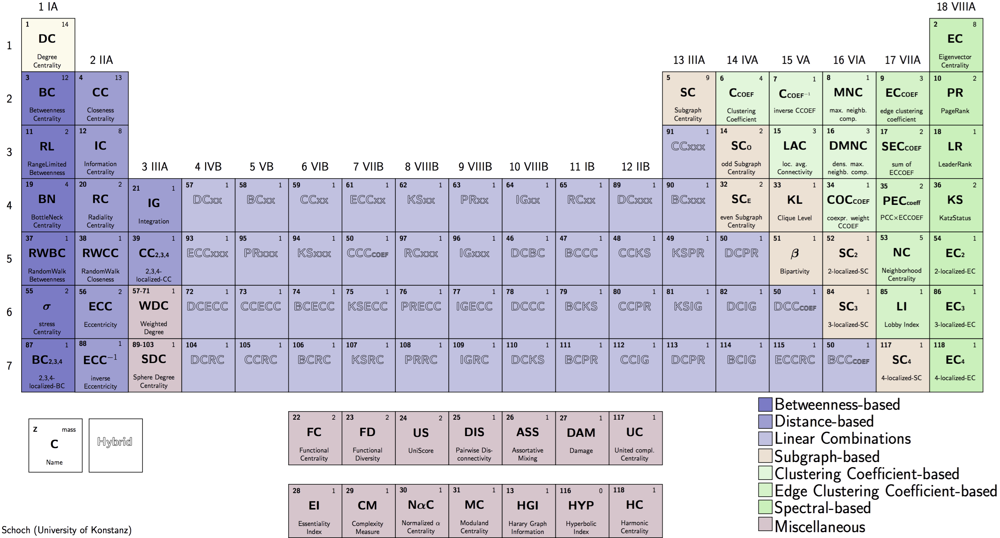

### I. Degree centrality and clustering coefficients



1. **(code)** Find the most important actors according to the degree centrality $d_i=\frac{k_i}{n-1}$, where $n$ is the number of network nodes and $k_i$ is the degree of node $i$. Which actors have the highest $d_i$ (e.g., Hollywood, international, unknown)?



Time complexity: *O(n)*

In [ ]:
import networkx as nx
import utils

actors = nx.Graph(utils.read_pajek("collaboration_imdb"))
actors = nx.convert_node_labels_to_integers(actors, label_attribute=None)

In [ ]:
top_degree = utils.top_nodes(actors, nx.degree_centrality(actors), 'degree')
utils.actor_names(top_degree)

  Centrality | 'degree'
    0.044606 | 'Davis, Mark (V)' (784)
    0.034706 | 'Sanders, Alex (I)' (610)
    0.034081 | 'North, Peter (I)' (599)
    0.033227 | 'Marcus, Mr.' (584)
    0.031919 | 'Tedeschi, Tony' (561)
    0.031577 | 'Dough, Jon' (555)
    0.031008 | 'Stone, Lee (II)' (545)
    0.030325 | 'Voyeur, Vince' (533)
    0.028448 | 'Lawrence, Joel (II)' (500)
    0.028050 | 'Steele, Lexington' (493)
    0.027879 | 'Ashley, Jay' (490)
    0.027025 | 'Boy, T.T.' (475)
    0.026798 | 'Cannon, Chris (III)' (471)
    0.026798 | 'Jeremy, Ron' (471)
    0.026343 | 'Bune, Tyce' (463)



['Mark Davis',
 'Alex Sanders',
 'Peter North',
 'Mr. Marcus',
 'Tony Tedeschi',
 'Jon Dough',
 'Lee Stone',
 'Vince Voyeur',
 'Joel Lawrence',
 'Lexington Steele',
 'Jay Ashley',
 'T.T. Boy',
 'Chris Cannon',
 'Ron Jeremy',
 'Tyce Bune']

| Centrality | 'degree'              |
|------------|-----------------------|
| 0.044606   | 'Davis, Mark (V)' (784)|
| 0.034706   | 'Sanders, Alex (I)' (610)|
| 0.034081   | 'North, Peter (I)' (599)|
| 0.033227   | 'Marcus, Mr.' (584)   |
| 0.031919   | 'Tedeschi, Tony' (561)|
| 0.031577   | 'Dough, Jon' (555)    |
| 0.031008   | 'Stone, Lee (II)' (545)|
| 0.030325   | 'Voyeur, Vince' (533) |
| 0.028448   | 'Lawrence, Joel (II)' (500)|
| 0.028050   | 'Steele, Lexington' (493)|
| 0.027879   | 'Ashley, Jay' (490)   |
| 0.027025   | 'Boy, T.T.' (475)     |
| 0.026798   | 'Cannon, Chris (III)' (471)|
| 0.026798   | 'Jeremy, Ron' (471)   |
| 0.026343   | 'Bune, Tyce' (463)    |

These are **pornographic actors**. Their degree centrality could be explained by the relative speed and efficiency of pornographic film production.

2. **(code)** Find the most important actors according to the clustering coefficient $C_i=\frac{2t_i}{k_i(k_i-1)}$, where $k_i$ is the degree of node $i$ and $t_i$ is the number of triangles including node $i$. You should use the link triad counting algorithm from previous labs. Which actors have the highest $C_i$ (e.g., Hollywood, international, unknown)?



Time complexity: $O(m\langle k\rangle)$

In [ ]:
top_clustering = utils.top_nodes(actors, nx.clustering(actors), 'clustering')
utils.actor_names(top_clustering)

  Centrality | 'clustering'
    1.000000 | 'Rachner, Jonathan' (46)
    1.000000 | 'Doucette, Jeff' (23)
    1.000000 | 'Willis, Susan' (20)
    1.000000 | 'Andersson, Kris' (20)
    1.000000 | 'Kurtis, Bill' (19)
    1.000000 | 'Cantillana, N�stor' (16)
    1.000000 | 'Tolkien, J.R.R.' (15)
    1.000000 | 'Faris, Anna' (15)
    1.000000 | 'Kurata, Tetsuo' (13)
    1.000000 | 'Margera, Jess' (12)
    1.000000 | 'Rakeyohn' (12)
    1.000000 | 'Raab, Chris' (12)
    1.000000 | 'Le Besco, Ma�wenn' (11)
    1.000000 | 'Galindo, Rudy' (11)
    1.000000 | 'Cox, Julie (I)' (11)



['Jonathan Rachner',
 'Jeff Doucette',
 'Susan Willis',
 'Kris Andersson',
 'Bill Kurtis',
 'N�stor Cantillana',
 'J.R.R. Tolkien',
 'Anna Faris',
 'Tetsuo Kurata',
 'Jess Margera',
 'Rakeyohn',
 'Chris Raab',
 'Ma�wenn Le Besco',
 'Rudy Galindo',
 'Julie Cox']

| Centrality | 'clustering'             |
|------------|--------------------------|
| 1.000000   | 'Rachner, Jonathan' (46) |
| 1.000000   | 'Doucette, Jeff' (23)    |
| 1.000000   | 'Willis, Susan' (20)     |
| 1.000000   | 'Andersson, Kris' (20)   |
| 1.000000   | 'Kurtis, Bill' (19)      |
| 1.000000   | 'Cantillana, Néstor' (16)|
| 1.000000   | 'Tolkien, J.R.R.' (15)   |
| 1.000000   | 'Faris, Anna' (15)       |
| 1.000000   | 'Kurata, Tetsuo' (13)    |
| 1.000000   | 'Margera, Jess' (12)     |
| 1.000000   | 'Rakeyohn' (12)          |
| 1.000000   | 'Raab, Chris' (12)       |
| 1.000000   | 'Le Besco, Maïwenn' (11) |
| 1.000000   | 'Galindo, Rudy' (11)     |
| 1.000000   | 'Cox, Julie (I)' (11)    |

These actors don't appear to belong to any particular category. This is a clear example of why $\mu$ correction (see below) is necessary: these are all very low-degree nodes, which can easily achieve the maximal $C=1$ with just a few links among the neighbors.

3. **(homework)** Find the most important actors according to the $\mu$-corrected clustering coefficient $C_i^{\mu}=\frac{2t_i}{k_i\mu}$, where $k_i$ is the degree of node $i$, $t_i$ is the number of triangles including node $i$ and $\mu$ is the maximum number of triangles over a link. You should use the link triad counting algorithm from previous labs. Which actors have the highest $C_i^{\mu}$ (e.g., Hollywood, international, unknown)?

Time complexity: $O(m\langle k\rangle)$

In [ ]:
# here we use μ = 1 for simplicity (only interested in ranking)
top_mu_clustering = utils.top_nodes(
    actors, {i: c * (actors.degree(i) - 1) for i, c in nx.clustering(actors).items()}, '~μ-clustering')

utils.actor_names(top_mu_clustering)

  Centrality | '~μ-clustering'
  171.148148 | 'Helms, Shane' (216)
  171.124424 | 'Wilson, Torrie' (217)
  171.122642 | 'Matthews, Darren (II)' (212)
  171.069767 | 'Greenwald, Nora' (215)
  171.069767 | 'Keibler, Stacy' (215)
  170.897196 | 'Jindrak, Mark' (214)
  170.597285 | 'Wight, Paul' (221)
  170.567442 | 'Guerrero Jr., Chavo' (215)
  170.541284 | 'Bischoff, Eric' (218)
  170.528302 | 'Hugger, John' (212)
  170.374429 | 'Flair, Ric' (219)
  170.166667 | 'Layfield, John' (192)
  170.146119 | 'Huffman, Booker' (219)
  169.972477 | 'Gruner, Peter' (218)
  169.914286 | 'O&apos;Haire, Sean' (210)



['Shane Helms',
 'Torrie Wilson',
 'Darren Matthews',
 'Nora Greenwald',
 'Stacy Keibler',
 'Mark Jindrak',
 'Paul Wight',
 'Chavo Guerrero Jr.',
 'Eric Bischoff',
 'John Hugger',
 'Ric Flair',
 'John Layfield',
 'Booker Huffman',
 'Peter Gruner',
 'Sean O&apos;Haire']

| Centrality  | '~μ-clustering'         |
|-------------|------------------------|
| 171.148148  | 'Helms, Shane' (216)   |
| 171.124424  | 'Wilson, Torrie' (217) |
| 171.122642  | 'Matthews, Darren (II)' (212)|
| 171.069767  | 'Greenwald, Nora' (215)|
| 171.069767  | 'Keibler, Stacy' (215) |
| 170.897196  | 'Jindrak, Mark' (214)  |
| 170.597285  | 'Wight, Paul' (221)    |
| 170.567442  | 'Guerrero Jr., Chavo' (215)|
| 170.541284  | 'Bischoff, Eric' (218) |
| 170.528302  | 'Hugger, John' (212)   |
| 170.374429  | 'Flair, Ric' (219)     |
| 170.166667  | 'Layfield, John' (192) |
| 170.146119  | 'Huffman, Booker' (219)|
| 169.972477  | 'Gruner, Peter' (218)  |
| 169.914286  | 'O'Haire, Sean' (210)  |

These are **professional wrestlers**. Their high clustering could be explained by the design of wrestling tournaments, where competitors are partitioned into groups and all matched against each other.

### II. Eigenvector centrality and PageRank algorithm



1. **(code)** Find the most important actors according to the eigenvector centrality $e_i=\lambda_1^{-1}\sum_jA_{ij}e_j$, where $A$ is the network adjacency matrix and $\lambda_1$ is a normalizing constant. You should use the power iteration algorithm shown below. Which actors have the highest $e_i$ (e.g., Hollywood, international, unknown)?

Eigenvector centrality is a measure of the influence of a node in a network. It assigns relative scores to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes.

Time complexity: *O(cm)* for $c \approx$ 10-100

In [ ]:
import networkx as nx
import utils
G = nx.Graph(utils.read_pajek("collaboration_imdb.net"))

In [ ]:
# Function to calculate the eigenvector centrality of nodes in the graph 'G'
def eigenvector_centrality(G, eps = 1e-6):
    # Initialize eigenvector centrality score
    E = [1] * G.number_of_nodes()
    diff = 1
    # Repeat until the change in scores is less than a small value 'eps'
    while diff > eps:
        # Update scores based on neighbors' scores
        U = [sum([E[j] for j in G[i]]) for i in G.nodes()]
        # Normalize scores
        u = sum(U)
        U = [U[i] * len(G) / u for i in G.nodes()]
        # Calculate change in scores
        diff = sum([abs(E[i] - U[i]) for i in G.nodes()])
        # Use the new scores for the next iteration
        E = U
    return {i: E[i] for i in range(len(E))}


utils.actor_names(utils.top_nodes(G, eigenvector_centrality(G), 'eigenvector'))

  Centrality | 'eigenvector'
   92.477817 | 'Benoit, Chris (I)' (225)
   92.477817 | 'Guerrero, Eddie' (225)
   92.038971 | 'Storm, Lance' (225)
   91.947140 | 'Wight, Paul' (221)
   91.928511 | 'Jericho, Chris' (253)
   91.506554 | 'Runnels, Dustin' (220)
   91.446709 | 'Flair, Ric' (219)
   91.379534 | 'Huffman, Booker' (219)
   91.268470 | 'Bischoff, Eric' (218)
   91.260113 | 'Wilson, Torrie' (217)
   91.110063 | 'Gruner, Peter' (218)
   91.067621 | 'Levy, Scott (III)' (226)
   91.056304 | 'Helms, Shane' (216)
   90.816530 | 'Keibler, Stacy' (215)
   90.816530 | 'Greenwald, Nora' (215)



['Chris Benoit',
 'Eddie Guerrero',
 'Lance Storm',
 'Paul Wight',
 'Chris Jericho',
 'Dustin Runnels',
 'Ric Flair',
 'Booker Huffman',
 'Eric Bischoff',
 'Torrie Wilson',
 'Peter Gruner',
 'Scott Levy',
 'Shane Helms',
 'Stacy Keibler',
 'Nora Greenwald']

**The most important actors** according to eigenvector centrality:


| Centrality | 'eigenvector'             |
|------------|---------------------------|
| 92.477817  | 'Guerrero, Eddie' (225)   |
|  92.477817 | 'Benoit, Chris (I)' (225) |
| 92.038971  | 'Storm, Lance' (225)      |
| 91.947140  | 'Wight, Paul' (221)       |
| 91.928511  | 'Jericho, Chris' (253)    |
| 91.506554  | 'Runnels, Dustin' (220)   |
| 91.446709  | 'Flair, Ric' (219)        |
| 91.379534  | 'Huffman, Booker' (219)   |
| 91.268470  | 'Bischoff, Eric' (218)    |
| 91.260113  | 'Wilson, Torrie' (217)    |
| 91.110063  | 'Gruner, Peter' (218)     |
| 91.067621  | 'Levy, Scott (III)' (226) |
| 91.056304  | 'Helms, Shane' (216)      |
| 90.816530  | 'Keibler, Stacy' (215)    |
| 90.816530  | 'Greenwald, Nora' (215)   |

These are once again **wrestlers**.

2. **(code)** Find the most important actors according to the PageRank algorithm $p_i=\alpha\sum_jA_{ij}\frac{p_j}{k_j}+\frac{1-\alpha}{n}$, where $A$ is the network adjacency matrix, $n$ is the number of network nodes, $k_i$ is the degree of node $i$ and $\alpha$ is the damping factor set to $0.85$. You should use the PageRank algorithm shown below. Which actors have the highest $p_i$ (e.g., Hollywood, international, unknown)?

	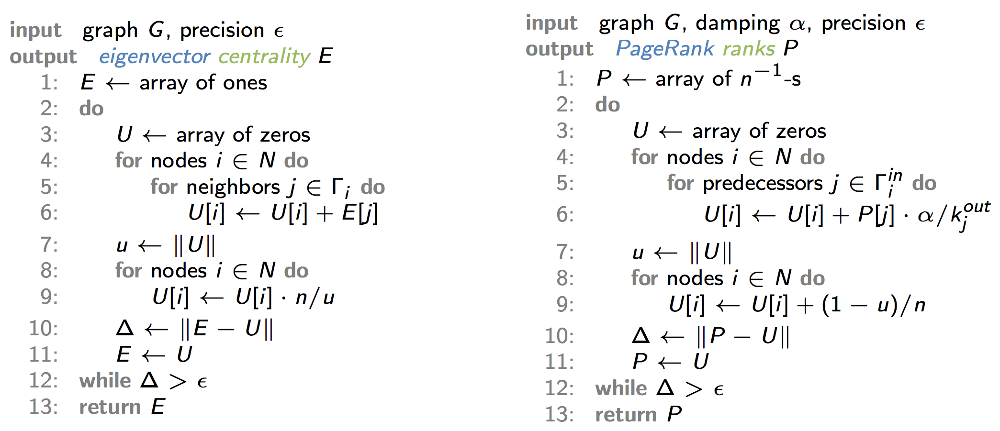

The PageRank algorithm evaluates the importance of each node (actor) based on the number and quality of the links (collaborations) to it. This algorithm is commonly used in search engines (like Google) to rank webpages, but in this case, we're applying it to a graph of actors based on their collaborations.

The PageRank algorithm uses an adjacency matrix A and some initial probabilities p. The adjacency matrix defines the network, while p represents the probabilities for each node.

A damping factor alpha is included to prevent the algorithm from continually bouncing around the graph. This damping factor, usually set to 0.85, represents the probability that a random walk will continue, rather than terminate.

Time complexity: *O(cm)* for $c \approx$ 10-100

In [ ]:
# Function to calculate the PageRank of nodes in the graph 'G'
def pagerank(G, alpha = 0.85, eps = 1e-6):
    P = [1 / len(G)] * len(G)
    diff = 1
    # Repeat until the change in scores is less than a small value 'eps'
    while diff > eps:
        # Update scores based on neighbors' scores and the number of their out-links
        U = [sum([P[j] * alpha / G.degree(j) for j in G[i]]) for i in G.nodes()]
        # Calculate a damping factor based on the 'alpha' parameter
        u = sum(U)
        # Apply the damping factor and ensure that the scores sum up to 1
        U = [U[i] + (1 - u) / len(G) for i in G.nodes()]
        # Calculate change in scores
        diff = sum([abs(P[i] - U[i]) for i in G.nodes()])
        P = U
    return {i: P[i] for i in range(len(P))}


utils.actor_names(utils.top_nodes(G, pagerank(G), 'pagerank'))

  Centrality | 'pagerank'
    0.000660 | 'Hanks, Tom' (457)
    0.000642 | 'Jackson, Samuel L.' (427)
    0.000607 | 'Goldberg, Whoopi' (398)
    0.000561 | 'Stiller, Ben' (382)
    0.000547 | 'Davis, Mark (V)' (784)
    0.000542 | 'Lopez, Jennifer (I)' (410)
    0.000540 | 'Berl�and, Fran�ois' (194)
    0.000536 | 'Berry, Halle' (376)
    0.000514 | 'Diaz, Cameron' (361)
    0.000486 | 'Travolta, John' (335)
    0.000476 | 'Jeremy, Ron' (471)
    0.000468 | 'Myers, Mike (I)' (345)
    0.000466 | 'Cruise, Tom' (336)
    0.000464 | 'Schwarzenegger, Arnold' (333)
    0.000463 | 'Baldwin, Alec' (318)



['Tom Hanks',
 'Samuel L. Jackson',
 'Whoopi Goldberg',
 'Ben Stiller',
 'Mark Davis',
 'Jennifer Lopez',
 'Fran�ois Berl�and',
 'Halle Berry',
 'Cameron Diaz',
 'John Travolta',
 'Ron Jeremy',
 'Mike Myers',
 'Tom Cruise',
 'Arnold Schwarzenegger',
 'Alec Baldwin']

**The most important actors** according to PageRank:


| Centrality | 'eigenvector'                  |
|------------|--------------------------------|
| 0.000660   | 'Hanks, Tom' (457)             |
| 0.000642   | 'Jackson, Samuel L.' (427)     |
| 0.000607   | 'Goldberg, Whoopi' (398)       |
| 0.000561   | 'Stiller, Ben' (382)           |
| 0.000547   | 'Davis, Mark (V)' (784)        |
| 0.000542   | 'Lopez, Jennifer (I)' (410)    |
| 0.000540   | 'Berland, Francois' (194)      |
| 0.000536   | 'Berry, Halle' (376)           |
| 0.000514   | 'Diaz, Cameron' (361)          |
| 0.000486   | 'Travolta, John' (335)         |
| 0.000476   | 'Jeremy, Ron' (471)            |
| 0.000468   | 'Myers, Mike (I)' (345)        |
| 0.000466   | 'Cruise, Tom' (336)            |
| 0.000464   | 'Schwarzenegger, Arnold' (333) |
|  0.000463  | 'Baldwin, Alec' (318)          |

These are famous **Hollywood actors**.

### III. Closeness and betweenness centrality



1. **(code)** Find the most important actors according to the closeness centrality $\ell_i^{-1}=\frac{1}{n-1}\sum_{j\neq i}\frac{1}{d_{ij}}$, where $n$ is the number of network nodes and $d_{ij}$ is the distance between nodes $i$ and $j$. You should use the breadth-first search algorithm from previous labs. Which actors have the highest $\ell_i^{-1}$ (e.g., Hollywood, international, unknown)?



Time complexity: $O(nm)$ - will take about **an hour** on this network!

Notable disadvantage of this measure: center may be significantly shifted by addition of a few links to a peripheral cluster (eg. anime industry). This shift could put a completely unimportant node at the top in terms of closeness centrality.

In [ ]:
import networkx as nx
import utils

actors = nx.Graph(utils.read_pajek("collaboration_imdb"))
actors = nx.convert_node_labels_to_integers(actors, label_attribute=None)

In [ ]:
utils.actor_names(utils.top_nodes(actors, nx.closeness_centrality(actors), 'closeness'))

| Centrality | 'closeness'          |
|------------|----------------------|
| 0.348196   | 'Goldberg, Whoopi' (398) |
| 0.347563   | 'Hanks, Tom' (457)       |
| 0.347275   | 'Jackson, Samuel L.' (427) |
| 0.344406   | 'Berry, Halle' (376)     |
| 0.343527   | 'Diaz, Cameron' (361)    |
| 0.342810   | 'Stiller, Ben' (382)     |
| 0.340340   | 'Lopez, Jennifer (I)' (410) |
| 0.338566   | 'Myers, Mike (I)' (345)  |
| 0.337907   | 'Douglas, Michael (I)' (263) |
| 0.337759   | 'Cruise, Tom' (336)      |
| 0.336428   | 'Travolta, John' (335)   |
| 0.336156   | 'Schwarzenegger, Arnold' (333) |
| 0.334927   | 'De Niro, Robert' (257)  |
| 0.334320   | 'Madonna (I)' (324)      |
| 0.334272   | 'Smith, Will (I)' (326)  |

These are famous **Hollywood actors**.

2. **(homework)** Find the most important actors according to the betweenness centrality $\sigma_i=\frac{1}{n^2}\sum_{st}\frac{g_{st}^i}{g_{st}}$, where $n$ is the number of network nodes, $g_{st}$ is the number of shortest paths between nodes $s$ and $t$, and $g_{st}^i$ is the number of such paths through node $i$. Which actors have the highest $\sigma_i$ (e.g., Hollywood, international, unknown)?

Time complexity: $O(nm)$ - will take about **an hour** on this network!

An implementation note if you want to write this yourself: during BFS, don't track only distances from source, but also number of shortest paths with this distance. This forms the basis of the *Brandes algorithm* detailed in [A faster algorithm for betweenness centrality](https://www.tandfonline.com/doi/abs/10.1080/0022250X.2001.9990249), which is used by the `nx` implementation as of writing this.

In [ ]:
utils.actor_names(utils.top_nodes(actors, nx.betweenness_centrality(actors), 'betweenness'))

| Centrality | 'betweenness' |
|------------|---------------|
| 0.063118   | 'Jeremy, Ron' (471) |
| 0.030540   | 'Chan, Jackie (I)' (135) |
| 0.028039   | 'Cruz, Penélope' (182) |
| 0.027812   | 'Shahlavi, Darren' (8) |
| 0.027628   | 'Del Rosario, Monsour' (6) |
| 0.026140   | 'Depardieu, Gérard' (159) |
| 0.016641   | 'Bachchan, Amitabh' (66) |
| 0.016443   | 'Jackson, Samuel L.' (427) |
| 0.015333   | 'Soualem, Zinedine' (121) |
| 0.014998   | 'Del Rio, Olivia' (168) |
| 0.013836   | 'Jaenicke, Hannes' (73) |
| 0.013709   | 'Hayek, Salma' (185) |
| 0.013587   | 'Pelé' (7) |
| 0.013354   | 'Knaup, Herbert' (63) |
| 0.013283   | 'Goldberg, Whoopi' (398) |

These are **international actors** that have appeared prominently on both Hollywood and their respective local cinema. They have high betweenness centrality because they form *bridges* to their local industry.

# Lab 6

###### Introduction to Network Analysis 2023/24 (vi)

## Link betweenness, node similarity, errors & attacks

### I. Betweenness in transportation networks

You are given two transportation networks in Pajek format.

+ Slovenian highways network from $2010$ ([highways.net](http://lovro.fri.uni-lj.si/ina/nets/highways.net))
+ European highways network from Wikipedia ([euroroads.net](http://lovro.fri.uni-lj.si/ina/nets/euroroads.net))

&nbsp;

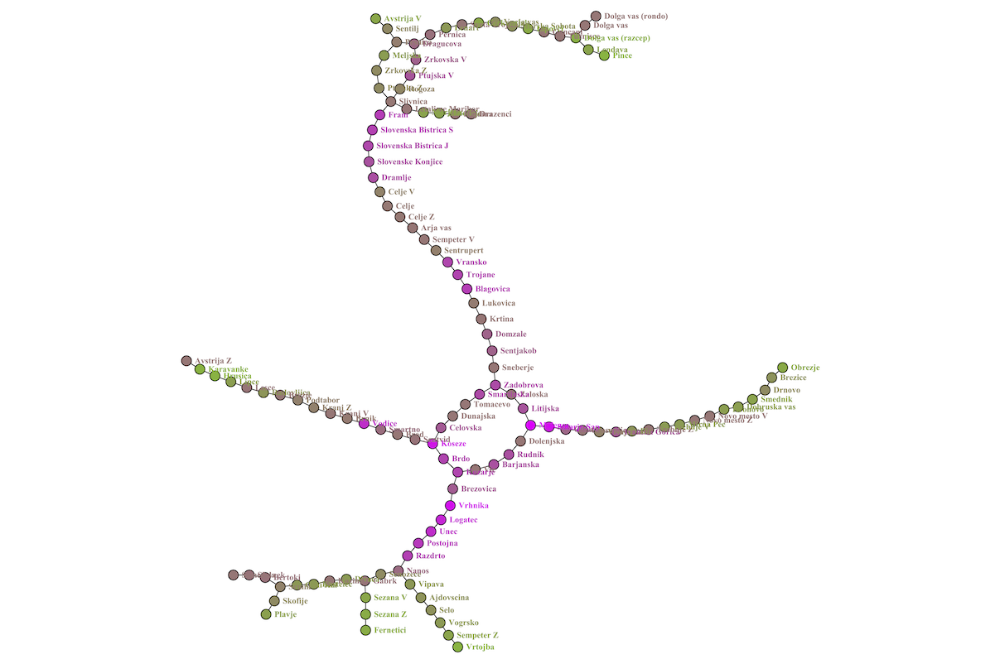



1. **(code)** Compute standard statistics of the networks. Are the results expected?



In [ ]:
import utils

def traffic_parser(label, value):
    return {"label": label, "value": float(value)}

highways = {
    "SLO": utils.read_pajek("highways", label_parser=traffic_parser),
    "EUR": utils.read_pajek("euroroads")
}

for net in highways.values():
    utils.info(net, distance_sample=300)

  MultiGraph | 'highways'
       Nodes | 124 (iso=0)
       Edges | 125 (loop=0)
      Degree | 2.02 (max=4)
         LCC | 100.0% (n=1)
    Distance | 23.09 (max=60)

MultiDiGraph | 'euroroads'
       Nodes | 1,174 (iso=0)
       Edges | 2,834 (loop=0)
      Degree | 2.41 max(in=10, out=10)
         LCC | 88.5% (n=26)
    Distance | 18.52 (max=60)



We can see low clustering and high distances, as expected for a sensibly-planned cross-country road network.
Note that slovenian highways have $m=n+1$, which is 2 more edges than a tree would have ($n - 1$). These 2 extra edges close the loops around Ljubljana and Maribor.
The fact that `euroroads` have a LLC containing only ~90% of nodes is explained by the inclusion of the UK's roads in this data.

2. **(code)** Find the most important highways according to the link betweenness centrality $\sigma_{ij}=\sum_{st\notin\{i,j\}}\frac{g_{st}^{ij}}{g_{st}}$, where $g_{st}$ is the number of geodesic paths between nodes $s$ and $t$, and $g_{st}^{ij}$ is the number of such paths through the link between nodes $i$ and $j$. Which highways have the highest $\sigma_{ij}$?



In [ ]:
import networkx as nx

for loc, hw in highways.items():
    print(loc)
    btwns = {(i,j): c for (i,j,_), c in nx.edge_betweenness_centrality(hw).items()}
    utils.top_edges(hw, btwns, "betweenness")
    print()

SLO
  Centrality | 'betweenness'
    0.481904 | 'Sneberje' - 'Zadobrova'(27,233)
    0.478363 | 'Šentjakob' - 'Sneberje'(23,555)
    0.474561 | 'Domžale' - 'Šentjakob'(26,423)
    0.470496 | 'Krtina' - 'Domžale'(23,555)
    0.466168 | 'Lukovica' - 'Krtina'(19,932)
    0.461579 | 'Blagovica' - 'Lukovica'(28,481)
    0.456727 | 'Trojane' - 'Blagovica'(36,925)
    0.451613 | 'Vransko' - 'Trojane'(35,807)
    0.446237 | 'Šentrupert' - 'Vransko'(26,818)
    0.440598 | 'Šempeter V' - 'Šentrupert'(19,387)
    0.434697 | 'Arja vas' - 'Šempeter V'(20,687)
    0.428534 | 'Celje Z' - 'Arja vas'(20,277)
    0.422109 | 'Celje' - 'Celje Z'(19,867)
    0.415421 | 'Celje V' - 'Celje'(18,474)
    0.408471 | 'Dramlje' - 'Celje V'(24,884)


EUR
  Centrality | 'betweenness'
    0.087577 | 'Rennes' - 'Brest'
    0.087577 | 'Brest' - 'Rennes'
    0.087246 | 'Le Mans' - 'Rennes'
    0.087246 | 'Rennes' - 'Le Mans'
    0.085384 | 'Brest' - 'Minsk'
    0.085384 | 'Minsk' - 'Brest'
    0.078568 | 'Smolensk' - '

The 4 most important roads are the first ones leading from the Ljubljana ring toward the northeast. In general, we would expect that many geodesic pahts go through the start of a "branch" of highways, as any path leading to the respective region of Slovenia has to go through there. This effect is especially prominent for longer branches (the north-eastern being the longest).


3. **(homework)** For the Slovenian highways network, compute the Pearson and Spearman correlation coefficients between the highways betweenness centrality $\sigma_{ij}$ and their actual traffic load. (Assume that the traffic load of a highway is the average of the traffic loads of its endpoints.) Is $\sigma_{ij}$ positively correlated with traffic load?

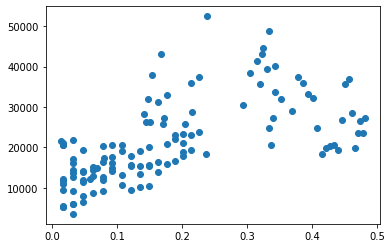

      Person | 0.6254
    Spearman | 0.7138


In [ ]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr

G = highways["SLO"]
C = {(i,j): c for (i,j,_), c in nx.edge_betweenness_centrality(G).items()}
x, y = [], []

for i, j in C:
    x.append(C[(i, j)])
    y.append((G.nodes[i]['value'] + G.nodes[j]['value']) / 2)

plt.scatter(x, y)
plt.show()

print("{:>12s} | {:.4f}".format('Person', pearsonr(x, y)[0]))
print("{:>12s} | {:.4f}".format('Spearman', spearmanr(x, y)[0]))

The correlation *is* positive as expected, however this centrality is only a decent predictor of traffic load for $\sigma_{ij} \leq 0.2$ (as seen in the plot). If we had a very clear correlation for the entire dataset, we could even try to predict these traffic load for european highways with a model trained on Slovenia.

### II. Movie recommendations with PageRank

You are given a small knowledge graph of $1337$ movies in Pajek format ([movies_graph.net](http://lovro.fri.uni-lj.si/ina/nets/movies_graph.net)). Nodes represent either individual movies or their different *modes* such as language, country, genres, actors, director etc.



1. **(code)** Compute standard statistics of the network. Are the results expected?



In [ ]:
import utils
import networkx as nx

movies = utils.read_pajek("movies_graph")
utils.info(movies, clustering_sample=len(movies))

if nx.is_bipartite(movies):
    print(f"{movies.name} is bipartite!")

  MultiGraph | 'movies_graph'
       Nodes | 6,577 (iso=0)
       Edges | 16,842 (loop=0)
      Degree | 5.12 (max=1,213)
         LCC | 100.0% (n=1)
  Clustering | 0.0000

movies_graph is bipartite!


Clustering is 0, as expected for a bipartite graph.

2. **(code)** Find the most important movies according to the PageRank algorithm $p_i=\alpha\sum_jA_{ij}\frac{p_j}{k_j}+\frac{1-\alpha}{n}$, where $A$ is the network adjacency matrix, $n$ is the number of network nodes, $k_i$ is the degree of node $i$ and $\alpha$ is the damping factor set to $0.85$. Which movies have the highest PageRank score?



In [ ]:
G = movies
_ = utils.top_nodes(G, utils.pagerank(G), 'pagerank')

  Centrality | 'pagerank'
    0.000764 | 'Movie 43' (21)
    0.000604 | 'Parade' (18)
    0.000588 | 'Joyeux Noel' (23)
    0.000584 | 'Children of Men' (22)
    0.000583 | '7 Boxes' (17)
    0.000576 | 'Hitman's Bodyguard' (24)
    0.000568 | 'Nomad - The Warrior' (15)
    0.000563 | 'Hunting Party' (20)
    0.000560 | 'Moana' (18)
    0.000551 | 'Wonder Woman' (23)
    0.000548 | 'Saving Santa' (18)
    0.000546 | 'Turbo Kid' (17)
    0.000545 | 'Wild Life' (18)
    0.000543 | 'Valerian and the City of a Thousand Planets' (23)
    0.000542 | 'Blade Runner 2049' (23)



The first movie (*Movie 43*) as an anthology film featuring 14 different storylines and many different famous actors, which boosted its PageRank score.

3. **(code)** Consider random walks with restarts $p^t_i=\alpha\sum_jA_{ij}\frac{p^t_j}{k_j}+(1-\alpha)\delta_{it}$, where $t$ is a selected teleport node and $\delta$ is the Kronecker delta.
How could you use this algorithm to find movies similar to, e.g., *Moana*?



In [ ]:
def similar_movies(title: str):
    tp = {utils.find_node(G, title)}
    pr = utils.pagerank(G, teleport=tp) # every restart will begin at the target movie (eg. Moana)
    utils.top_nodes(G, pr, 'pagerank')
    return pr

moana_pr = similar_movies("Moana")

  Centrality | 'pagerank'
    0.223491 | 'Moana' (18)
    0.001624 | 'Saving Santa' (18)
    0.001515 | 'Frozen' (16)
    0.001493 | 'Smallfoot' (16)
    0.001449 | 'Lion King' (19)
    0.001444 | 'Hoodwinked' (17)
    0.001430 | 'Rio' (16)
    0.001341 | 'Book of Life' (16)
    0.001287 | 'Muppets Most Wanted' (15)
    0.001237 | 'Aladdin' (16)
    0.001196 | 'Into the Woods' (13)
    0.001133 | 'Greatest Showman' (11)
    0.001130 | 'Planet 51' (18)
    0.001033 | 'Sweeney Todd - The Demon Barber of Fleet Street' (14)
    0.000956 | 'Jumanji 2 - Welcome to the Jungle' (17)



Note that this heuristic was smart enough to find the live-action *Aladdin* among animated films.

In [ ]:
# here you can play around with your favorite movies
for movie in ["Pulp Fiction", "The Room"]:
    print(f"similar to {movie}:")
    try:
        similar_movies(movie)
    except ValueError as err:
        print(err)

similar to Pulp Fiction:
  Centrality | 'pagerank'
    0.190888 | 'Pulp Fiction' (12)
    0.003497 | 'Funny Games' (11)
    0.003449 | 'Liability' (11)
    0.003126 | 'Hardcore Henry' (15)
    0.003075 | 'Incredible Hulk' (13)
    0.002930 | 'Death Proof' (10)
    0.002892 | 'Sin City' (12)
    0.002783 | 'Hateful Eight' (11)
    0.002775 | 'Django Unchained' (13)
    0.002756 | 'Inglourious Basterds' (11)
    0.002363 | 'I Am Wrath' (12)
    0.002288 | 'Bolt' (14)
    0.002224 | 'From Paris with Love' (16)
    0.002168 | 'Be Cool' (12)
    0.002102 | 'Killing Season' (11)

similar to The Room:
node 'The Room' not found in movies_graph


4. **(homework)** Consider the personalized PageRank algorithm $p^{[t]}_i=\alpha\sum_jA_{ij}\frac{p^{[t]}_j}{k_j}+(1-\alpha)[t]_i$, where $[t]$ is a selected personalization vector, $\sum_i[t]_i=1$. How could you use this algorithm to find movies similar to, e.g., dramas starred by Tom Hanks, action and adventure movies with Johnny Depp or movies co-starred by Brad Pitt and George Clooney?



In [ ]:
conjunctive_queries = [
    {"m-Drama", "m-Tom Hanks"},
    {"m-Action", "m-Adventure", "m-Johnny Depp"},
    {"m-Brad Pitt", "m-George Clooney"}
]

for M in conjunctive_queries:
    # each mode-node is a candidate teleport target (with equal probability)
    utils.top_nodes(G, utils.pagerank(G, teleport = {utils.find_node(G, m) for m in M}), str(M))

  Centrality | '{'m-Tom Hanks', 'm-Drama'}'
    0.008388 | 'Forrest Gump' (10)
    0.008339 | 'Toy Story of Terror' (11)
    0.008328 | 'Polar Express' (11)
    0.008097 | 'Toy Story That Time Forgot' (14)
    0.008093 | 'Sully' (10)
    0.007797 | 'Captain Phillips' (14)
    0.007738 | 'Toy Story 3' (14)
    0.007590 | 'Angels & Demons' (10)
    0.007585 | 'Saving Private Ryan' (13)
    0.007544 | 'Saving Mr. Banks' (11)
    0.007077 | 'Inferno' (18)
    0.006968 | 'Da Vinci Code' (16)
    0.000786 | 'Kraftidioten' (19)
    0.000773 | 'Blade Runner 2049' (23)
    0.000714 | 'Blind Side' (11)

  Centrality | '{'m-Action', 'm-Johnny Depp', 'm-Adventure'}'
    0.003613 | 'Pirates of the Caribbean 2 - Dead Man's Chest' (15)
    0.003519 | 'Fantastic Beasts - The Crimes of Grindelwald' (13)
    0.003507 | 'Alice Through the Looking Glass' (11)
    0.003502 | 'Alice in Wonderland' (12)
    0.003489 | 'Pirates of the Caribbean 5 - Dead Men Tell No Tales' (16)
    0.003474 | 'Pirates of the C

5. **(discuss)** Examples above include only *positive* queries by measuring similarity between the movies and selected modes. But how could handle also *negative* queries such as, e.g., you do not like romantic movies or a particular actor?

For *hard* negatives, we could simply skip unwanted query results. For *soft* negatives, we could do a separate run of personalized PageRank for undesired modes, and subtract these scores from the ones obtained for desired modes.

Similarly, for *disjunctive* quieries (eg. *either* Tom Hanks *or* Bradd Pitt), we could do a separate run for each query term and take the *maximum* score.

### III. Errors and attacks on the Internet

You are given the *nec* Internet overlay map in Pajek format ([nec.net](http://lovro.fri.uni-lj.si/ina/nets/nec.net)). Routers, switches and hubs on the Internet fail from time to time. Your task is to study how this affects the Internet's ability to stay *connected*.



1. **(discuss)** Simulate such failure by *random* removal of nodes and measure the fraction of nodes in the largest connected component. Next, consider also a malicious individual attacking the Internet. Simulate such *attack* by removing highly linked nodes (i.e. hubs) and again measure the fraction of nodes in the largest connected component.

	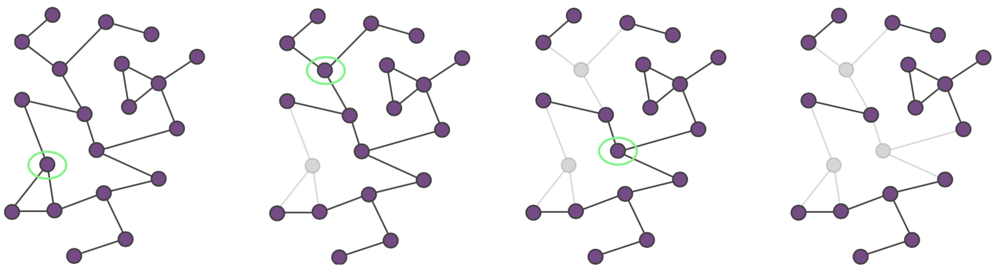



2. **(code)** For each of the two scenarios, plot the fraction of nodes in the largest connected component after removing $0\%$--$50\%$ of the nodes. Is the Internet robust to random failures? Is the Internet robust to targeted attacks?



In [ ]:
import utils
import networkx as nx

G = nx.Graph(utils.read_pajek("nec")) # make undirectd for fast LCC computation
utils.info(G)

       Graph | 'nec'
       Nodes | 75,885 (iso=0)
       Edges | 357,317 (loop=0)
      Degree | 9.42 (max=13,346)
         LCC | 100.0% (n=1)



removing 1% of nodes at a time: 100%|██████████| 50/50 [00:10<00:00,  4.80it/s]


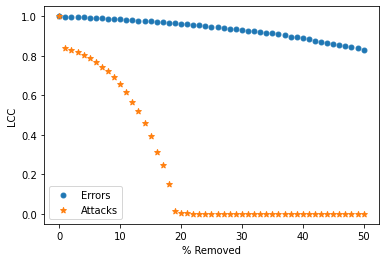

In [ ]:
import random
from tqdm import tqdm
import matplotlib.pyplot as plt

def remove_nodes(G, n, attack = True):
  if attack:
    nodes = [i for i, _ in sorted(G.degree(), key = lambda item: -item[1])]
  else:
    nodes = list(G.nodes())
    random.shuffle(nodes)
  G.remove_nodes_from(nodes[:n])
  return G


def simulate_failure(G, removed_percent=50):
    E = G.copy()
    A = G.copy()

    r = removed_percent
    n = round(len(G) / 100)
    LCC = {'E': [utils.lcc(E)], 'A': [utils.lcc(A)]}

    for _ in tqdm(range(r), desc="removing 1% of nodes at a time"):
        remove_nodes(E, n, attack = False)
        LCC['E'].append(utils.lcc(E))

        remove_nodes(A, n, attack = True)
        LCC['A'].append(utils.lcc(A))

    plt.scatter(range(r + 1), LCC['E'], s = 24, label = "Errors")
    plt.scatter(range(r + 1), LCC['A'], marker = '*', label = "Attacks")
    plt.ylabel("LCC")
    plt.xlabel("% Removed")
    plt.legend()
    plt.show()

simulate_failure(G)

Clearly the internet *is* robust to random failures, but *not* to targeted attacks.

3. **(homework)** Repeat the experiments also for Erd&ouml;s-R&eacute;nyi random graphs with the same number of nodes and links as the Internet overlay map.

removing 1% of nodes at a time: 100%|██████████| 50/50 [00:19<00:00,  2.53it/s]


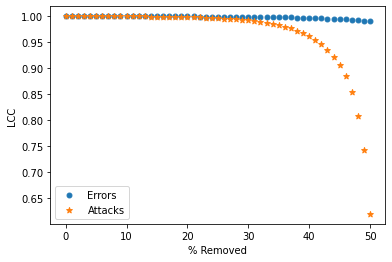

In [ ]:
rand_graph = utils.ER_random_graph(n=len(G), m=G.number_of_edges())
simulate_failure(rand_graph)

# Lab 7 


###### Introduction to Network Analysis 2023/24 (vii)

## Community detection, blockmodeling & stochastic block models

Browse [CDlib](https://cdlib.readthedocs.io/en/latest/), [NetworkX](https://networkx.org/documentation/stable/reference/algorithms/community.html), [graph-tool](https://graph-tool.skewed.de/static/doc/demos/inference/inference.html) or other library for implementations of network community detection and graph partitioning algorithms. Select an algorithm which you will be using in the exercises below. For instance, select one of most popular algorithms such as hierarchical optimization of modularity known as Louvain algorithm, map equation algorithm called Infomap, simple label propagation algorithm, hierarchical clustering based on edge betweenness, Markov clustering algorithm, (degree-corrected) stochastic block model etc.

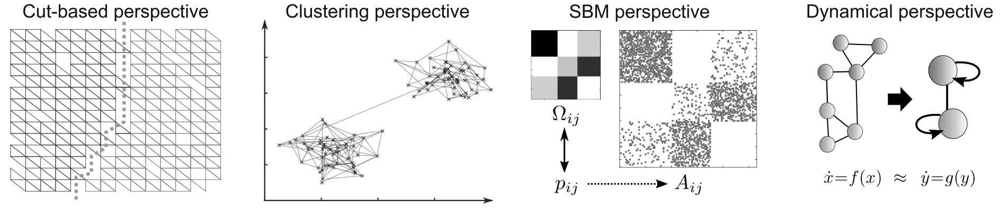

### I. Community detection in small social networks

You are given three small social networks with known sociological partitioning of nodes.

+ Zachary karate club network with 2 groups ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ Lusseau bottlenose dolphins network with 2 groups ([dolphins.net](http://lovro.fri.uni-lj.si/ina/nets/dolphins.net))
+ US college football network with 12 conferences ([american_football.net](http://lovro.fri.uni-lj.si/ina/nets/american_football.net))



1. **(code)** Apply the algorithm to small social networks and test whether the revealed communities coincide with sociological partitioning of these networks. You should apply the algorithm to each network multiple times and compare partitions using some standard measure such as normalized mutual information or adjusted Rand index. Since these networks are very small, you can also print out or visualize the results.

In [ ]:
pip install cdlib

In [ ]:
import utils

soc_nets = [utils.read_pajek(name) for name in ["karate_club", "dolphins", "american_football"]]

In [ ]:
from cdlib import algorithms, viz

# see https://cdlib.readthedocs.io/en/latest/reference/cd_algorithms/node_clustering.html
algs = {"Known": lambda G: utils.known_clustering(G), "Infomap": algorithms.infomap, "Louvain": algorithms.louvain,
        "LPA": algorithms.label_propagation, "FLPA": utils.fast_label_propagation, "EB": lambda G: algorithms.girvan_newman(G, level = 1)}
        # "MCL": algorithms.markov_clustering, "Leiden": algorithms.leiden

# NOTE: this wasn't properly tested, as cdlib is a nightmare to install.
for G in soc_nets:
  utils.info(G)
  utils.CD_comparison(G, algs, runs = 100)
  #viz.plot_network_clusters(G, algs["Known"](G), nx.spring_layout(G))
  #plt.show()

  MultiGraph | 'karate_club'
       Nodes | 34 (iso=0)
       Edges | 78 (loop=0)
      Degree | 4.59 (max=17)
         LCC | 100.0% (n=1)
  Clustering | 0.5706

   Algorithm | Count   Q      NMI    ARI    VI  
     'Known' |     2  0.371  1.000  1.000  0.000
   'Infomap' |     3  0.402  0.699  0.702  0.732
   'Louvain' |     4  0.415  0.631  0.514  1.061
       'LPA' |     3  0.325  0.445  0.473  1.299
      'FLPA' |     3  0.346  0.696  0.685  0.647
        'EB' |     2  0.360  0.836  0.882  0.325

  MultiGraph | 'dolphins'
       Nodes | 62 (iso=0)
       Edges | 159 (loop=0)
      Degree | 5.13 (max=12)
         LCC | 100.0% (n=1)
  Clustering | 0.2590

   Algorithm | Count   Q      NMI    ARI    VI  
     'Known' |     2  0.373  1.000  1.000  0.000
   'Infomap' |     6  0.524  0.554  0.354  1.423
   'Louvain' |     5  0.520  0.513  0.336  1.524
       'LPA' |     6  0.499  0.527  0.361  1.460
      'FLPA' |     4  0.476  0.629  0.516  1.050
        'EB' |     2  0.379  0.889  0.93

Results are:

|   Graph   | Nodes | Edges | Degree |  LCC   | Clustering |
| :-------: | :---: | :---: | :----: | :----: | :--------: |
| karate_club |  34 (0)  |  78 (0)  | 4.59 (17) | 100.0% (1) |   0.5706   |

<br>

|  Algorithm  | Count |   Q   |  NMI  |  ARI  |    VI    |
| :---------: | :---: | :---: | :---: | :---: | :------: |
|   'Known'   |   2   | 0.371 | 1.000 | 1.000 |  0.000   |
|  'Infomap'  |   3   | 0.402 | 0.699 | 0.702 |  0.732   |
|  'Louvain'  |   4   | 0.416 | 0.639 | 0.521 |  1.037   |
|  'Leiden'   |   4   | 0.420 | 0.687 | 0.541 |  0.908   |
|    'LPA'    |   3   | 0.325 | 0.445 | 0.473 |  1.299   |
|   'FLPA'    |   3   | 0.328 | 0.642 | 0.629 |  0.726   |
|    'MCL'    |   2   | 0.360 | 0.836 | 0.882 |  0.325   |
|     'EB'    |   2   | 0.360 | 0.836 | 0.882 |  0.325   |

<br>
<br>

|  Graph   | Nodes | Edges | Degree |  LCC   | Clustering |
| :------: | :---: | :---: | :----: | :----: | :--------: |
| dolphins | 62 (0) | 159 (0) | 5.13 (12) | 100.0% (1) |   0.2590   |

<br>

|  Algorithm  | Count |   Q   |  NMI  |  ARI  |    VI    |
| :---------: | :---: | :---: | :---: | :---: | :------: |
|   'Known'   |   2   | 0.373 | 1.000 | 1.000 |  0.000   |
|  'Infomap'  |   5   | 0.525 | 0.613 | 0.418 |  1.148   |
|  'Louvain'  |   5   | 0.521 | 0.517 | 0.337 |  1.514   |
|  'Leiden'   |   5   | 0.527 | 0.587 | 0.376 |  1.279   |
|    'LPA'    |   6   | 0.499 | 0.527 | 0.361 |  1.460   |
|   'FLPA'    |   4   | 0.479 | 0.617 | 0.496 |  1.075   |
|    'MCL'    |  12   | 0.455 | 0.448 | 0.205 |  2.233   |
|     'EB'    |   2   | 0.379 | 0.889 | 0.935 |  0.204   |

<br>
<br>

|    Graph    | Nodes | Edges | Degree |  LCC   | Clustering |
| :---------: | :---: | :---: | :----: | :----: | :--------: |
| american_football | 115 (0) | 616 (0) | 10.71 (13) | 100.0% (1) |   0.4032   |

<br>

|  Algorithm  | Count |   Q   |  NMI  |  ARI  |    VI    |
| :---------: | :---: | :---: | :---: | :---: | :------: |
|   'Known'   |   12  | 0.551 | 1.000 | 1.000 |  0.000   |
|  'Infomap'  |   10  | 0.601 | 0.892 | 0.817 |  0.737   |
|  'Louvain'  |   10  | 0.600 | 0.878 | 0.778 |  0.827   |
|  'Leiden'   |   10  | 0.601 | 0.890 | 0.807 |  0.749   |
|    'LPA'    |   10  | 0.580 | 0.840 | 0.672 |  1.079   |
|   'FLPA'    |   11  | 0.590 | 0.889 | 0.786 |  0.756   |
|    'MCL'    |   12  | 0.597 | 0.927 | 0.889 |  0.517   |
|     'EB'    |   2   | 0.396 | 0.359 | 0.140 |  2.912   |


For variation of information (*VI*), smaller is better. The algorithms seem to perform reasonably well on small networks, however many of them detect more than 2 groups in the `karate_club` network.

### II. Community detection in networks with node metadata

You are given three larger networks with some metadata associated with each node.

+ Java class dependency network with 54 packages ([cdn_java.net](http://lovro.fri.uni-lj.si/ina/nets/cdn_java.net))
+ WikiLeaks cable reference network with 246 embassies ([wikileaks.net](http://lovro.fri.uni-lj.si/ina/nets/wikileaks.net))
+ US college Facebook social network with 66 dormitories ([dormitory.net](http://lovro.fri.uni-lj.si/ina/nets/dormitory.net))



1. **(code)** Apply the algorithm to larger networks and test whether the revealed communities coincide with metadata associated with the nodes of these networks. You should apply the algorithm to each network multiple times and compare partitions using some standard measure.

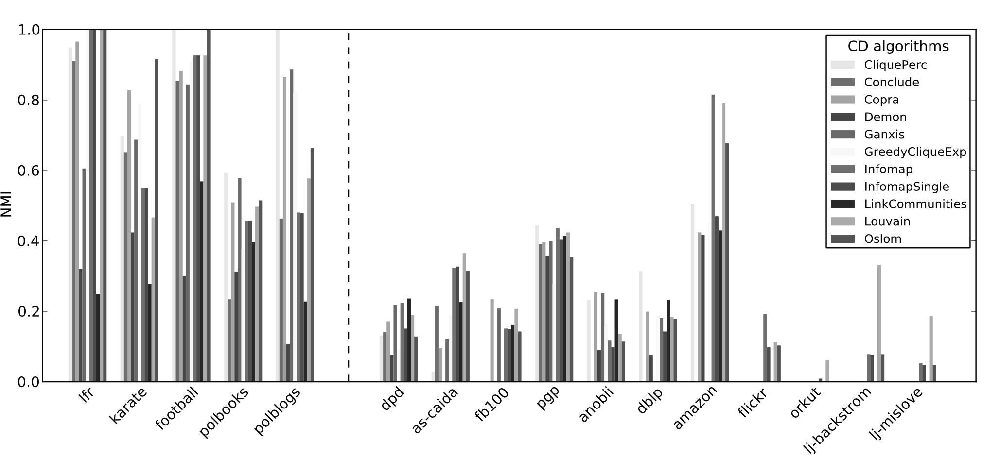

In [ ]:
pip install cdlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 230.3/230.3 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.7/17.7 MB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 45.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 25.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 33.9 MB/s eta 0:00:00


In [ ]:
import utils
import networkx as nx

# convert to undirected (difficult to define communities in DiGraph)
nets = [nx.Graph(utils.read_pajek(name)) for name in ["cdn_java", "wikileaks", "dormitory"]]

In [ ]:
from cdlib import algorithms

# see https://cdlib.readthedocs.io/en/latest/reference/cd_algorithms/node_clustering.html
algs = {"Known": lambda G: utils.known_clustering(G), "Infomap": algorithms.infomap,
        "Louvain": algorithms.louvain, "LPA": algorithms.label_propagation}
        # "Leiden": algorithms.leiden, "FLPA": utils.fast_label_propagation

# NOTE: this wasn't properly tested, as cdlib is a nightmare to install.

for G in nets:
    utils.info(G)
    utils.CD_comparison(G, algs, runs = 10)

       Graph | 'cdn_java'
       Nodes | 1,516 (iso=0)
       Edges | 10,049 (loop=0)
      Degree | 13.26 (max=1,315)
         LCC | 100.0% (n=1)
  Clustering | 0.6851

   Algorithm | Count   Q      NMI    ARI    VI  
     'Known' |    54  0.210  1.000  1.000  0.000
   'Infomap' |    60  0.430  0.581  0.137  3.990
   'Louvain' |    11  0.455  0.438  0.143  4.578
       'LPA' |     1  0.000  0.000  0.000  5.049

       Graph | 'wikileaks'
       Nodes | 52,416 (iso=0)
       Edges | 78,506 (loop=0)
      Degree | 3.00 (max=384)
         LCC | 100.0% (n=1)
  Clustering | 0.1847

   Algorithm | Count   Q      NMI    ARI    VI  
     'Known' |   246  0.818  1.000  1.000  0.000
   'Infomap' |  4334  0.881  0.652  0.043  6.473
   'Louvain' |   172  0.978  0.699  0.468  4.175
       'LPA' | 11134  0.735  0.632  0.026  7.280

       Graph | 'dormitory'
       Nodes | 11,219 (iso=0)
       Edges | 663,336 (loop=0)
      Degree | 118.25 (max=1,061)
         LCC | 100.0% (n=1)
  Clustering | 0.1

Results we obtain are listed bellow:


|    Graph    |      Nodes      |      Edges      |      Degree      |      LCC      |  Clustering  |
| :---------: | :-------------: | :-------------: | :--------------: | :-----------: | :----------: |
|  cdn_java   |   1,516 (0)    |   10,151 (0)   |   13.39 (1,322)   | 100.0% (1) |    0.6851    |

<br>

|  Algorithm  |     Count     |        Q        |       NMI       |       ARI       |       VI       |
| :---------: | :-----------: | :-------------: | :-------------: | :-------------: | :-------------: |
|   'Known'   |      54       |     0.208       |      1.000      |      1.000      |      0.000      |
|  'Infomap'  |      51       |     0.424       |      0.561      |      0.186      |      4.204      |
|  'Louvain'  |      12       |     0.445       |      0.452      |      0.155      |      4.504      |
|  'Leiden'   |      13       |     0.458       |      0.441      |      0.128      |      4.589      |
|    'LPA'    |      1        |     -0.010      |      0.000      |      0.000      |      5.049      |
|   'FLPA'    |      3        |     0.208       |      0.103      |      0.007      |      5.046      |

<br><br>

|    Graph    |      Nodes      |      Edges      |      Degree      |      LCC      |  Clustering  |
| :---------: | :-------------: | :-------------: | :--------------: | :-----------: | :----------: |
|  wikileaks  |  52,416 (0)   |  78,506 (0)   |     3.00 (384)      | 100.0% (1) |    0.1864    |

<br>

|  Algorithm  |     Count     |        Q        |       NMI       |       ARI       |       VI       |
| :---------: | :-----------: | :-------------: | :-------------: | :-------------: | :-------------: |
|   'Known'   |     246       |     0.818       |      1.000      |      1.000      |      0.000      |
|  'Infomap'  |     32        |     0.951       |      0.577      |      0.293      |      4.908      |
|  'Louvain'  |     173       |     0.978       |      0.699      |      0.465      |      4.178      |
|  'Leiden'   |     182       |     0.979       |      0.701      |      0.464      |      4.175      |
|    'LPA'    |    11134      |     0.735       |      0.632      |      0.026      |      7.280      |
|   'FLPA'    |    8671       |     0.778       |      0.636      |      0.028      |      7.075      |

<br><br>

|    Graph    |      Nodes      |      Edges      |      Degree      |      LCC      |  Clustering  |
| :---------: | :-------------: | :-------------: | :--------------: | :-----------: | :----------: |
| dormitory   | 11,219 (0)  | 663,336 (0) | 118.25 (1,061) | 100.0% (1) |    0.1973    |

<br>

|  Algorithm  |     Count     |        Q        |       NMI       |       ARI       |       VI       |
| :---------: | :-----------: | :-------------: | :-------------: | :-------------: | :-------------: |
|   'Known'   |      66       |     0.138       |      1.000      |      1.000      |      0.000      |
|  'Infomap'  |      32       |     0.398       |      0.193      |      0.037      |      5.595      |
|  'Louvain'  |      8        |     0.452       |      0.163      |      0.032      |      5.843      |
|  'Leiden'   |      8        |     0.450       |      0.167      |      0.033      |      5.735      |
|    'LPA'    |      10       |     0.083       |      0.185      |      0.033      |      4.066      |
|   'FLPA'    |      8        |     0.153       |      0.187      |      0.036      |      4.228      |

<br><br>

We didn't detect the software packages in `cdn_java` as separate communities, because a software dependency graph usually forms some kind of multipartite structure. For example, a package with algorithms will depend on a package with datatypes (for its function signatures), however there is no reason to expect algorithms to depend on other algorithms etc.

For `dormitory`, the results are also pretty much useless (see the normalized mutual information column, which is quite similar across algorithms).

The main problem here is the we want these algorithms to detect some partition that *we* devised. In the case of `dormitory`, the nodes are labeled by a given student's dorm, while an algorithm could just as well detect some other type of partitioning (eg. by gender or age).

### III. Community detection in Girvan-Newman benchmark graphs



1. **(code)** Apply the algorithm to Girvan-Newman synthetic benchmark graphs with planted partition and test whether the revealed communities coincide with the planted group structure. You should apply the algorithm to graphs with varying mixing parameter $\mu$ and compare partitions using some standard measure. For which values of $\mu$ does the algorithm reveal the planted partition?

For these benchmark graphs, we have $n = 128 = 4 * 32$, $\langle k\rangle = 16$ and link probability
$$
p_{ij} = \begin{cases}
        \frac{16}{31} (1 - \mu) & \text{if } c_i = c_j \\
        \frac{16}{96}  \mu     &  \text{if } c_i \neq c_j
\end{cases}
$$
since there are 31 nodes within the same cluster and 96 in other clusters.
Note that this is a kind of stochastic block model.

In [ ]:
pip install cdlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 230.3/230.3 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.7/17.7 MB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 51.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 33.8 MB/s eta 0:00:00


In [ ]:
import utils
import networkx as nx
from matplotlib import pyplot as plt
import random

def girvan_newman(mu=0.1):
    G = nx.MultiGraph(name="girvan_newman")
    for i in range(128):
        G.add_node(i, cluster=i // 32 + 1)

    for i in range(128):
        for j in range(i + 1, 128):
            if G.nodes[i]['cluster'] == G.nodes[j]['cluster']:
                if random.random() < 16 * (1 - mu) / 31:
                    G.add_edge(i, j)
            else:
                if random.random() < mu / 6: # 16/96 == 1/6
                    G.add_edge(i, j)

    return G


utils.info(girvan_newman())

  MultiGraph | 'girvan_newman'
       Nodes | 128 (iso=0)
       Edges | 1,048 (loop=0)
      Degree | 16.38 (max=25)
         LCC | 100.0% (n=1)
  Clustering | 0.3844



In [ ]:
from cdlib import algorithms
import numpy as np
from tqdm import tqdm


# see https://cdlib.readthedocs.io/en/latest/reference/cd_algorithms/node_clustering.html
algs = {"Known": lambda G: utils.known_clustering(G, cluster_attr="cluster"),
        "Infomap": algorithms.infomap, "Louvain": algorithms.louvain,
        "Leiden": algorithms.leiden, "LPA": algorithms.label_propagation,
        "FLPA": utils.fast_label_propagation}

runs = 100
mus = np.arange(0, 1, 0.05)

# NOTE: this wasn't properly tested, as cdlib is a nightmare to install.

plt.figure()
for alg in algs:
    NMI = [0 for _ in range(len(mus))]

    for _ in tqdm(range(runs), desc=f"testing {alg}"):
        for i, mu in enumerate(mus):
            G = girvan_newman(mu)

            K = utils.known_clustering(G, cluster_attr="cluster")
            C = algs[alg](G)

            NMI[i] += K.normalized_mutual_information(C).score / runs

    plt.plot(mus, NMI, label=alg)

plt.xlabel("Mixing $\mu$")
plt.ylabel("NMI")
plt.legend()

plt.savefig("girvan_newman.pdf", bbox_inches='tight')

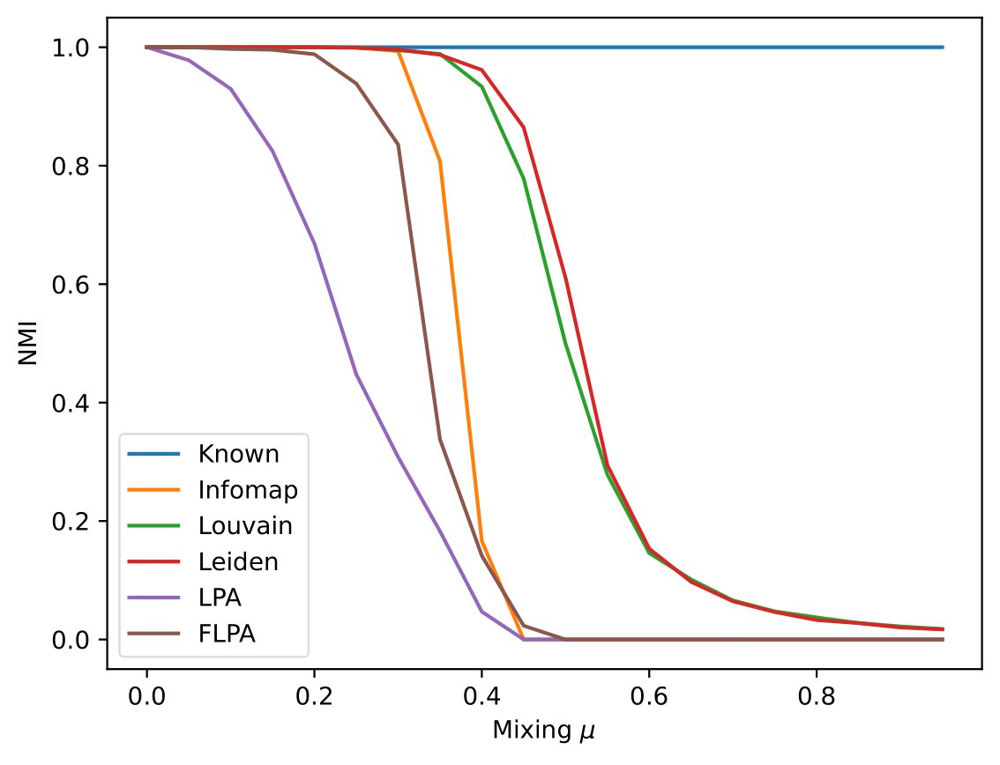

Interestingly, modularity optimization algorithms (*Louvain*, *Leiden*) perform particulary well, as we have relatively few groups and a binomial degree distribution.

### IV. Community detection in Erd&ouml;s-R&eacute;nyi random graphs



1. **(homework)** Apply the algorithm to Erd&ouml;s-R&eacute;nyi random graphs that have no group structure and test whether the algorithm is able to detect this. You should apply the algorithm to random graphs with increasing average degree $\langle k\rangle$ and compare partitions using some simple statistic. For which values of $\langle k\rangle$ does the algorithm reveal the correct partition?

Specifically, we want these algorithms to detect the connected components as individual coummunities.

*NOTE*: if you use *NMI*, there may be division by 0 when both true and detected community structures have a single community.

**SOLUTION REDACTED** (this was Homework 2, Task 4, Subtask *iii* in the year 2022/23)

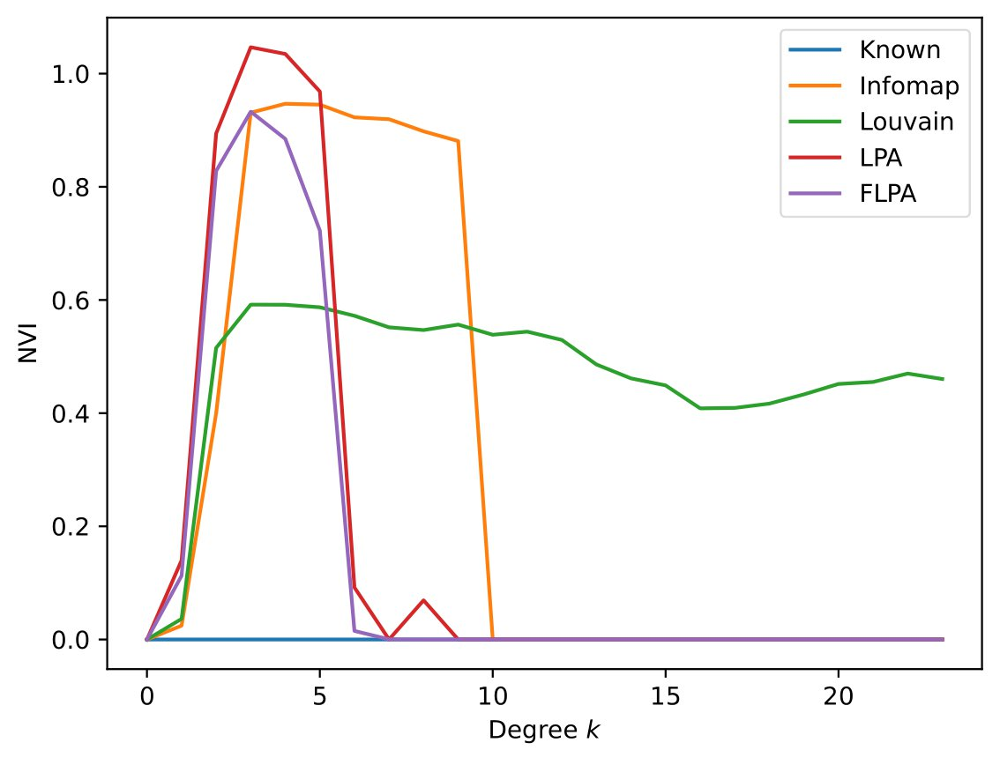

# Lab 8

###### Introduction to Network Analysis 2023/24 (viii)

## Blockmodeling & stochastic block models, $k$-core decomposition

Browse [CDlib](https://cdlib.readthedocs.io/en/latest/), [NetworkX](https://networkx.org/documentation/stable/reference/algorithms/community.html), [graph-tool](https://graph-tool.skewed.de/static/doc/demos/inference/inference.html) or other library for implementations of network community detection and graph partitioning algorithms. Select an algorithm which you will be using in the exercises below. For instance, select one of most popular algorithms such as hierarchical optimization of modularity known as Louvain algorithm, map equation algorithm called Infomap, simple label propagation algorithm, hierarchical clustering based on edge betweenness, Markov clustering algorithm, (degree-corrected) stochastic block model etc.

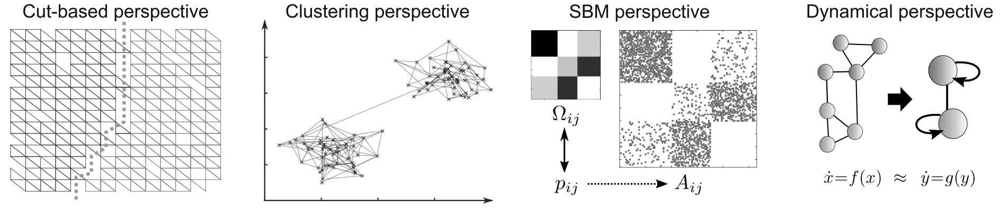

### I. Blockmodeling of small social networks

You are given two small social networks with known sociological partitioning of nodes.

+ Zachary karate club network with 2 groups ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ Davis southern women network with 3 groups ([southern_women.net](http://lovro.fri.uni-lj.si/ina/nets/southern_women.net))



1. **(code)** Apply the (degree-corrected) stochastic block model to small social networks and test whether the revealed clusters coincide with sociological partitioning of these networks. You should apply the algorithm to each network multiple times and compare partitions using some standard measure. Since these networks are very small, you can also print out or visualize the results. What type of structure does the algorithm reveal in these networks?

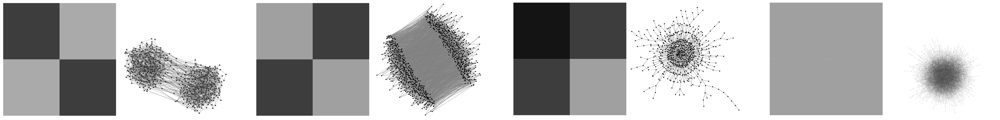

In [ ]:
#$(brew --prefix python@3.10)/bin/python3
import utils

soc_nets = [utils.read_pajek(name) for name in ["karate_club", "southern_women"]]

In [ ]:
from cdlib import algorithms

# see https://cdlib.readthedocs.io/en/latest/reference/cd_algorithms/node_clustering.html
algs = {"Known": lambda G: utils.known_clustering(G), "Louvain": algorithms.louvain,
        "Leiden": algorithms.leiden, "LPA": algorithms.label_propagation, "FLPA": utils.fast_label_propagation,
        "DCSBM": algorithms.sbm_dl # func. etymology: Stochastic Block Model minimizing Description Length
        }

# NOTE: this wasn't properly tested, as cdlib is a nightmare to install.
for G in soc_nets:
  utils.info(G)
  utils.CD_comparison(G, algs, runs = 100)

**NOTE**: below is a copy-pasted log file (formatted by GPT3)

|    Graph    | 'karate_club' |
| :---------: | :-----------: |
|    Nodes    |    34 (0)     |
|    Edges    |    78 (0)     |
|   Degree    |   4.59 (17)   |
|     LCC     |  100.0% (1)   |
|  Clustering |    0.5706     |

<br>

|  Algorithm  | Count |     Q     |    NMI    |    ARI    |    VI     |
| :---------: | :---: | :-------: | :-------: | :-------: | :-------: |
|   'Known'   |   2   |   0.371   |   1.000   |   1.000   |   0.000   |
|  'Louvain'  |   4   |   0.416   |   0.632   |   0.513   |   1.060   |
|  'Leiden'   |   4   |   0.420   |   0.687   |   0.541   |   0.908   |
|    'LPA'    |   3   |   0.325   |   0.445   |   0.473   |   1.299   |
|   'FLPA'    |   3   |   0.346   |   0.689   |   0.681   |   0.657   |
|    'MCL'    |   2   |   0.360   |   0.836   |   0.882   |   0.325   |
|    'EB'     |   2   |   0.360   |   0.836   |   0.882   |   0.325   |
|  'DCSBM'    |   1   |   0.000   |   0.000   |   0.000   |   0.998   |

<br><br>

|    Graph    | 'southern_women' |
| :---------: | :--------------: |
|    Nodes    |      32 (0)      |
|    Edges    |      89 (0)      |
|   Degree    |    5.56 (14)     |
|     LCC     |    100.0% (1)    |
|  Clustering |      0.0000      |

<br>

|  Algorithm  | Count |     Q     |    NMI    |    ARI    |    VI     |
| :---------: | :---: | :-------: | :-------: | :-------: | :-------: |
|   'Known'   |   3   |  -0.376   |   1.000   |   1.000   |   0.000   |
|  'Louvain'  |   3   |   0.325   |   0.308   |   0.178   |   2.137   |
|  'Leiden'   |   3   |   0.334   |   0.261   |   0.132   |   2.293   |
|    'LPA'    |   2   |   0.041   |   0.072   |   0.010   |   1.857   |
|   'FLPA'    |   2   |   0.146   |   0.141   |   0.076   |   1.743   |
|    'MCL'    |   3   |  -0.274   |   0.618   |   0.538   |   1.119   |
|    'EB'     |   2   |   0.306   |   0.328   |   0.217   |   1.708   |
|  'DCSBM'    |   3   |  -0.406   |   0.747   |   0.627   |   0.686   |


As seen in the last row, a SBM-based algorithm can also detect bipartite (dissasortative) community structure.
See also the plots below.

### `karate_club` detected communities

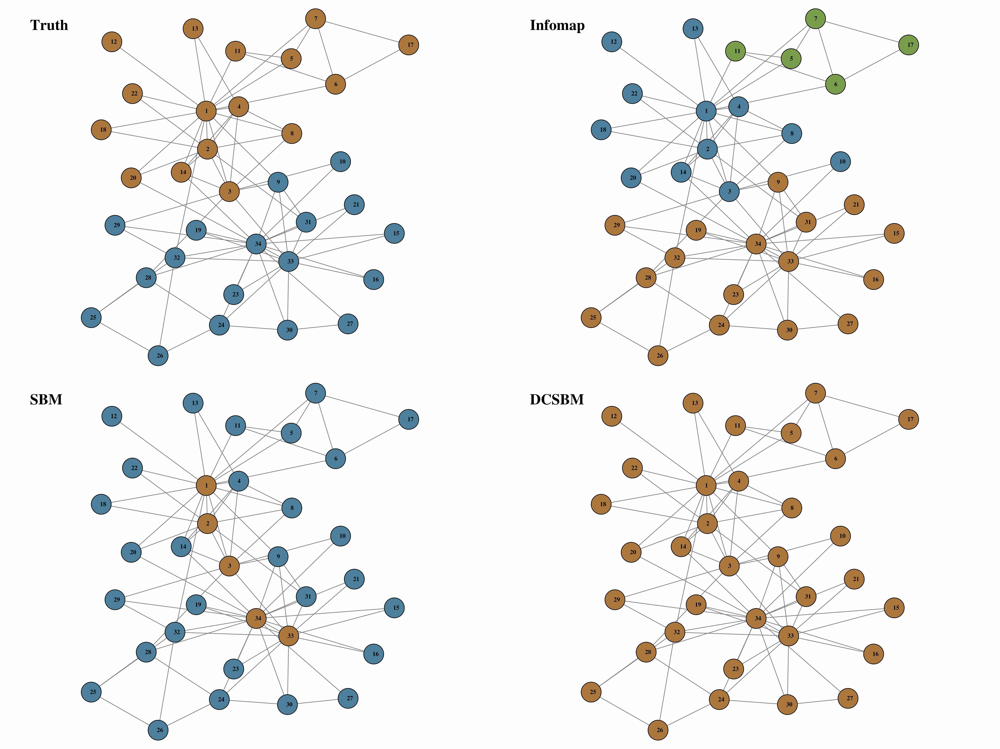

### `southern_women` detected communities

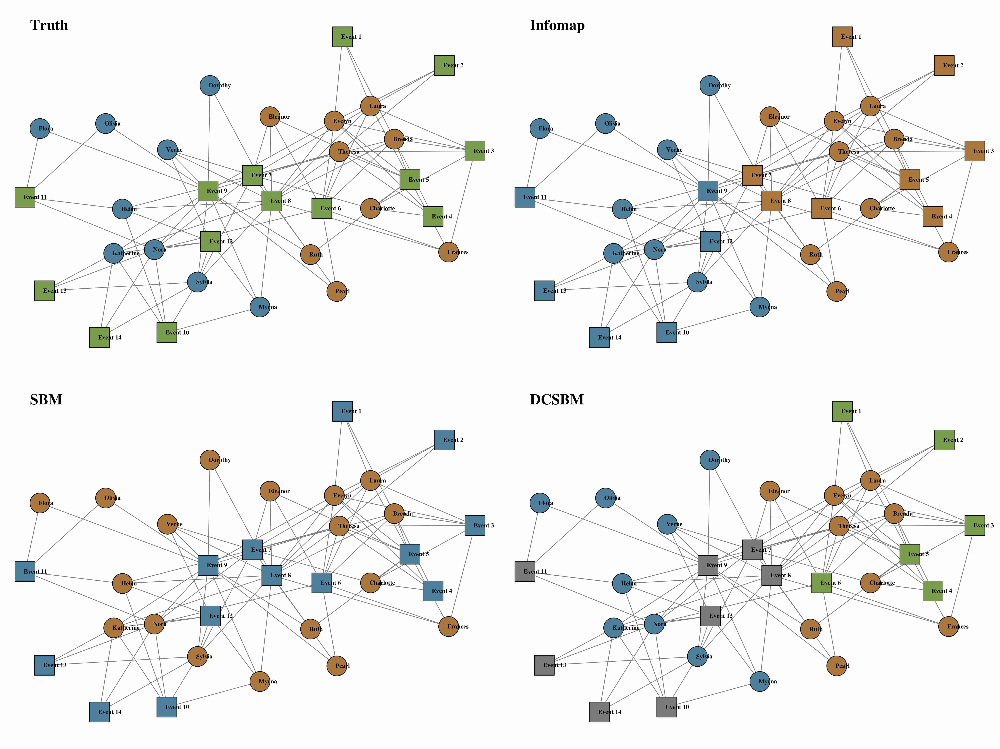

### II. Blockmodeling of Šubelj-Bajec benchmark graphs



1. **(homework)** Apply the (degree-corrected) stochastic block model to Šubelj-Bajec synthetic benchmark graphs with planted assortative and disassortative structure, and test whether the revealed clusters coincide with the planted group structure. You should apply the algorithm to graphs with varying mixing parameter $\mu$ and compare partitions using some standard measure. For which values of $\mu$ does the algorithm reveal the planted partition?

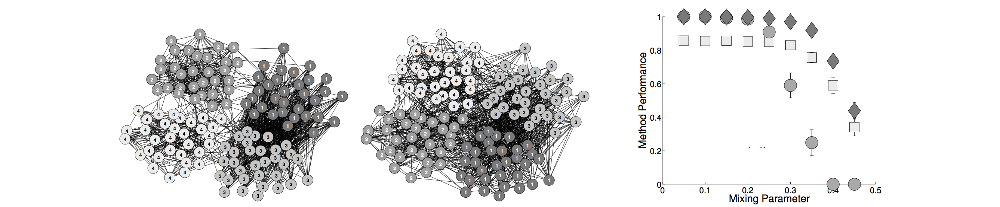

In [ ]:
import random
import numpy as np
import networkx as nx
import utils
from matplotlib import pyplot as plt


def subelj_bajec(mu = 0.1):
  G = nx.MultiGraph(name = "subelj_bajec")
  for i in range(128):
    G.add_node(i, cluster = i // 32 + 1)

  for i in range(128):
    for j in range(i + 1, 128):
      if G.nodes[i]['cluster'] <= 2 and G.nodes[j]['cluster'] <= 2:
        if G.nodes[i]['cluster'] == G.nodes[j]['cluster']:
          if random.random() < 16 * (1 - mu) / 31:
            G.add_edge(i, j)
        else:
          if random.random() < mu / 6:
            G.add_edge(i, j)
      elif G.nodes[i]['cluster'] >= 3 and G.nodes[j]['cluster'] >= 3:
        if G.nodes[i]['cluster'] != G.nodes[j]['cluster']:
          if random.random() < (1 - mu) / 2:
            G.add_edge(i, j)
        else:
          if random.random() < 16 * mu / 95:
            G.add_edge(i, j)
      elif random.random() < mu / 6:
        G.add_edge(i, j)

  return G

utils.info(sbg := subelj_bajec(), clustering_sample=len(sbg))

  MultiGraph | 'subelj_bajec'
       Nodes | 128 (iso=0)
       Edges | 1,041 (loop=0)
      Degree | 16.27 (max=24)
         LCC | 100.0% (n=1)
  Clustering | 0.2330



In [ ]:
from cdlib import algorithms
from tqdm import tqdm

# see https://cdlib.readthedocs.io/en/latest/reference/cd_algorithms/node_clustering.html
algs = {
    "Known": lambda G: utils.known_clustering(G, cluster_attr="cluster"), "Louvain": algorithms.louvain,
    "Leiden": algorithms.leiden, "LPA": algorithms.label_propagation, "FLPA": utils.fast_label_propagation,
    "DCSBM": algorithms.sbm_dl # func. etymology: Stochastic Block Model minimizing Description Length
}

runs = 100
mus = np.arange(0, 1, 0.05)

plt.figure()

# NOTE: this wasn't properly tested, as cdlib is a nightmare to install.
for alg in algs:
    NMI = [0 for _ in range(len(mus))]

    for _ in tqdm(range(runs), desc=f"testing {alg}"):
        for i, mu in enumerate(mus):
            G = subelj_bajec(mu)

            K = utils.known_clustering(G, cluster_attr="cluster")
            C = algs[alg](G)

            NMI[i] += K.normalized_mutual_information(C).score / runs

    plt.plot(mus, NMI, label=alg)

plt.xlabel("Mixing $\mu$")
plt.ylabel("NMI")
plt.legend()

plt.savefig("subelj_bajec.pdf", bbox_inches='tight')


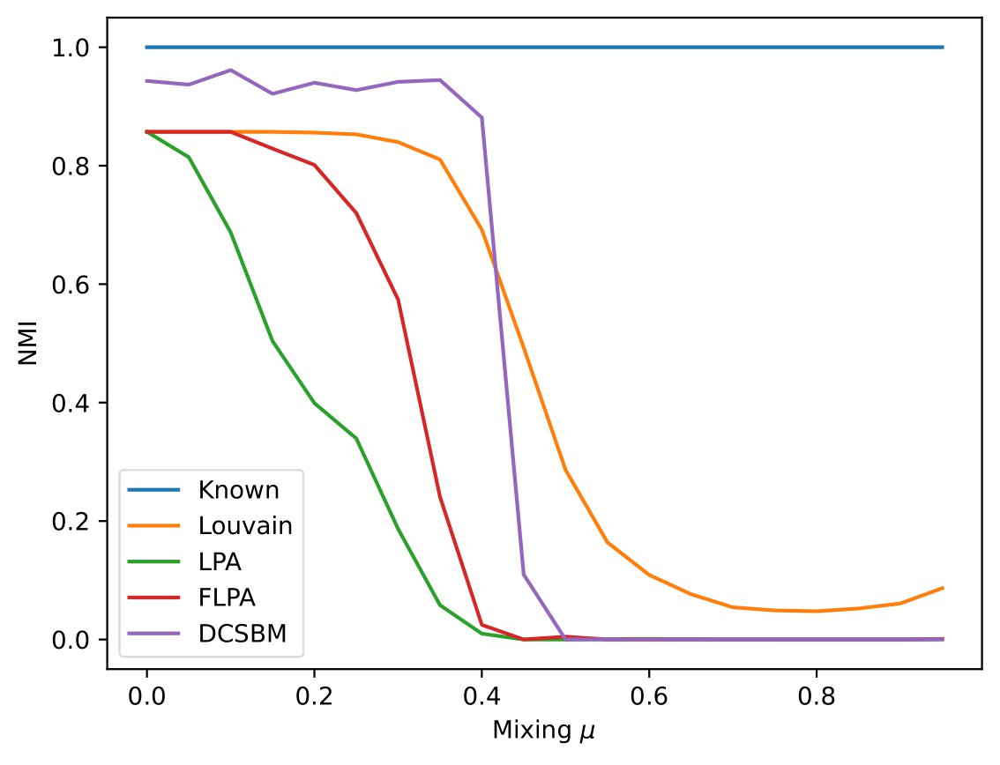

We can see that stochastic block models yield the best results, as we have a sharp dropoff in *NMI* (meaning the algorithm is "sure of itself").

### III. Network $k$-core decomposition

You are given four networks with some metadata associated with each node.

+ Java class dependency network with class names & packages ([cdn_java.net](http://lovro.fri.uni-lj.si/ina/nets/cdn_java.net))
+ JUNG class dependency network with class names & packages ([cdn_jung.net](http://lovro.fri.uni-lj.si/ina/nets/cdn_jung.net))
+ WikiLeaks cable reference network with cable identifiers & embassies ([wikileaks.net](http://lovro.fri.uni-lj.si/ina/nets/wikileaks.net))
+ IMDb actors collaboration network with actor names & surnames ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net))



1. **(discuss)** Consider the following algorithm for computing network $k$-cores for a given $k$. Starting with the original network, iteratively remove nodes with degree less than $k$. When no such node remains, connected components of the resulting network are the $k$-cores.

	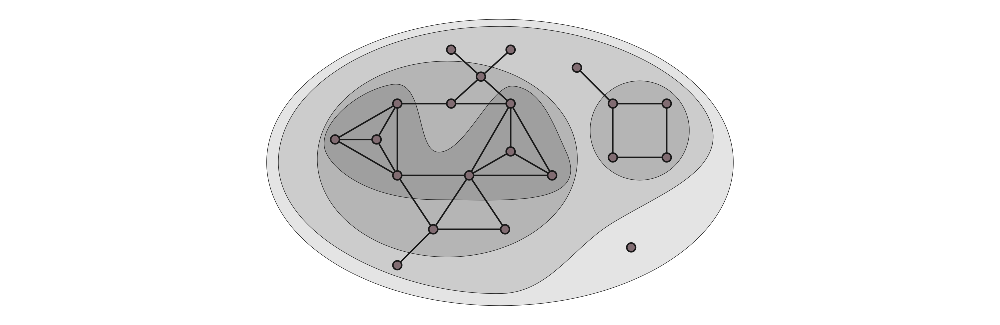



We define **k-core** as a subgraphs of nodes with $\ge k$ neighbors. This means that k-cores will be nested. The algorithms takes this to our advantage and iteratively remove nodes with a degree less than $k$ from the network. This process continues until no nodes remain, so have to take the $k$-cores and $k$ of the second to last iteration as a result.

The complexity of the algorithm depends on the structure of the network. In the worst-case scenario, where the network is a complete graph, the algorithm will check all the nodes each iteration, resulting in a time complexity of $O(n^2)$. However in real world sparse networks, the algorithm performs much better.


Interestingly, linear algorithm exists:
```json
Title: An O(m) algorithm for cores decomposition of networks,  
Author: Batagelj, Vladimir and Zaversnik, Matjaz,  
Journal:arXiv preprint cs/0310049,  
Year: 2003
```

2. **(code)** Implement the algorithm and compute all $k$-cores of the networks. Print out the number and size of $k$-cores for different values of $k$. What is the maximum value of $k$ denoted $k_{max}$ for which there exists at least one $k$-core?



In [ ]:
Gs = [
    nx.Graph(utils.read_pajek(name)) for name in
    ["cdn_java", "cdn_jung", "wikileaks", "collaboration_imdb"]]

In [ ]:
def k_cores(G, k):

    changed = True
    while changed:
        changed = False

        for i in list(G.nodes()):
            if G.degree(i) < k:
                G.remove_node(i)
                changed = True

    conn_comp = nx.connected_components(G)
    return sorted(conn_comp, key=len, reverse=True)


def core_max(G, verbose=False):

    k = 0
    K = nx.MultiGraph(G)

    while K:
        C = k_cores(K, k)

        if len(C) == 0:
            return k-1
        if verbose:
            print("{:>12s} | {:d} ({:s})".format(str(k) + '-core',
                  len(C), ", ".join([str(len(c)) for c in C[:10]])))
        k += 1

    return k

k_maxes = []
for G in Gs:
    k_max = core_max(G)
    print(f"{G.name}: {k_max}")
    k_maxes.append(k_max)


cdn_java: 24
cdn_jung: 6
wikileaks: 11
collaboration_imdb: 144


We obtain following results:
- cdn_java: 24,
- cdn_jung: 6,
- wikileaks: 11,
- collaboration_imdb: 144.

3. **(code)** Print out the labels of nodes in $k_{max}$-cores and discuss the results.

In [ ]:
for idx, G in enumerate(Gs):
    G = copy.deepcopy(G)
    k_max = k_maxes[idx]

    # obtain only k_max cores
    k_core(G, k_max)

    labels = sorted(data["label"] for _, data in G.nodes(data = True))
    print("{:>8s} | {:s}\n".format(str(k_max) + '-core', "; ".join(labels)))

 24-core | java.applet.Applet; java.awt.AWTEvent; java.awt.Button; java.awt.Canvas; java.awt.Checkbox; java.awt.Choice; java.awt.Color; java.awt.Component; java.awt.Container; java.awt.Dialog; java.awt.Dimension; java.awt.Event; java.awt.FileDialog; java.awt.Font; java.awt.FontMetrics; java.awt.Frame; java.awt.Graphics; java.awt.GraphicsConfiguration; java.awt.Image; java.awt.ImageCapabilities; java.awt.Label; java.awt.List; java.awt.MenuComponent; java.awt.Panel; java.awt.Point; java.awt.PopupMenu; java.awt.Rectangle; java.awt.ScrollPane; java.awt.Scrollbar; java.awt.TextArea; java.awt.TextComponent; java.awt.TextField; java.awt.Toolkit; java.awt.Window; java.awt.dnd.DropTarget; java.awt.im.InputContext; java.awt.image.ColorModel; java.awt.image.ImageObserver; java.awt.image.VolatileImage; java.awt.peer.ComponentPeer; java.lang.Class; java.lang.Object; java.lang.String; java.util.Locale

  6-core | jung.algorithms.layout.GraphElementAccessor; jung.algorithms.layout.Layout; jung.visual

We obtain the most intra-connected components:

### Java
Classes, that reuse subcomponents - AWT is a library for creating graphical user interfaces, where Applet for example will have to include certain logic to handle different graphical components and vice versa.
```
java.applet.Applet; java.awt.AWTEvent; java.awt.Button; java.awt.Canvas; java.awt.Checkbox; java.awt.Choice; java.awt.Color; java.awt.Component; java.awt.Container; java.awt.Dialog; java.awt.Dimension; java.awt.Event; java.awt.FileDialog; java.awt.Font; java.awt.FontMetrics; java.awt.Frame; java.awt.Graphics; java.awt.GraphicsConfiguration; java.awt.Image; java.awt.ImageCapabilities; java.awt.Label; java.awt.List; java.awt.MenuComponent; java.awt.Panel; java.awt.Point; java.awt.PopupMenu; java.awt.Rectangle; java.awt.ScrollPane; java.awt.Scrollbar; java.awt.TextArea; java.awt.TextComponent; java.awt.TextField; java.awt.Toolkit; java.awt.Window; java.awt.dnd.DropTarget; java.awt.im.InputContext; java.awt.image.ColorModel; java.awt.image.ImageObserver; java.awt.image.VolatileImage; java.awt.peer.ComponentPeer; java.lang.Class; java.lang.Object; java.lang.String; java.util.Locale

```

### JUNG
Similar interpretation as above.
```
jung.algorithms.layout.GraphElementAccessor; jung.algorithms.layout.Layout; jung.visualization.BasicVisualizationServer; jung.visualization.RenderContext; jung.visualization.VisualizationImageServer; jung.visualization.VisualizationModel; jung.visualization.VisualizationServer; jung.visualization.VisualizationViewer; jung.visualization.control.SatelliteVisualizationViewer; jung.visualization.picking.PickedState; jung.visualization.renderers.Renderer
```

### WikiLeaks
Colection of cables connected to U.S. embassies in New Delhi, India and Colombo, Sri Lanka. They talk about wide range of topics, such as elections, ... For more information, these cables can be found and read [online](https://wikileaks.org/).
```
08NEWDELHI1799; 08NEWDELHI2109; 08NEWDELHI2146; 08NEWDELHI2223; 08NEWDELHI2265; 08NEWDELHI2289; 08NEWDELHI2378; 08NEWDELHI2742; 08NEWDELHI2746; 08NEWDELHI2946; 08NEWDELHI2987; 08NEWDELHI3030; 08NEWDELHI3185; 09COLOMBO1139; 09COLOMBO1145; 09COLOMBO1152; 10COLOMBO11; 10COLOMBO21; 10COLOMBO27; 10COLOMBO40; 10COLOMBO57; 10COLOMBO59; 10COLOMBO61; 10COLOMBO62; 10COLOMBO65; 10COLOMBO7; 10COLOMBO78
```
### IMDB
The similarity between all the names is that they are all associated with the professional wrestling industry. The reason why they are in the highest $k$-core is straightforward: since they have fights between themselves they will be very well connected.
```
Adams, Brian (VI); Aguilera, Aaron; Alfonso, Michael; Anderson, Arn; Angle, Kurt; Anoai, Solofatu; Austin, Steve (IV); Bass, Nicole; Batista, Dave; Benjamin, Shelton; Benoit, Chris (I); Bischoff, Eric; Blackman, Steve (I); Bloom, Matt (I); Brisco, Gerald; Bucci, Michael; Buchanan, Barry (II); Calaway, Mark; Carter, Stacy; Chimel, Tony; Chioda, Mike; Clarke, Bryan; Clemont, Pierre; Coachman, Jonathan; Cole, Michael (V); Connor, A.C.; Constantino, Rico; Conway, Rob; Copeland, Adam (I); Daniels, Christopher (I); DeMott, William; Dinsmore, Nick; Doan, Jack; Dumas, Amy; Dupree, Rene (II); Durham, Michael; Fifita, Uliuli; Finkel, Howard; Flair, Ric; Foley, Mick; Frazier Jr., Nelson; Funaki, Sho; Garc�a, Lili�n; Gayda, Jackie; Gerin, Terry; Goldberg, Bill (I); Greenwald, Nora; Grenier, Sylvain; Gruner, Peter; Guenard, Nidia; Guerrero Jr., Chavo; Guerrero, Eddie; Gunn, Billy (II); Guttierrez, Oscar; Hall, Scott (I); Hardy, Jeff (I); Hardy, Matt; Harris, Don (VII); Harris, Ron (IV); Hart, Owen; Heath, David (I); Hebner, Brian; Hebner, Earl; Heffron, Brian (II); Hegstrand, Michael; Heidenreich, Jon; Helms, Shane; Hennig, Curt; Henry, Mark (I); Heyman, Paul; Hickenbottom, Michael; Hogan, Hulk; Howard, Robert William; Huffman, Booker; Huffman, Maven; Hugger, John; Hughes, Devon; Hyson, Matt; Jacobs, Glen; James, Brian (II); Jarrett, Jeff (I); Jericho, Chris; Jindrak, Mark; Kanyon, Chris; Keibler, Stacy; Killings, Ron; Knight, Dennis (II); Korderas, Jimmy; Laughlin, Tom (IV); Laurer, Joanie; Laurinaitis, Joe; Lawler, Brian (II); Lawler, Jerry; Layfield, John; Lesnar, Brock; Levesque, Paul Michael; Levy, Scott (III); LoMonaco, Mark; Lockwood, Michael; Long, Teddy; Lynn, Jerry; Malenko, Dean; Manna, Michael; Martin, Andrew (II); Matthews, Darren (II); McMahon, Linda; McMahon, Shane; McMahon, Stephanie; McMahon, Vince; McMichael, Debra; Mero, Marc; Mero, Rena; Moody, William (I); Moore, Carlene (II); Moore, Jacqueline (VI); Moretti, Lisa; Morley, Sean; Nash, Kevin (I); O&apos;Haire, Sean; Orton, Randy; Page, Dallas; Palumbo, Chuck (I); Patrick, Nick (II); Petty, Ted; Piper, Roddy; Plotcheck, Michael; Poch, Terri; Reso, Jason; Robinson, Charles (IV); Rock, The; Ross, Jim (III); Runnels, Dustin; Runnels, Terri; Ruth, Glen; Saturn, Perry; Scaggs, Charles; Seitz, Michael; Seldano, Jose; Senerca, Pete; Shamrock, Ken; Simmons, Ron (I); Smith, Davey Boy; Snow, Al; Stipich, Sean; Storm, Lance; Stratus, Trish; Tajiri, Yoshihiro; Taylor, Scott (IX); Traylor, Raymond; Vachon, Angelle; Van Dam, Rob; Varon, Lisa Marie; Walker, P.J.; Waltman, Sean; Warrington, Chaz; White, Leon; White, Tim (V); Wight, Paul; Wilson, Torrie; Wright, Charles (II); Yang, Jimmy (I); Yoshida, Takao
```

# Lab 10

###### Introduction to Network Analysis 2023/24 (x)

## Node mixing by (not) degree, graphlet degrees

In [ ]:
import networkx as nx
import math
from scipy import stats
import utils

### I. Degree assortative and disassortative networks

Consider the following eight networks of different type and origin.

+ Zachary karate club network ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ Java class dependency network ([java.net](http://lovro.fri.uni-lj.si/ina/nets/java.net))
+ Map of Darknet from Tor network ([darknet.net](http://lovro.fri.uni-lj.si/ina/nets/darknet.net))
+ Social network of unknown origin ([social.net](http://lovro.fri.uni-lj.si/ina/nets/social.net))
+ iMDB actors collaboration network ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net))
+ Gnutella peer-to-peer sharing network ([gnutella.net](http://lovro.fri.uni-lj.si/ina/nets/gnutella.net))
+ Sample of Facebook social network ([facebook.net](http://lovro.fri.uni-lj.si/ina/nets/facebook.net))
+ *nec* overlay map of the Internet ([nec.net](http://lovro.fri.uni-lj.si/ina/nets/nec.net))



Node mixing measures how likely nodes with certain characteristics or attributes are connected to each other. These attributes can be the gender or age of individuals, degree centrality of nodes or other. In the labs we will focus on node mixing by degree, where we distinguish between:

- Assortative mixing, where nodes are more likely to connect with nodes that have similar attributes. In terms of degrees, nodes with similar degree should connect to one another.
- Disassortative mixing, where nodes are more likely to be connected to the nodes with different attributes. In terms of degrees, nodes with small degree will connect to hubs.

Node mixing is often measured using correlation coefficients, such as Pearson's correlation coefficient. These coefficients quantify the strength and direction of the correlation between node attributes.

**NOTE**: When calculating Pearson coefficient, we add both node degrees of a link to degree array, so our calculation will be independent of how the links are stored.

1. **(code)** Implement Newman's node degree mixing coefficient $r$ as a sample Pearson correlation coefficient between the linked nodes' degrees $k$ and $k'$.

	$$r(k,k')=\frac{\sum_i(k_i-\langle k\rangle)(k'_i-\langle k'\rangle)}{\sigma_k\sigma_{k'}}$$

	Treat all networks as undirected graphs and compute their undirected degree mixing coefficient $r$. Are the networks assortative $r>0$, disassortative $r<0$ or neutral $r\approx 0$?



In [ ]:
Gs = []
for name in ["karate_club", "java", "darknet", "social", "collaboration_imdb", "gnutella", "facebook", "nec"]:
  G = utils.read_pajek(name)
  print(G)
  Gs.append(G)


MultiGraph named 'karate_club' with 34 nodes and 78 edges
MultiDiGraph named 'java' with 2378 nodes and 14727 edges
MultiGraph named 'darknet' with 7178 nodes and 25104 edges
MultiGraph named 'social' with 10680 nodes and 24316 edges
MultiGraph named 'collaboration_imdb' with 17577 nodes and 287074 edges
MultiDiGraph named 'gnutella' with 62586 nodes and 147892 edges
MultiGraph named 'facebook' with 63731 nodes and 817035 edges
MultiDiGraph named 'nec' with 75885 nodes and 357317 edges


In [ ]:
def degree_mixing(G, source = None, target = None):
  x, y = [], []

  for i, j in G.edges():
    if source != None and target != None:
      x.append(G.out_degree(i) if source == 'out' else G.in_degree(i))
      y.append(G.in_degree(j) if target == 'in' else G.out_degree(j))
    else:
      x.append(G.degree(i))
      y.append(G.degree(j))
      x.append(G.degree(j))
      y.append(G.degree(i))

  return stats.pearsonr(x, y)[0]

print("{:>21s} | {:^7s}".format('Graph', 'r'))

for G in Gs:
  r = degree_mixing(G)
  print("{:>21s} | {:^7.3f}".format("'" + G.name + "'", r))
print()

| Graph                | r      |
| -------------------- | ------ |
| 'karate_club'        | -0.476 |
| 'java'               | -0.307 |
| 'darknet'            | -0.440 |
| 'social'             | 0.238  |
| 'collaboration_imdb' | 0.293  |
| 'gnutella'           | -0.093 |
| 'facebook'           | 0.177  |
| 'nec'                | -0.146 |


Rule of thumb is that social networks are degree assortative while technological networks (such as railway, roadway, ...) are degree neutral. Other networks are generally degree disassortative. Looking at Pearson coefficients, we can only see degree disassortative and assortative networks, which do follow our rule of thumb:
- Facebook, social and collaboration_imdb are assortative
- other non-social networks are degree disassortative

2. **(code)** Generate corresponding Erd&ouml;s-R&eacute;nyi random graphs and compute their undirected degree mixing coefficient $r$. Are random graphs assortative $r>0$, disassortative $r<0$ or neutral $r\approx 0$?



In [ ]:
for G in Gs:
  n = G.number_of_nodes()
  m = G.number_of_edges()
  k = 2 * m / n
  p = k/(n-1)

  ER_G = nx.erdos_renyi_graph(n,p)
  r = nx.degree_assortativity_coefficient(ER_G)

  print("{:>21s} | {:^7.3f}".format("'" + ER_G.name + "'", r))
print()

| Graph                | r      |
| -------------------- | ------ |
| 'karate_club'        | -0.039 |
| 'java'               | -0.005 |
| 'darknet'            | -0.009 |
| 'social'             | 0.003  |
| 'collaboration_imdb' | -0.001 |
| 'gnutella'           | -0.001 |
| 'facebook'           | -0.002 |
| 'nec'                | 0.002  |

ER random graph mixing coefficient is neutral, which is to be expected, since edges will be uniformly randomly distributed, therefore nodes in the network will have similar degree.

3. **(code)** For directed networks, compute all four directed degree mixing coefficients $r_{(in,in)}$, $r_{(in,out)}$, $r_{(out,in)}$ and $r_{(out,out)}$. Are the networks assortative $r_{\cdot}>0$, disassortative $r_{\cdot}<0$ or neutral $r_{\cdot}\approx 0$?

In [ ]:
print("{:>21s} | {:^7s} {:^7s} {:^7s} {:^7s} {:^7s}".format('Graph', 'r', 'r(ii)', 'r(io)', 'r(oi)', 'r(oo)'))

for G in Gs:
  r = degree_mixing(G)
  # r = nx.degree_assortativity_coefficient(G)

  rii = math.nan
  if isinstance(G, nx.DiGraph):
    rii = degree_mixing(G, 'in', 'in')

  rio = math.nan
  if isinstance(G, nx.DiGraph):
    rio = degree_mixing(G, 'in', 'out')

  roi = math.nan
  if isinstance(G, nx.DiGraph):
    roi = degree_mixing(G, 'out', 'in')

  roo = math.nan
  if isinstance(G, nx.DiGraph):
    roo = degree_mixing(G, 'out', 'out')

  print("{:>21s} | {:^7.3f} {:^7.3f} {:^7.3f} {:^7.3f} {:^7.3f}".format("'" + G.name + "'", r, rii, rio, roi, roo))
print()

| Graph                | r      | r(ii)  | r(io)  | r(oi)  | r(oo)  |
| -------------------- | ------ | ------ | ------ | ------ | ------ |
| 'karate_club'        | -0.476 | nan    | nan    | nan    | nan    |
| 'java'               | -0.307 | -0.027 | -0.017 | -0.321 | 0.065  |
| 'darknet'            | -0.440 | nan    | nan    | nan    | nan    |
| 'social'             | 0.238  | nan    | nan    | nan    | nan    |
| 'collaboration_imdb' | 0.293  | nan    | nan    | nan    | nan    |
| 'gnutella'           | -0.093 | 0.035  | 0.008  | -0.006 | -0.003 |
| 'facebook'           | 0.177  | nan    | nan    | nan    | nan    |
| 'nec'                | -0.146 | -0.072 | -0.009 | -0.102 | -0.012 |

Looking at Pearson coefficients of undirected networks, we see only degree disassortative and assortative networks. When taking into account their in and out degrees the results are different. In the java network, most of the disassortativness comes from out-degree to in-degree Pearson coefficient, which means that classes with a lot of classes use ones, that are rarely used and the other way around.

###### Introduction to Network Analysis 2023/24 (x)

## Node mixing by (not) degree, graphlet degrees

In [ ]:
import networkx as nx
from scipy import stats
import utils

In [ ]:
def degree_mixing(G, source = None, target = None):
  x, y = [], []

  for i, j in G.edges():
    if source != None and target != None:
      x.append(G.out_degree(i) if source == 'out' else G.in_degree(i))
      y.append(G.in_degree(j) if target == 'in' else G.out_degree(j))
    else:
      x.append(G.degree(i))
      y.append(G.degree(j))
      x.append(G.degree(j))
      y.append(G.degree(i))

  return stats.pearsonr(x, y)[0]

Gs = []
for name in ["karate_club", "java", "darknet", "social", "collaboration_imdb", "gnutella", "facebook", "nec"]:
  G = nx.read_pajek(f"../networks/{name}.net")
  G = nx.convert_node_labels_to_integers(G)
  G.name = name
  Gs.append(G)


### II. Structurally disassortative networks by degree



1. **(discuss)** Consider network randomization by degree-preserving link rewiring. What is the expected undirected degree mixing coefficient $r'$ after rewiring if you allow for multiple links between the nodes? What about if you restrict the process to generate only simple graphs?

	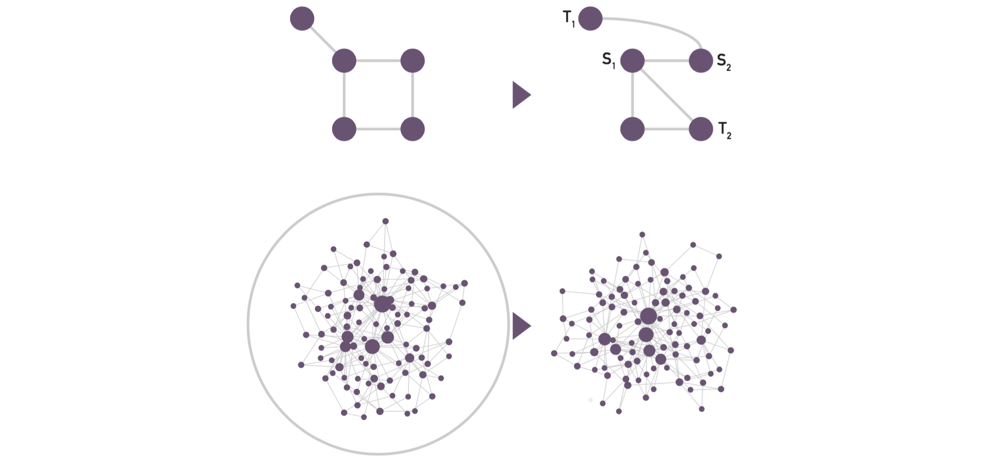



Let's look at an arbitrary network. If we have a multi graph, the edges after rewiring will be distributed more uniformly between all the nodes and we expect the network to be neutral. If we only allow for a simple network, the results should be similar. But are they really? Think about the disassortative network like the one with degree sequence of $[4, 1, 1, 1, 1]$.

2. **(code)** Apply link rewiring restricted to simple graph to degree disassortative networks and compute their degree mixing coefficient $r'$ after rewiring. Are the networks *truly* degree disassortative $r'\approx 0$ or only structurally disassortative $r'<0$?

In [ ]:
import random

def to_hash(i, j):
  if i <= j:
    i, j = j, i
  return i * (i - 1) // 2 + j

def rewired_graph(G, swaps = 100):
  H = set()
  edges = []
  for edge in G.edges():
    i, j = edge
    h = to_hash(i, j)
    if h not in H:
      edges.append([i, j])
      H.add(h)

  for _ in range(swaps):
    eij = random.randint(0, len(edges) - 1)
    euv = random.randint(0, len(edges) - 1)
    if eij != euv:
      i, j = edges[eij]
      u, v = edges[euv]

      if random.random() < 0.5:
        if i != v and u != j:
          hiv = to_hash(i, v)
          huj = to_hash(u, j)
          if hiv not in H and huj not in H:
            edges[eij][1] = v
            edges[euv][1] = j
            H.remove(to_hash(i, j))
            H.remove(to_hash(u, v))
            H.add(hiv)
            H.add(huj)
      else:
        if i != u and j != v:
          hiu = to_hash(i, u)
          hjv = to_hash(j, v)
          if hiu not in H and hjv not in H:
            edges[eij][1] = u
            edges[euv][0] = j
            H.remove(to_hash(i, j))
            H.remove(to_hash(u, v))
            H.add(hiu)
            H.add(hjv)

  G = nx.empty_graph(len(G))
  G.add_edges_from(edges)

  return G

print("{:>21s} | {:^7s} {:^7s}".format('Graph', 'r', 'r\''))

for G in Gs:
  n = G.number_of_nodes()
  m = G.number_of_edges()

  r = degree_mixing(G)

  R = rewired_graph(G, 10 * m)
  # R = nx.Graph(G)
  # for _ in range(10 * m):
  #   nx.double_edge_swap(R)
  rp = degree_mixing(R)

  print("{:>21s} | {:^7.3f} {:^7.3f}".format("'" + G.name + "'", r, rp))
print()

As hinted above, some network structures can show disassortativity, which is not representative of any underlying assortative or disassortative mixing.
Simple network with degrees of $[4, 1, 1, 1, 1]$ will be forced to connect the hub to low degree nodes, which will make it inherently disassortative. We call this structural disassortativity. To determine it, the network can be compared with a degree-preserving randomized simple version of itself. If the network remains degree disassortative, we can conclude that the network is indeed structurally disassortative. Otherwise, if the network will become neutral, we talk about *true* disassortitivity. To get more in depth information about when this happens consult lecture slides, [Wikipedia](https://en.wikipedia.org/wiki/Structural_cut-off), ...


| Graph                | r       | r'       |
| -------------------- | ------- | -------- |
|               'java' | -0.307  |  -0.309  |
|            'darknet' | -0.440  |  -0.443  |
|             'social' |  0.238  |  -0.012  |
| 'collaboration_imdb' |  0.293  |  -0.018  |
|           'gnutella' | -0.093  |   0.003  |
|           'facebook' |  0.177  |  -0.006  |
|                'nec' | -0.146  |  -0.143  |


We can spot true disasoritivity on network gnutella, which becomes neutral after link rewiring. Contary, the networks stays disassoratitive in example of java, darknet and nec, which indicates structural disassortitivity.

**NOTE**: If value after the rewiring is lower than the original but not quite neutral, it tells us the *extent* to which the network is structurally disassortative.

### III. Node mixing by _not_ degree



In [ ]:
import networkx as nx
import utils

1. **(homework)** Study node mixing in networks by some property _other_ than node degree $k$. This can be either some structural property of nodes (e.g., node clustering coefficient $C$ or $C^\mu$) or external information associated with each node (e.g., sociological partitioning of nodes in social network or traffic loads in highway networks).

In [ ]:
def fvalue_parser(label, value):
	mdata = {"label": label}
	if value is not None and len(value.strip()) > 0:
		mdata["value"] = float(value)
	else:
		mdata["value"] = 0

	return mdata

In [ ]:
print("{:>21s} | {:^7s} {:^7s}".format('Graph', 'r(d)', 'r(n)'))

for name in ["karate_club", "southern_women", "cdn_java", "cdn_jung", "wikileaks", "highways"]:
    G = utils.read_pajek(name, label_parser=fvalue_parser)
    rd = nx.attribute_assortativity_coefficient(G, 'value')
    rn = nx.numeric_assortativity_coefficient(G, 'value')

    print("{:>21s} | {:^7.3f} {:^7.3f}".format("'" + G.name + "'", rd, rn))
print()


                Graph |  r(d)    r(n)  
        'karate_club' |  0.743   0.743 
     'southern_women' | -0.603  -0.829 
           'cdn_java' |  0.272   0.570 
           'cdn_jung' |  0.456   0.567 
          'wikileaks' |  0.834   0.764 
           'highways' |  0.112   0.600 



In example above we are testing out the asortitivity/disassortitivity of the value attribute of our nodes. In example of karate_club, each node has label of 1 or 2, depending on which karate club people started attending after the original club split. In this way we will determinate how likely the trainees from club 1 are connected to people from club 1 or 2 and vice versa.

|    Graph        |  r(d)   |   r(n)   |
| ----------------| ------- | -------- |
|'karate_club'    |  0.743   |  0.743  |
|'southern_women' | -0.603   | -0.829  |
|'cdn_java'       |  0.272   |  0.570  |
|'cdn_jung'       |  0.456   |  0.567  |
|'wikileaks'      |  0.834   |  0.764  |
|'highways'       |  0.112   |  0.600  |

### IV. Graphlet degree distributions

You are given five networks in Pajek format.

+ Java class dependency network ([java.net](http://lovro.fri.uni-lj.si/ina/nets/java.net))
+ iMDB actors collaboration network ([collaboration_imdb.net](http://lovro.fri.uni-lj.si/ina/nets/collaboration_imdb.net))
+ Gnutella peer-to-peer sharing network ([gnutella.net](http://lovro.fri.uni-lj.si/ina/nets/gnutella.net))
+ Sample of Facebook social network ([facebook.net](http://lovro.fri.uni-lj.si/ina/nets/facebook.net))
+ *nec* overlay map of the Internet ([nec.net](http://lovro.fri.uni-lj.si/ina/nets/nec.net))



1. **(discuss)** Consider the [orca](https://github.com/thocevar/orca) algorithm by Hočevar and Demšar for computing graphlet orbit degrees $k^i$ for graphlets with up to $4$ nodes, $i\in\{0,\dots,14\}$.

	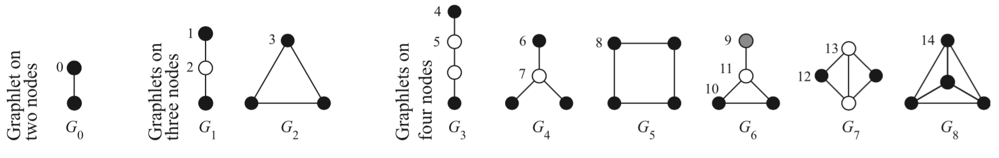



The algorithm uses dependence between orbit counts to save computation time. For 4-node graphlets, they wrote down 10 equations (see *Appendix A* of the [paper](https://academic.oup.com/bioinformatics/article/30/4/559/205331)). Since there are 11 4-graphlets, one count has to be computed by "brute force" - the 4-clique is a good choice, since there are efficient algorithms to count them.

For details, see their paper [*A combinatorial approach to graphlet counting*](https://academic.oup.com/bioinformatics/article/30/4/559/205331).

2. **(homework)** Compute the graphlet orbit degrees $k^i$ and plot the graphlet degree distributions $p_k^i$. How are the graphlet orbit degrees $k^i$ distributed in different networks?

In [ ]:
import utils

nets = [utils.read_pajek(name) for name in ["java", "collaboration_imdb", "gnutella", "facebook", "nec"]]

In [ ]:
import os
import matplotlib.pyplot as plt


def plot(G, orbits):
    fig, axes = plt.subplots(3, 5)
    fig.suptitle(G.name)

    for o in range(15):
        nk = {}
        for i in range(len(G)):
            k = orbits[i][o]
            if k not in nk:
                nk[k] = 0
            nk[k] += 1
        ks = sorted(nk.keys())

        axes[o // 5, o % 5].loglog(ks, [nk[k] / len(G)
                                   for k in ks], 'ok', markersize=1)
        axes[o // 5, o % 5].set_xticks([])
        axes[o // 5, o % 5].set_yticks([])

    plt.savefig(G.name + ".png", bbox_inches='tight')
    plt.close()


def orca(G, exe_folder=".", output_folder="."):
    if "orca" not in os.listdir(exe_folder):
        raise Exception(exe_folder + " doesn't contain orca")

    with open(G.name + ".in", 'w') as file:
        file.write(str(G.number_of_nodes()) + " " +
                   str(G.number_of_edges()) + "\n")

        for i, j in G.edges():
            file.write(str(i) + " " + str(j) + "\n")

    command = f"{os.path.join(exe_folder, 'orca')} node 4 {G.name}.in {output_folder}/{G.name}.orca"
    if (rv := os.system(command)) != 0:
        print(f"WARNING: orca call exited with value {rv}")

    os.remove(G.name + ".in")

    orbits = []
    with open(f"{output_folder}/{G.name}.orca", 'r') as file:
        for line in file:
            orbits.append([int(k) for k in line.split()])

    return orbits


ORCA_EXE_FOLDER = ""

if ORCA_EXE_FOLDER == "":
    raise Exception("please set ORCA_EXE_FOLDER")

for G in nets:
    utils.info(G)
    # NOTE: not tested on Windows
    orbits = orca(G, exe_folder=ORCA_EXE_FOLDER)
    plot(G, orbits)

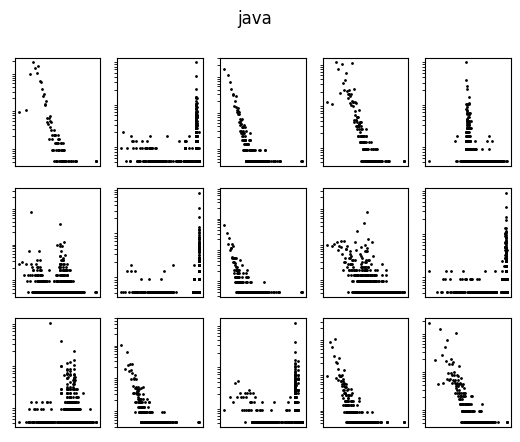
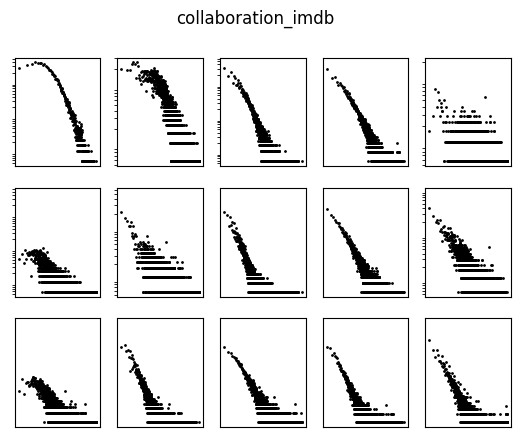
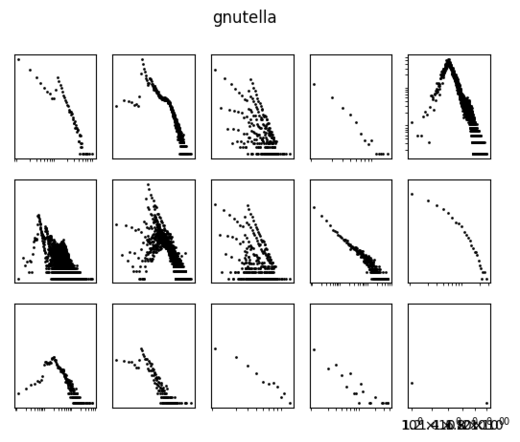
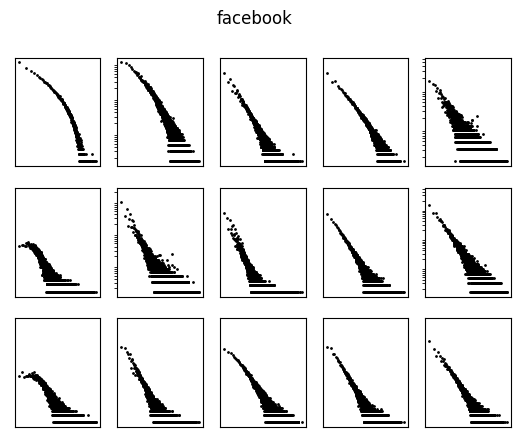
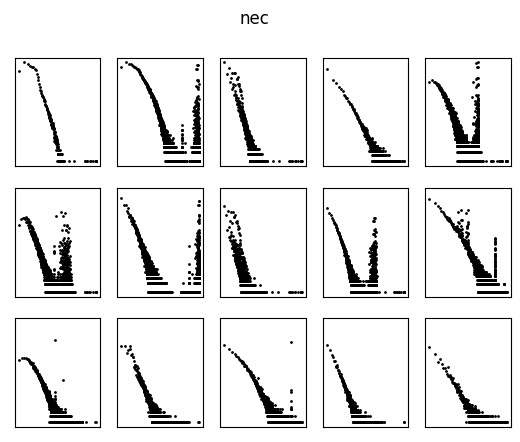

On a few of the P2P `gnutella` network plots, we can see 2 distinct slopes, perhaps corresponding to 2 classes of users (seeders and leechers).

Some of the `nec` plots have an odd cutoff, which may be due to a technological constraint of network devices.

# Lab 12

###### Introduction to Network Analysis 2023/24 (xii)

## Random-walk sampling, network comparison

### I. Estimation by random-walk sampling

You are given five networks in Pajek format.

+ Java class dependency network ([java.net](http://lovro.fri.uni-lj.si/ina/nets/java.net))
+ *nec* overlay map of the Internet ([nec.net](http://lovro.fri.uni-lj.si/ina/nets/nec.net))
+ Sample of Facebook social network ([facebook.net](http://lovro.fri.uni-lj.si/ina/nets/facebook.net))
+ Enron e-mail communication network ([enron.net](http://lovro.fri.uni-lj.si/ina/nets/enron.net))
+ A small part of Google web graph ([www_google.net](http://lovro.fri.uni-lj.si/ina/nets/www_google.net))



1. **(code)** Represent the networks with simple undirected graphs and reduce them to their largest connected component.



In [ ]:
from tqdm import tqdm
import networkx as nx
import utils


NET_NAMES = "cdn_java nec facebook enron www_google".split()

def LCC(G: nx.Graph) -> nx.Graph:
    lcc = max(nx.connected_components(G), key=len)
    return nx.convert_node_labels_to_integers(G.subgraph(lcc))

graphs = {name: LCC(nx.Graph(utils.read_pajek(name)))
          for name in tqdm(NET_NAMES, desc="reading networks")}

reading networks: 100%|██████████| 5/5 [01:25<00:00, 17.12s/it]


2. **(code)** Implement a random-walk sampling and apply it to the networks until you sample 15% of the nodes (with repetitions). Let $s$ be the number of sampled nodes and $k_1,\dots,k_s$ their degree sequence. Estimate the average degree of the network $\langle k\rangle$ using a biased average $$\frac{\sum_ik_i}{s}$$ and also the corrected estimate $$\frac{s}{\sum_ik_i^{-1}}.$$



In [ ]:
import random
from typing import Tuple

def sample_degree_avg(G: nx.Graph, node_percent=15) -> Tuple[float, float]:
    """returns tuple (biased avg., corrected avg.)"""
    assert 0 <= node_percent <= 100

    # random sampling optimization
    # (so we don't need to convert neighborhood generator to list every time)
    adj_list = [list(G[i]) for i in G.nodes]

    s = round(len(G) * node_percent / 100)

    walker = random.randint(0, len(G) - 1)
    visited = {walker}
    degree_sum = G.degree(walker)
    reciprocal_degree_sum = 1 / G.degree(walker)

    while len(visited) < s:
        walker = random.choice(adj_list[walker])
        degree_sum += G.degree(walker)
        reciprocal_degree_sum += 1 / G.degree(walker)
        visited.add(walker)

    return (degree_sum/s, s/reciprocal_degree_sum)


# TODO: for better results get the 15% from *several* runs
#       (eg. run from 5 starting points until you have disjoint 3% samples)

for name, G in graphs.items():
    biased, corrected = sample_degree_avg(G)
    print(f"{name:<15}{biased:.3f}\t\t{corrected:.3f}")

| net   | $\langle k\rangle$   | biased  | corrected | k<sub>max</sub> |
|-------|---------|---------|------|-----------------|
| java  | 12.3    | 521.2   | 11.8 | 2166            |
| nec   | 9.42    | 1243.1  | 9.1  | 13346           |
| fb    | 25.77   | 89.6    | 28.1 | 1098            |
| enron | 7.05    | 169.0   | 7.7  | 1728            |
| www   | 10.03   | 165.9   | 9.6  | 6332            |


3. **(discuss)** Compare both estimates to the true average degree $\langle k\rangle$.

Random walks are biased toward high degree nodes, so they are much more likely to appear in a sample.
That's why the biased $\langle k\rangle$ estimate is much too high, especially for networks with very large hubs.

### II. Sampling Facebook social network

You are given two large samples of Facebook social network with around ten million of nodes and links. Due to their size, the networks are available only in compressed edge list format.

+ 1st sample of Facebook network ([facebook_1.adj.zip](http://lovro.fri.uni-lj.si/ina/nets/facebook_1.adj.zip))
+ 2nd sample of Facebook network ([facebook_2.adj.zip](http://lovro.fri.uni-lj.si/ina/nets/facebook_2.adj.zip))



1. **(discuss)** The samples were generated by a uniform random node selection technique called _rejection sampling_ and by the breadth-first search approach called _snowball sampling_.



The first techinque is a repeated webcrawl from a random user ID traversing friendships (invalid IDs are *rejected*, hence *rejection sampling*).

Snowball sampling is a simple BFS, but ideally done from *several* starting points to get a good representative sample. In a network of this size, a single-source BFS would take up too much space before reaching a decent proportion of nodes anyway. Note that we can get a **disconnected** sample, even if the underlying network is connected.

2. **(homework)** Try to figure out which network sample is which. Since these are still very tiny samples of Facebook social network, the answer might not be immediately obvious from their structure.

In [ ]:
import utils
import networkx as nx

fb_samples = [
    utils.read_edgelist(f"facebook_{i}.adj", progress_bar=True)
    for i in [1, 2]
]

reading facebook_2: 100%|██████████| 7839215/7839215 [00:06<00:00, 1131309.02it/s]


In [ ]:
for fb in fb_samples:
    utils.info(fb, clustering_sample=1_000_000)

       Graph | 'facebook_1'
       Nodes | 8,217,272 (iso=0)
       Edges | 12,582,912 (loop=0)
      Degree | 3.06 (max=518)
         LCC | 100.0% (n=67)
  Clustering | 0.0188

       Graph | 'facebook_2'
       Nodes | 7,698,354 (iso=0)
       Edges | 7,839,141 (loop=0)
      Degree | 2.04 (max=402)
         LCC | 94.1% (n=11,469)
  Clustering | 0.0015



Sampling stops if a user has disabled friend crawling, hence we have very low $\langle k\rangle$ and disconnected samples.
Average degree should be around 200, but we only get 2 or 3: proof most people do not allow crawling.

The `facebook_2` sample is likely from *RS*, as it has lower $\langle k\rangle$ due to many low degree spokes (groups with center and its neighbors). These isolated groups yield the many more connected components we see here, unlike the 100% LCC `facebook_1`.
We also see significantly higher clustering in `facebook_1`, as expected from BFS snowball sampling (unlike *RS* which can yield zero-clustering spokes).

### III. Networks and models comparison

You are given three social networks and three food web graphs in Pajek format.

+ Zachary karate club network ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ Davis southern women network ([southern_women.net](http://lovro.fri.uni-lj.si/ina/nets/southern_women.net))
+ Lusseau bottlenose dolphins network ([dolphins.net](http://lovro.fri.uni-lj.si/ina/nets/dolphins.net))

<span/>

+ Little Rock Lake food web ([foodweb_littlerock.net](http://lovro.fri.uni-lj.si/ina/nets/foodweb_littlerock.net))
+ Cypress Wetlands food web (dry) ([foodweb_baydry.net](http://lovro.fri.uni-lj.si/ina/nets/foodweb_baydry.net))
+ Cypress Wetlands food web (wet) ([foodweb_baywet.net](http://lovro.fri.uni-lj.si/ina/nets/foodweb_baywet.net))



1. **(discuss)** Consider different approaches for comparing networks. These include comparing networks by different metrics or statistics, graph edit distance, graphlet degree distribution agreement, portrait divergence, $D$-measure etc. You can implement the approaches by yourself, browse your network library for existing implementations or use the code provided below.

	+ Simplified $D$-measure: [simplified_dmeasure.py](http://lovro.fri.uni-lj.si/ina/code/simplified_dmeasure.py)
	+ Network portrait divergence: [portrait_divergence.py](http://lovro.fri.uni-lj.si/ina/code/portrait_divergence.py)
	+ Graphlet distribution agreement: [graphlet_aggrement.py](http://lovro.fri.uni-lj.si/ina/code/graphlet_aggrement.py)

	Note that the last script requires a working installation of the [orca](https://github.com/thocevar/orca) algorithm for counting graphlet orbits.



- *Simplified $D$-measure* compares distance distributions
- *Portrait divergence* is an information-theoretic distance between the graph's *portraits*. These are simply matrices $B$ defined as $B_{\ell,k} =$ the number of nodes who have $k$ nodes at distance $\ell$ (with appropriate distance binning for weighted networks). See [An information-theoretic, all-scales approach to comparing networks](https://arxiv.org/abs/1804.03665) by Bollt and Bagrow (provided code's author) for details.
- *Graphlet degree distribution agreement* measures the similarity of graphlet orbit distributions
- *Graph edit distance* measures the minimal number of edit operations (eg. add/remove/edit a node or an edge) that makes the graphs isomorphic. However, it is computationaly intractable for general graphs (`nx` [implementation](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.similarity.graph_edit_distance.html) may take an hour even for $n=10$)

2. **(code)** Compare the networks between each other and plot their dissimilarity or distances with a heat map. How similar are networks of different type? For instance, are social networks more similar to each other than to food webs? Does the answer depend on the selected measure of dissimilarity or distance?



In [ ]:
# see code-block below for implementation

We want these measures to differentiate well between social networks (with community structure) and foodwebs (with hierarhical structure). Recall that food webs denote *who eats who*, se we have layers with predators on top, prey below, grass at the bottom etc.

From the generated heatmaps (*see* end of notebook), we can see:
- Graphlet distribution agreement fails to differentiate well betwen social networks and foodwebs
- $D$-measure is a bit better at grouping food webs together, but still struggles with social networks
- Portrait divergence gives very good results, clearly seperating these 2 classes of networks

3. **(code)** Compare the networks also to small synthetic graphs such as Erd&ouml;s-R&eacute;nyi random graphs, Barab&aacute;si-Albert scale-free graphs and Watts-Strogatz small-world graphs with $n=500$ nodes and $m=1500$ edges. How similar are real networks to synthetic graphs? How do synthetic graphs compare between each other?

In [ ]:
import utils
import networkx as nx

# import sys; sys.path.append( "../vaje/labs/labs/xii/code/")
import portrait_divergence as pd
import simplified_dmeasure as dm
import graphlet_aggrement as ga

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


def map(Gs, Ds, label):
    fig = plt.figure()

    plt.imshow(Ds, cmap=LinearSegmentedColormap.from_list(
        '', ['yellow', 'gray', 'white']))

    for i in range(len(Gs)):
        for j in range(len(Gs)):
            plt.text(j, i, "{:.2f}".format(
                Ds[i][j]), ha='center', va='center', fontsize=4)

    plt.title(label)
    plt.xticks(ticks=[])
    plt.yticks(ticks=range(len(Gs)), labels=[G.name for G in Gs], fontsize=7)

    clb = plt.colorbar()
    clb.ax.tick_params(labelsize=7)

    fig.savefig(label + ".pdf", bbox_inches='tight')
    plt.close(fig)


def dists(Gs, measure):
    Ds = [[0] * len(Gs) for _ in range(len(Gs))]

    for i in range(len(Gs)):
        for j in range(i, len(Gs)):
            Ds[i][j] = measure(Gs[i], Gs[j])
            Ds[j][i] = Ds[i][j]

    return Ds


MEASURES = {
    "dmeasure": dm.dmeasure,
    "portraits": pd.portrait_divergence,
    "graphlets": ga.graphlet_disaggrement,
    # "edit": nx.algorithms.similarity.graph_edit_distance,
}

Gs = []
for name in ["karate_club", "southern_women", "dolphins", "foodweb_littlerock", "foodweb_baydry", "foodweb_baywet"]:
    G = utils.read_pajek(name)
    Gs.append(G)

    utils.info(G)

for i in range(3):
    G = nx.gnm_random_graph(500, 1500)
    G.name = "erdos_renyi_" + str(i + 1)
    Gs.append(G)

    if i == 0:
        utils.info(G)

for i in range(3):
    G = nx.barabasi_albert_graph(500, 3)
    G.name = "barabasi_albert_" + str(i + 1)
    Gs.append(G)

    if i == 0:
        utils.info(G)

for i in range(3):
    G = nx.watts_strogatz_graph(500, 6, 0.1)
    G.name = "watts_strogatz_" + str(i + 1)
    Gs.append(G)

    if i == 0:
        utils.info(G)

for label, measure in MEASURES.items():
    Ds = dists(Gs, measure)
    map(Gs, Ds, label)


  MultiGraph | 'karate_club'
       Nodes | 34 (iso=0)
       Edges | 78 (loop=0)
      Degree | 4.59 (max=17)
         LCC | 100.0% (n=1)

  MultiGraph | 'southern_women'
       Nodes | 32 (iso=0)
       Edges | 89 (loop=0)
      Degree | 5.56 (max=14)
         LCC | 100.0% (n=1)

  MultiGraph | 'dolphins'
       Nodes | 62 (iso=0)
       Edges | 159 (loop=0)
      Degree | 5.13 (max=12)
         LCC | 100.0% (n=1)

MultiDiGraph | 'foodweb_littlerock'
       Nodes | 183 (iso=0)
       Edges | 2,494 (loop=18)
      Degree | 13.63 max(in=102, out=63)
         LCC | 100.0% (n=1)

MultiDiGraph | 'foodweb_baydry'
       Nodes | 128 (iso=0)
       Edges | 2,137 (loop=0)
      Degree | 16.70 max(in=110, out=63)
         LCC | 100.0% (n=1)

MultiDiGraph | 'foodweb_baywet'
       Nodes | 128 (iso=0)
       Edges | 2,106 (loop=0)
      Degree | 16.45 max(in=110, out=62)
         LCC | 100.0% (n=1)

       Graph | 'erdos_renyi_1'
       Nodes | 500 (iso=2)
       Edges | 1,500 (loop=0)
      Deg

Graphlet distribution agreement and $D$-measure are quite good at distinguishing between types of synthetic graphs, though they barely find the difference between Erd&ouml;s-R&eacute;nyi and Barab&aacute;si-Albert scale-free graphs. They also report scale-free and small-world networks to be a bit more similar to social networks, which makes sense as these models are designed to imitate their strucutre.

Portrait divergence again gives very good results, clearly separating all 5 groups (though again it struggles somewhat with separating ER from scale-free graphs). This is a good "default" option when we don't know what distance measure to choose.

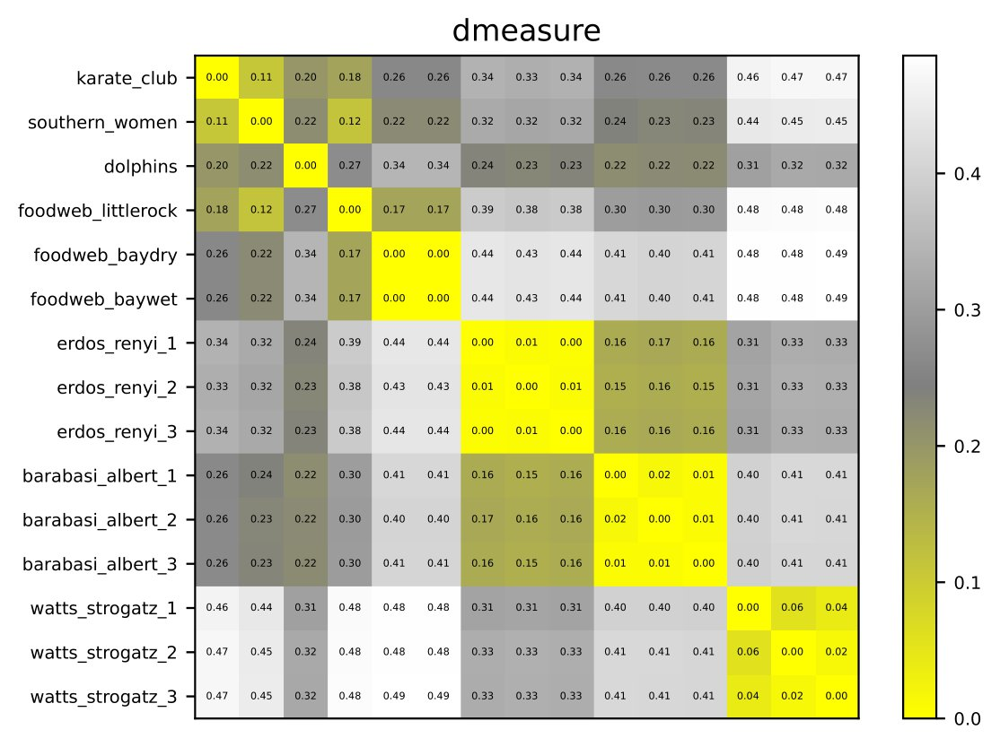

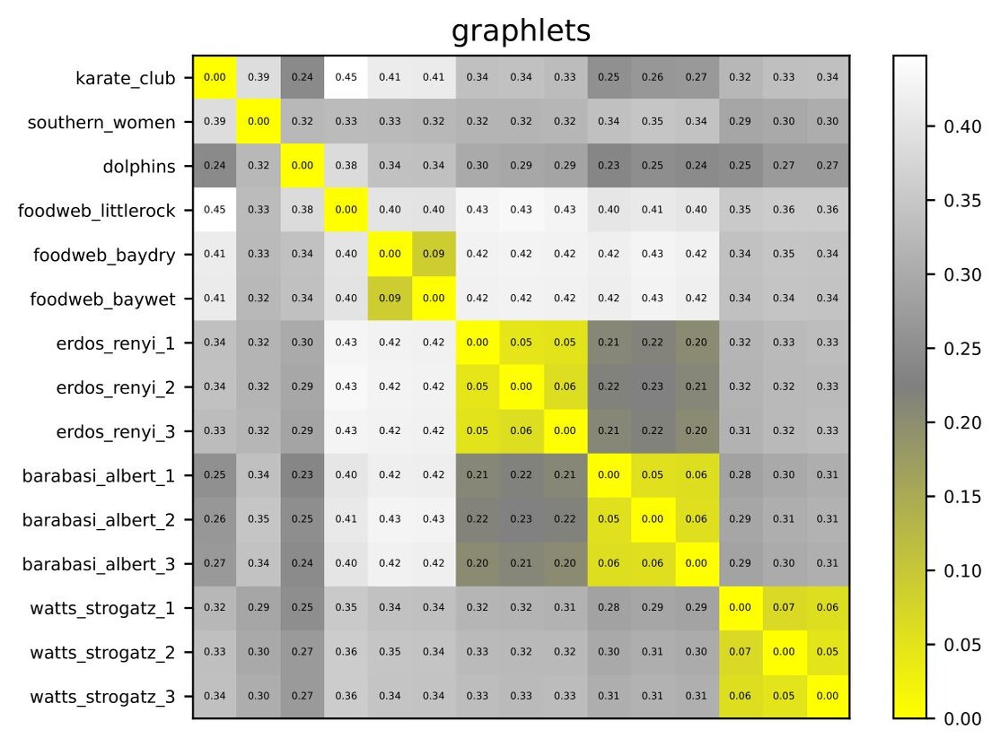

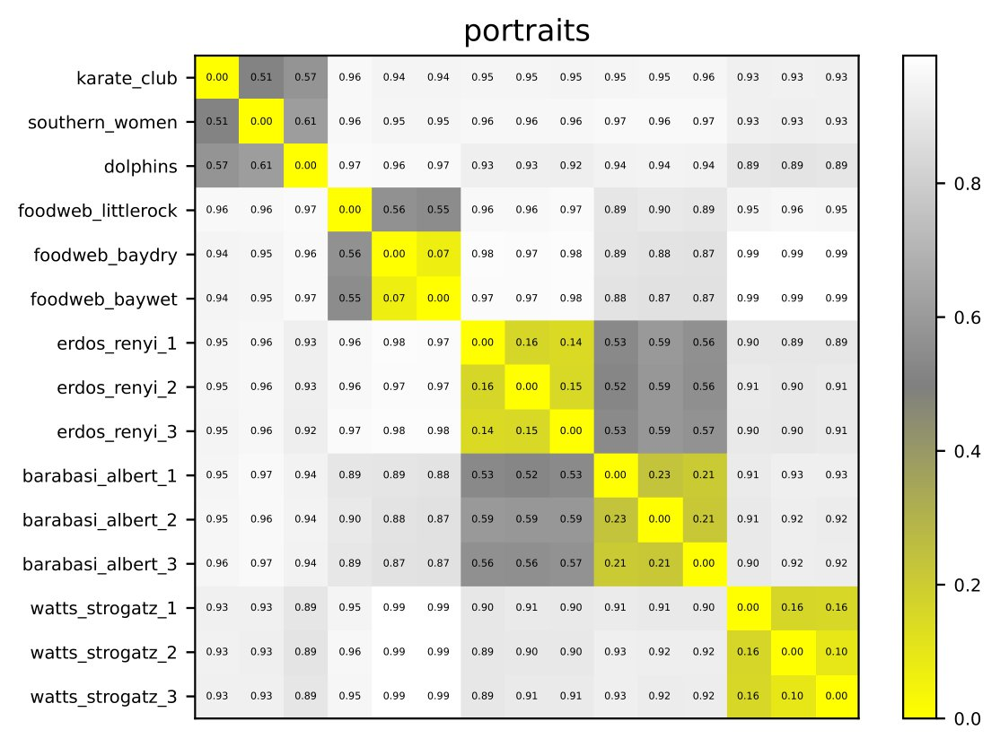

# Lab 13

###### Introduction to Network Analysis 2023/24 (xiii)

## Pegs and bands, wiring diagrams vs block models

### II. Wiring diagrams vs block models

You are given six real networks with less than $200$ nodes.

+ Zachary karate club network ([karate_club.net](http://lovro.fri.uni-lj.si/ina/nets/karate_club.net))
+ Davis southern women network ([southern_women.net](http://lovro.fri.uni-lj.si/ina/nets/southern_women.net))
+ Lusseau bottlenose dolphins network ([dolphins.net](http://lovro.fri.uni-lj.si/ina/nets/dolphins.net))
+ US college football network ([american_football.net](http://lovro.fri.uni-lj.si/ina/nets/american_football.net))
+ Slovenian highways network from $2010$ ([highways.net](http://lovro.fri.uni-lj.si/ina/nets/highways.net))
+ Little Rock Lake food web ([foodweb_littlerock.net](http://lovro.fri.uni-lj.si/ina/nets/foodweb_littlerock.net))



1. **(code)** Browse your network library for implementations of network layout algorithms and methods for network visualization. Try to clearly visualize the networks with a wiring diagram produced by different layout algorithms. You can use node sizes to show their centrality and node colors to show network community, core-periphery or other structure.



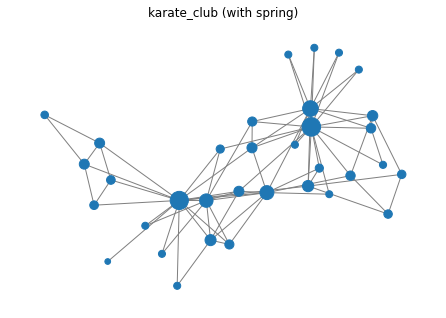

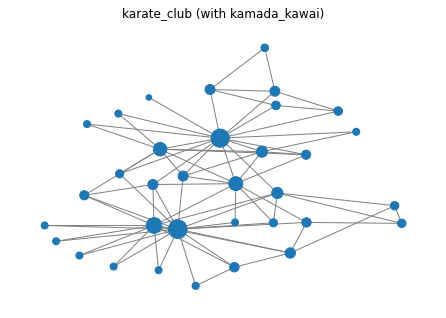

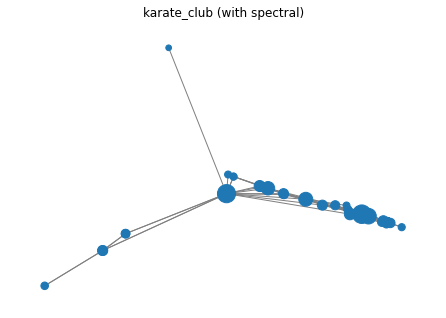

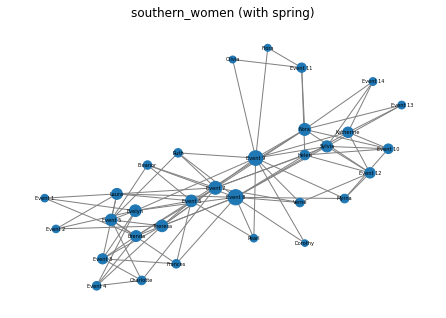

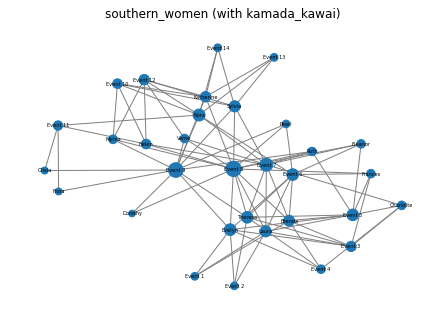

...

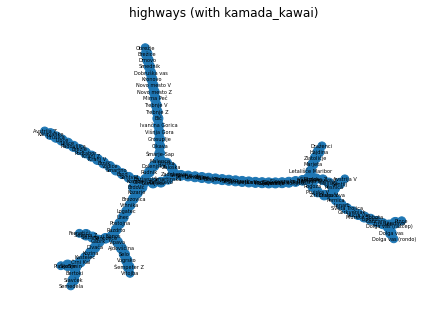

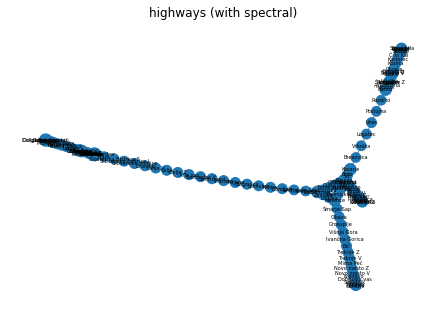

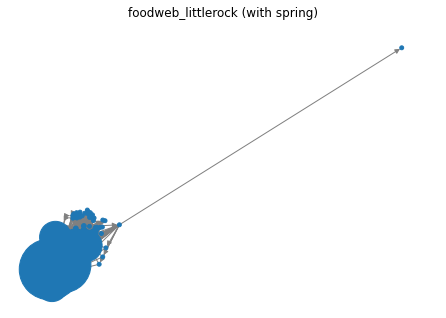

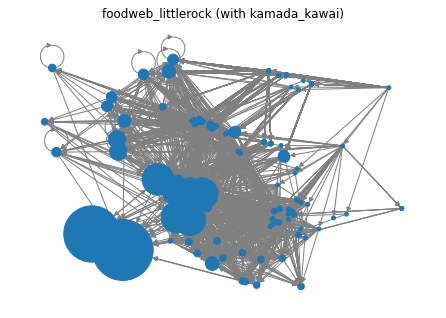

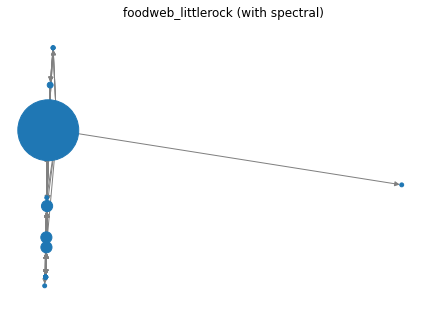

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from cdlib import algorithms
import utils

def plot_wiring_diagram(G, layout=None, C=None, S=None, label="wiring", save_figs=True):
    # If no layout provided, use spring layout by default
    if layout is None:
        layout = nx.spring_layout(G)

    # Define the node colors based on communities
    # if community detection has been applied, each node is colored based on its community
    colors = None
    if C is not None:
        colors = [0] * len(G)
        for c, comm in enumerate(C.communities):
            for i in comm:
                colors[i] = c

    # Define the node sizes based on pagerank
    # if pagerank has been calculated, node size is determined based on its pagerank score
    sizes = None
    if S is not None:
        sizes = [100 * len(G)] * len(G)
        for i in G.nodes():
            sizes[i] *= S[i]

    # Define labels for the nodes
    labels = {i: "" if G.nodes[i]['label'].isdigit() else G.nodes[i]['label'] for i in G.nodes()}

    plt.figure()

    nx.draw(G, pos=layout, node_color=colors, node_size=sizes, labels=labels, font_size=5, edge_color='gray')
    plt.title(f"{G.name} (with {label})")

    if save_figs:
        plt.savefig(G.name + "." + label + ".pdf", bbox_inches='tight')
    else:
        plt.show()
    plt.close()


def metadata_parser(label, value):
    mdata = {"label": label}
    if value is not None and value.isdigit():
        mdata["cluster"] = int(value)
    else:
        mdata["cluster"] = 0

    return mdata


LAYOUTS = {"spring": nx.spring_layout, "kamada_kawai": nx.kamada_kawai_layout, "spectral": nx.spectral_layout}

for name in ["karate_club", "southern_women", "dolphins", "american_football", "highways", "foodweb_littlerock"]:
    G = utils.read_pajek(name, label_parser=metadata_parser)
    # Perform community detection using Infomap algorithm
    # C = algorithms.infomap(G)
    # Compute PageRank of the graph
    S = nx.pagerank(G)

    # For each specified layout, plot the wiring diagram of the graph
    for label, L in LAYOUTS.items():
        # plot_wiring_diagram(G, layout=L(G), C=C, S=S, label=label)
        plot_wiring_diagram(G, layout=L(G), C=None, S=S, label=label, save_figs=False)

2. **(code)** Visualize the networks also with a block model, where you plot the network adjacency matrix with nodes order according to their clustering affiliation (e.g., community structure).

In [ ]:
# Function to plot a block model of a network
def plot_block_model(G, C):
    plt.figure()

    comms = sorted(C.communities, key=len)

    # Create a list of nodes sorted by community
    nodes = [i for c in comms for i in c]
    # Generate adjacency matrix for G
    A = nx.adjacency_matrix(G, nodelist=nodes).todense()
    # Display the adjacency matrix as an image
    plt.imshow(A, cmap='binary', interpolation='nearest')

    # Initialize xy coordinate for block separator
    xy = 0
    for c in comms[:-1]:
        # Increment xy by the size of the current community
        xy += len(c)
        # Draw horizontal and vertical lines separating blocks
        plt.plot([xy - 0.5, xy - 0.5], [-0.5, len(G) - 0.5], '-g')
        plt.plot([-0.5, len(G) - 0.5], [xy - 0.5, xy - 0.5], '-g')

    plt.yticks(range(len(G)), labels=[G.nodes[i]['label'] for i in nodes], size=2)
    plt.xticks([])

    plt.savefig(G.name + ".blocks.pdf", bbox_inches='tight')
    plt.close()


for name in ["karate_club", "southern_women", "dolphins", "american_football", "highways", "foodweb_littlerock"]:
    G = utils.read_pajek(name, label_parser=metadata_parser)
    C = algorithms.infomap(G)
    plot_block_model(G, C)

## Karate club blocks
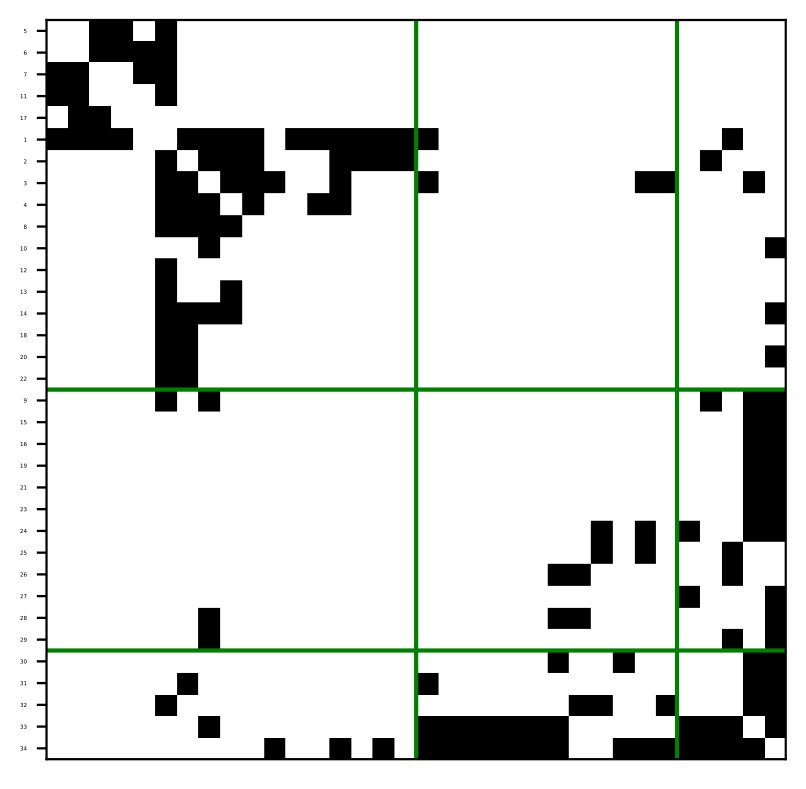

## Southern women blocks
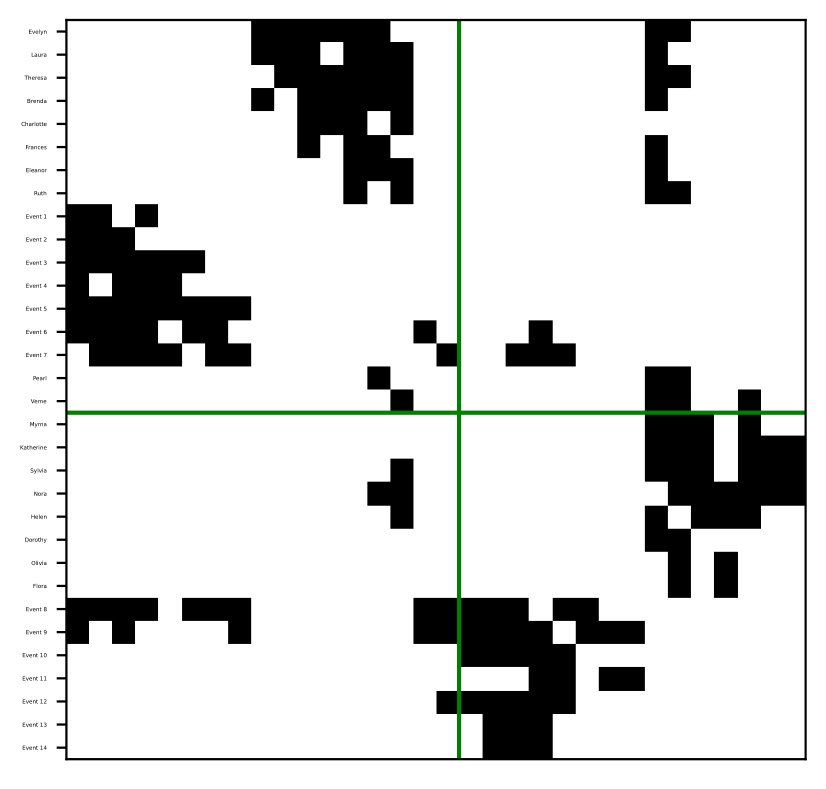

## Dolphins blocks
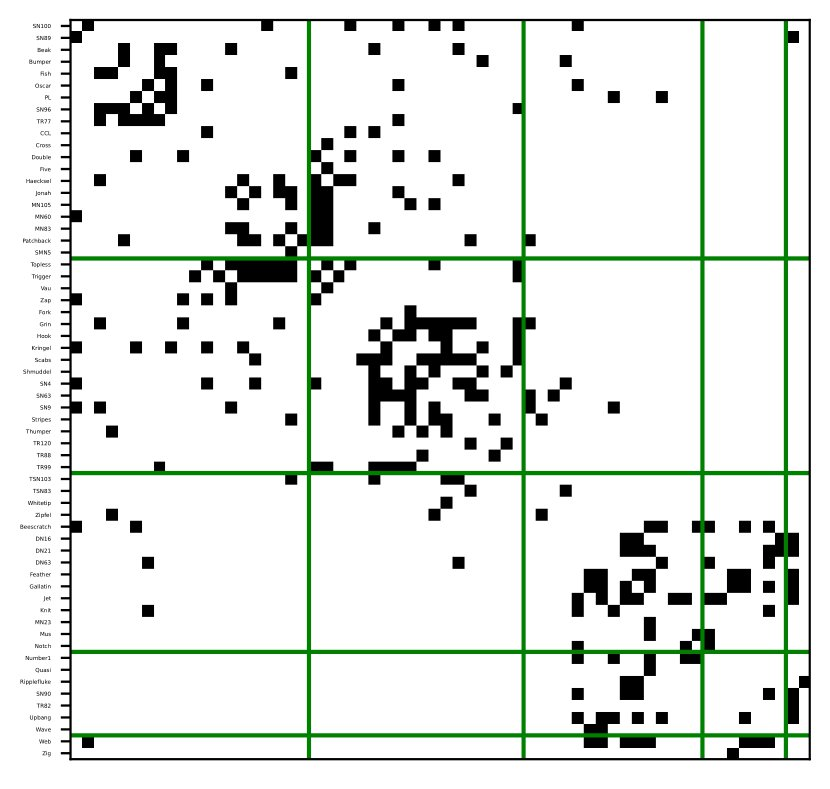

## American football blocks
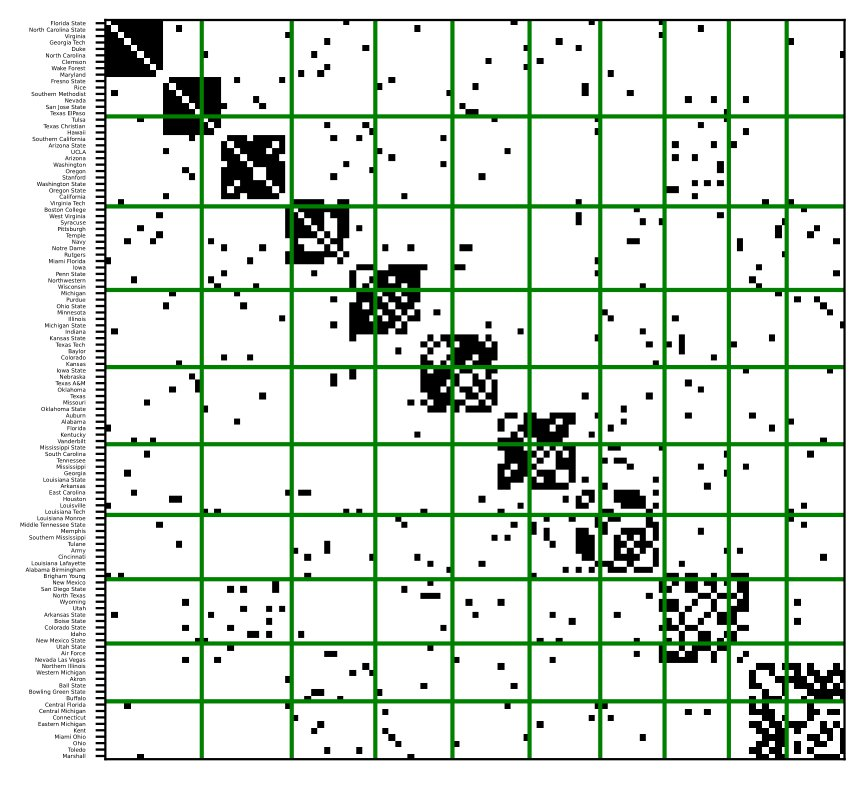

## Highways blocks
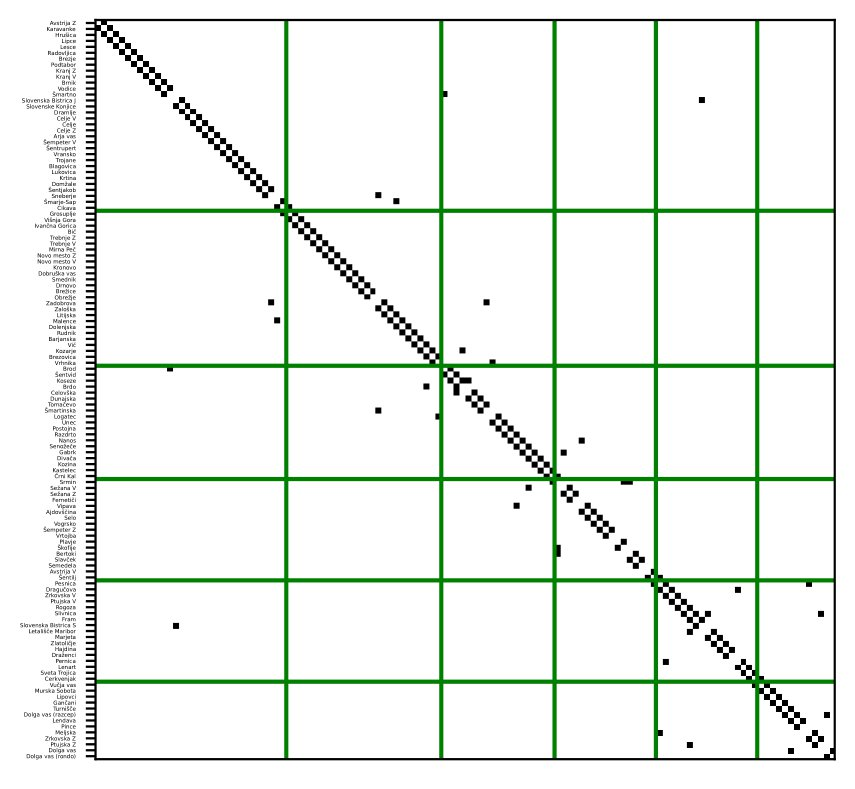

## Foodweb littlerock blocks
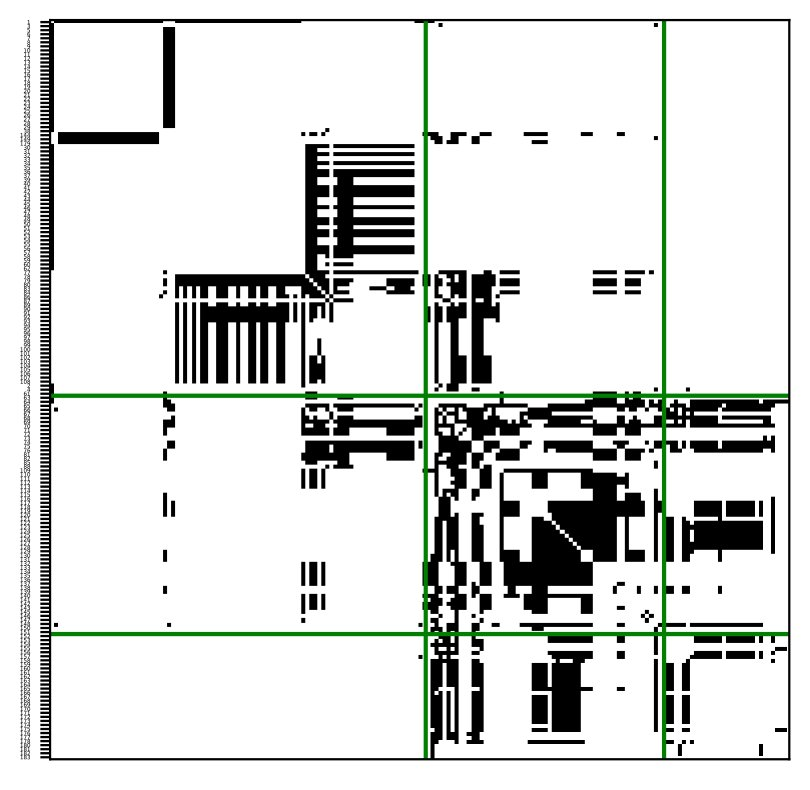